# LIGTH-GBM SIMPLE CQR MODELS
This notebook contains the code for the Conformal Quantile Regression (CQR) calibration and evaluation of the two ligthGBM models previously trained without covariates using the Darts library.

Both versions of the model are evaluated on their respective test sets, with the MinMax-scaled model also evaluated on a dedicated test set.

In [ ]:
# We install darts
!pip install u8darts[torch] --quiet

In [ ]:
# Necessary imports to read the datasets
import pandas as pd
import zipfile
import os
import numpy as np
import matplotlib.pyplot as plt
import joblib
from darts import TimeSeries
from darts.models import LightGBMModel
from darts.dataprocessing.transformers import Scaler
from darts import concatenate, metrics
from darts.models import ConformalQRModel

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load model
model = LightGBMModel.load("/content/drive/MyDrive/Colab Notebooks/TFG/data/02_models/lightGBM/simple/lightgbm_model.pkl")

In [ ]:
# We start with the minmax scaling

In [ ]:
# Load the test data
test_data = joblib.load('/content/drive/MyDrive/Colab Notebooks/TFG/data/01_datasets/train_test/scaled_test.pkl')

# Extract components
scaled_val_series = test_data['validation']        # validation not used in our case
scaled_calib_test_series = test_data['calib_test']
scalers_test = test_data['scalers']           # the scalers to reescale the series later

# Reuse the same sorted meter IDs to align
meter_ids_test = sorted(scaled_calib_test_series.keys())

# Build aligned lists
test_series_scaled = [scaled_calib_test_series[meter_id] for meter_id in meter_ids_test]

print(f"Loaded {len(test_series_scaled)} time series for testing.")

Loaded 60 time series for testing.


In [ ]:
# Constants
start_date = pd.Timestamp("2023-11-6")
horizon = 7
quantiles = [0.05, 0.5, 0.95]
pred_kwargs={"predict_likelihood_parameters": True, "verbose": True}

# Initialize the conformal quantile regression model
cp_model = ConformalQRModel(
    model=model,
    quantiles=quantiles,
    symmetric=False
    # if cal_length is None, it considers all calibration scores
)
q_interval = cp_model.q_interval  # [(0.05, 0.95)]
q_range = cp_model.interval_range  # [0.9]

# Prepare to collect results
all_hfcs = {}
all_bt_results = {}

# We loop over each time series
for meter_id, ts in zip(meter_ids_test, test_series_scaled):
    # Historical forecasts
    hfcs = cp_model.historical_forecasts(
        series=ts,
        forecast_horizon=7,
        start=start_date,
        last_points_only=False,
        stride=7,
        **pred_kwargs,
    )

    scaler = scalers_test[meter_id]
    widths = []

    for forecast in hfcs:
        q05 = forecast["Consumption per meter_q0.05"]
        q95 = forecast["Consumption per meter_q0.95"]
        q05_orig = scaler.inverse_transform(q05)
        q95_orig = scaler.inverse_transform(q95)
        width = (q95_orig - q05_orig).values()
        widths.append(width)

    mean_width = np.mean([np.mean(w) for w in widths])

    # We evaluate the already-generated historical forecasts
    bt = cp_model.backtest(
        ts,
        historical_forecasts=hfcs,
        last_points_only=False,
        retrain=False,
        metric=[metrics.mic, metrics.miw],
        metric_kwargs={"q_interval": q_interval},
    )
    df_results = pd.DataFrame({"Interval": q_range, "Coverage": bt[0], "Width": bt[1], "Width rescaled": mean_width})
    print(f"Results for meter {meter_id}:\n", df_results, "\n")

    # Store results
    all_hfcs[meter_id] = hfcs
    all_bt_results[meter_id] = df_results

# We combine results across meters
combined_results = pd.concat(all_bt_results.values(), keys=all_bt_results.keys())
combined_results.reset_index(level=1, drop=True, inplace=True)


conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 424.26it/s]


Results for meter 0801501002_Badalona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.249705       24.528517 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 445.07it/s]


Results for meter 0801503008_Badalona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.317847       30.201802 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 296.41it/s]


Results for meter 0801901042_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.394383        6.136595 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 275.21it/s]


Results for meter 0801902035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.159824        1.948251 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 421.24it/s]


Results for meter 0801902037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.216439        3.634019 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 470.55it/s]


Results for meter 0801902052_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9     0.625  0.33076        3.744205 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 311.00it/s]


Results for meter 0801902102_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.317425         4.25349 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 456.81it/s]


Results for meter 0801903006_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.785714  0.347368        3.577894 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 438.51it/s]


Results for meter 0801903035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.319615        0.894922 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 289.64it/s]


Results for meter 0801903040_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.387222        1.053245 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 448.35it/s]


Results for meter 0801903048_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.286398        6.650156 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 431.87it/s]


Results for meter 0801903060_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.451033        5.660464 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 428.41it/s]


Results for meter 0801903067_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.301028        1.047578 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 456.49it/s]


Results for meter 0801903081_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.328469        2.841253 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 311.98it/s]


Results for meter 0801904008_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.785714  0.190145        7.849182 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 391.76it/s]


Results for meter 0801904030_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.286631         3.67747 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 448.91it/s]


Results for meter 0801905054_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.220334       22.441003 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 469.96it/s]


Results for meter 0801905091_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.372717        7.868055 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 298.21it/s]


Results for meter 0801906002_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.386254        3.167283 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 412.96it/s]


Results for meter 0801906010_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.326472        8.925755 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 414.79it/s]


Results for meter 0801906041_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.318758        8.791332 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 427.92it/s]


Results for meter 0801907003_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.142561        2.845523 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 164.89it/s]


Results for meter 0801907011_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.320513        3.423081 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 418.89it/s]


Results for meter 0801907013_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.285985        2.545262 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 434.13it/s]


Results for meter 0801907025_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.471432       13.101094 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 347.38it/s]


Results for meter 0801907037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.393013        6.924896 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 422.83it/s]


Results for meter 0801907084_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.821429  0.525404       13.513391 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 394.96it/s]


Results for meter 0801907088_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.803571  0.171203       11.097394 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 175.39it/s]


Results for meter 0801907115_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.254547        18.91029 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 483.31it/s]


Results for meter 0801908002_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.242397        4.891578 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 437.92it/s]


Results for meter 0801908022_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.342489        5.116791 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 450.12it/s]


Results for meter 0801908043_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.218614        0.894131 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 339.29it/s]


Results for meter 0801908046_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.341704        2.668705 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 252.98it/s]


Results for meter 0801908049_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.282341       15.350897 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 319.25it/s]


Results for meter 0801908061_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.355972         1.65171 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 275.95it/s]


Results for meter 0801908088_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.964286  0.29155        6.635687 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 407.22it/s]


Results for meter 0801908111_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.625  0.342331        8.773932 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 466.07it/s]


Results for meter 0801909015_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.420122       11.402101 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 317.14it/s]


Results for meter 0801909017_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.289868       10.925125 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 250.32it/s]


Results for meter 0801910053_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.527085        9.050052 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 448.96it/s]


Results for meter 0801910054_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.812099        8.608246 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 442.45it/s]


Results for meter 0801910080_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.803571  0.357955        1.664493 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 436.20it/s]


Results for meter 0801910092_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.700349        2.647321 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 284.96it/s]


Results for meter 0801910119_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.946429  0.37435        1.635912 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 199.79it/s]


Results for meter 0801910235_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.821429  0.28148        0.776886 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 434.87it/s]


Results for meter 0810101040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.407253        8.145053 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 319.65it/s]


Results for meter 0810101041_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.202218        4.349709 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 439.64it/s]


Results for meter 0810102007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.678571  0.511407        7.175044 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 395.32it/s]


Results for meter 0810102008_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.222308        2.805532 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 390.24it/s]


Results for meter 0810102017_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.404594        5.959673 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 422.14it/s]


Results for meter 0810102033_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.756116       23.696667 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 420.63it/s]


Results for meter 0810102045_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.441823       10.948369 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 450.43it/s]


Results for meter 0810102048_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.171454        4.152604 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 315.41it/s]


Results for meter 0810104040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.390062        1.751379 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 369.50it/s]


Results for meter 0810105003_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.982143  0.16579        1.011318 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 408.28it/s]


Results for meter 0810105026_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.238514        6.769022 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 422.23it/s]


Results for meter 0810105032_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.231972        5.126575 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 421.19it/s]


Results for meter 0810106012_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  0.257933        2.277548 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 367.43it/s]


Results for meter 0810106013_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.401685        2.618983 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 398.19it/s]

Results for meter 0810106023_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.321419        1.922088 



In [ ]:
mean_coverage = combined_results["Coverage"].mean()
mean_width = combined_results["Width"].mean()
mean_width_rescaled = combined_results["Width rescaled"].mean()

print(f"Mean Coverage: {mean_coverage:.4f}")
print(f"Mean Width: {mean_width:.4f}")
print(f"Mean Width rescaled: {mean_width_rescaled:.4f}")

Mean Coverage: 0.9137
Mean Width: 0.3396
Mean Width rescaled: 6.8776


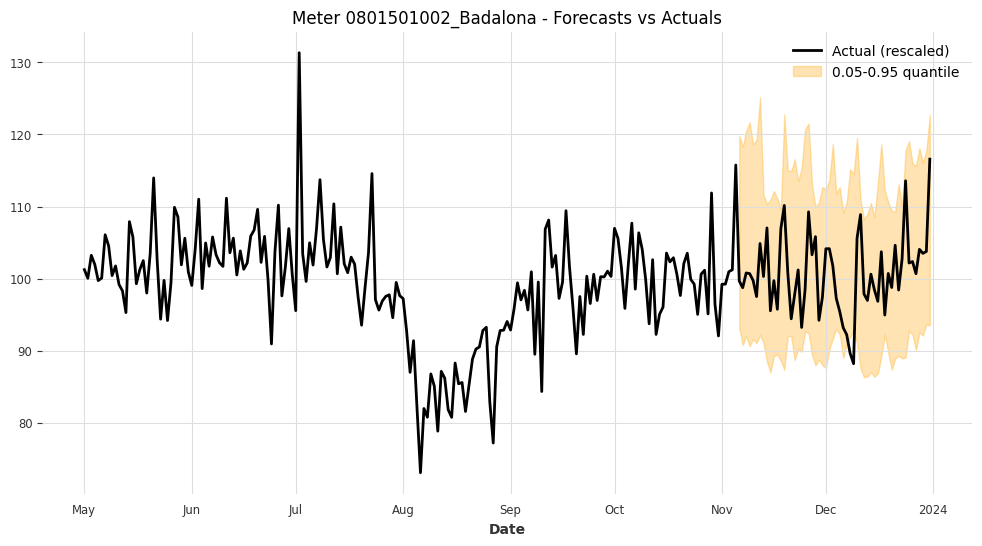

Meter 0801501002_Badalona - Coverage: 0.9643, Width: 24.5285



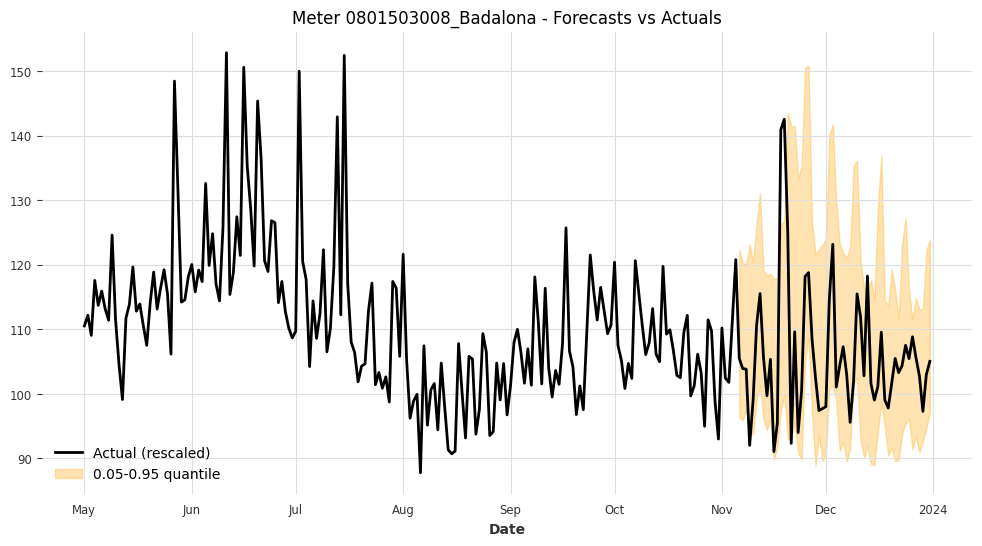

Meter 0801503008_Badalona - Coverage: 0.9107, Width: 30.2018



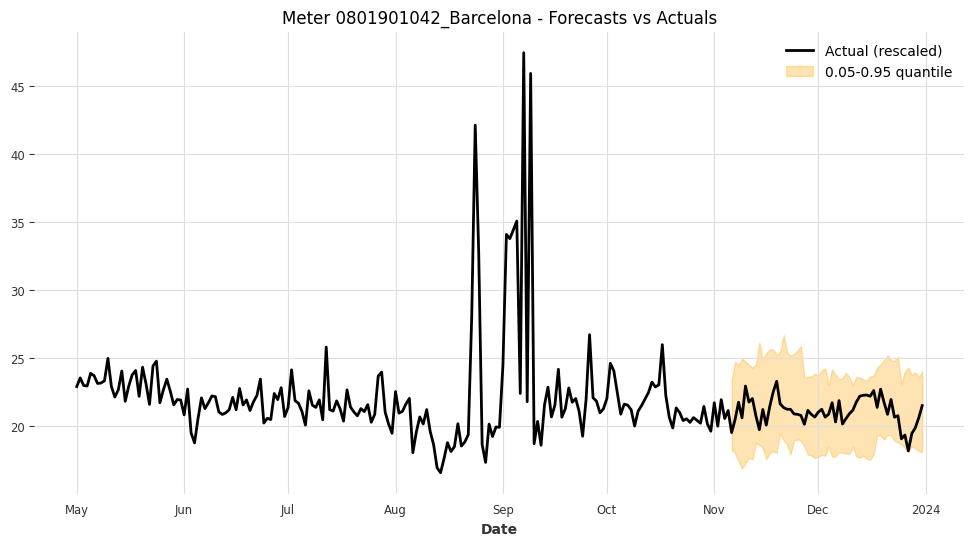

Meter 0801901042_Barcelona - Coverage: 1.0000, Width: 6.1366



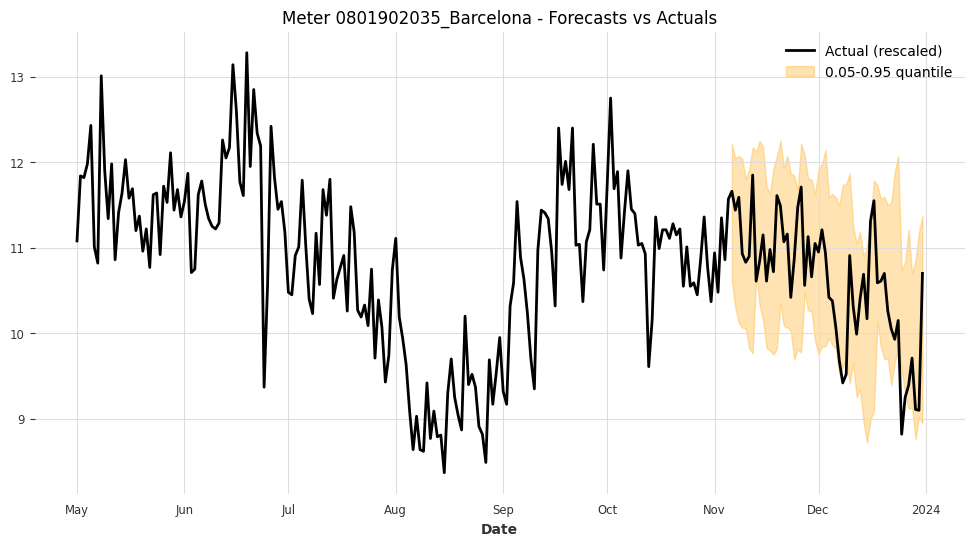

Meter 0801902035_Barcelona - Coverage: 0.9107, Width: 1.9483



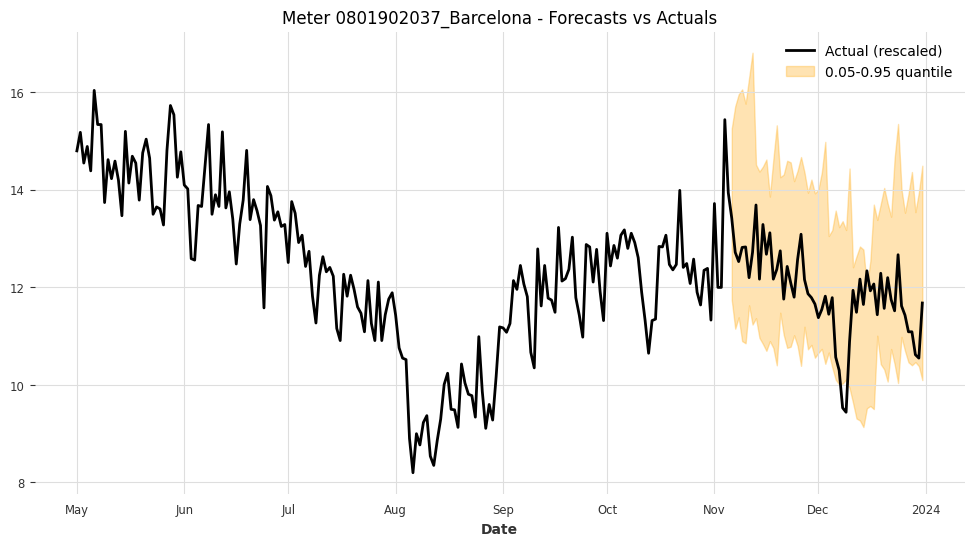

Meter 0801902037_Barcelona - Coverage: 0.9464, Width: 3.6340



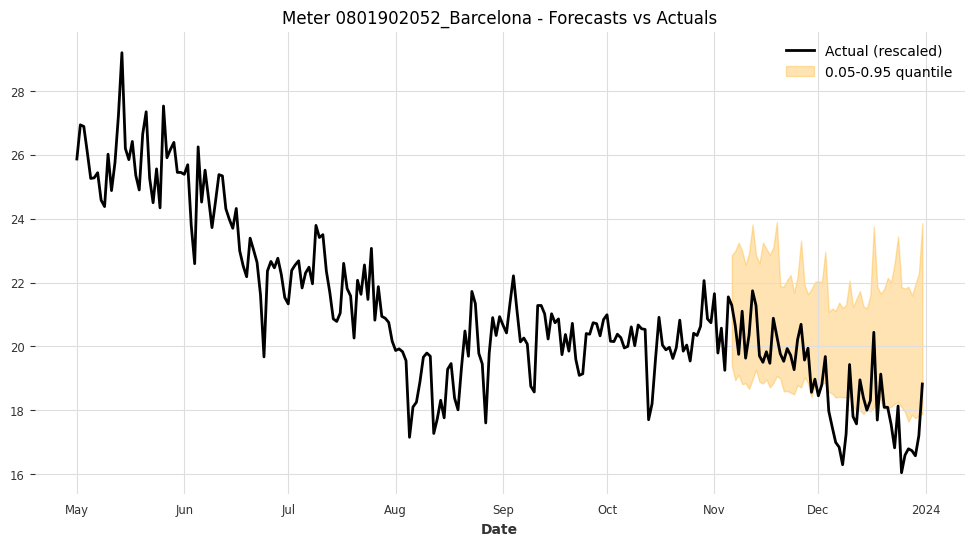

Meter 0801902052_Barcelona - Coverage: 0.6250, Width: 3.7442



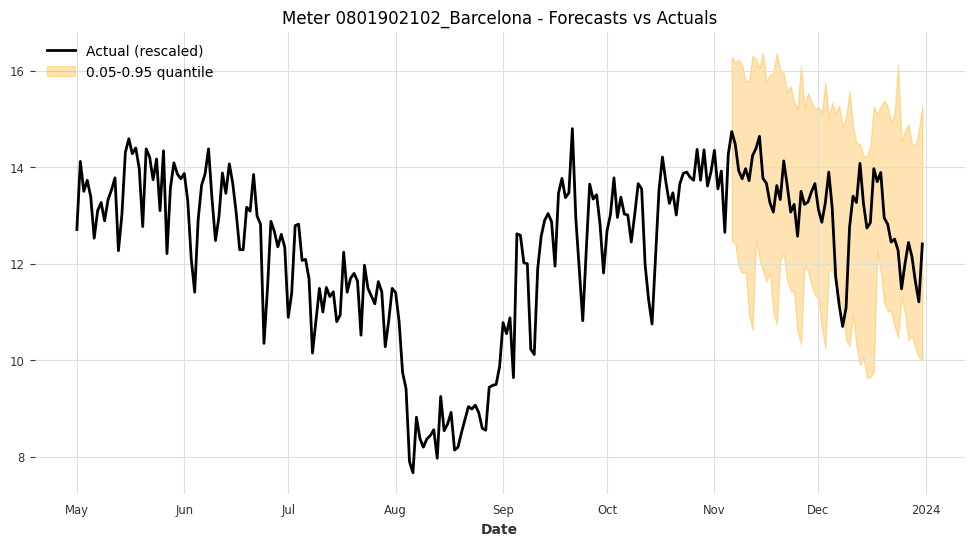

Meter 0801902102_Barcelona - Coverage: 0.9643, Width: 4.2535



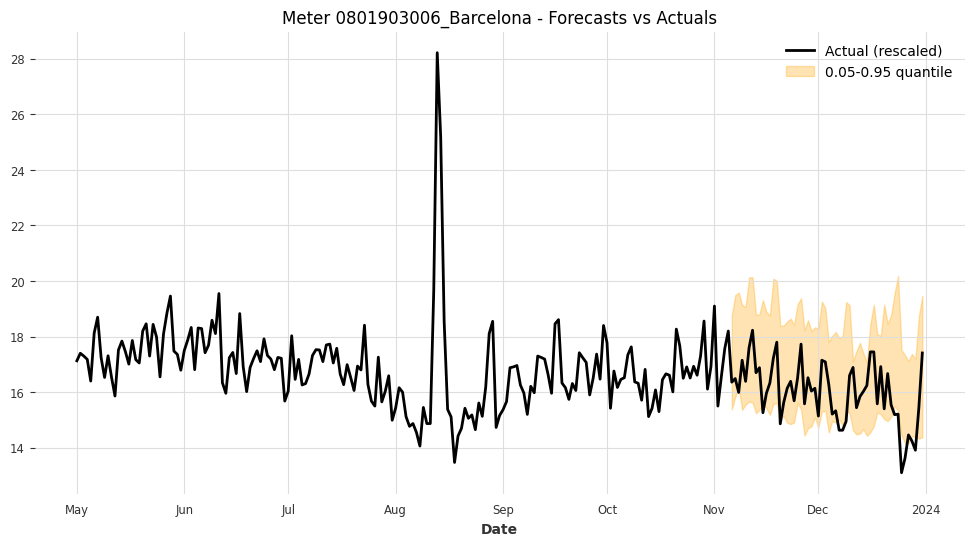

Meter 0801903006_Barcelona - Coverage: 0.7857, Width: 3.5779



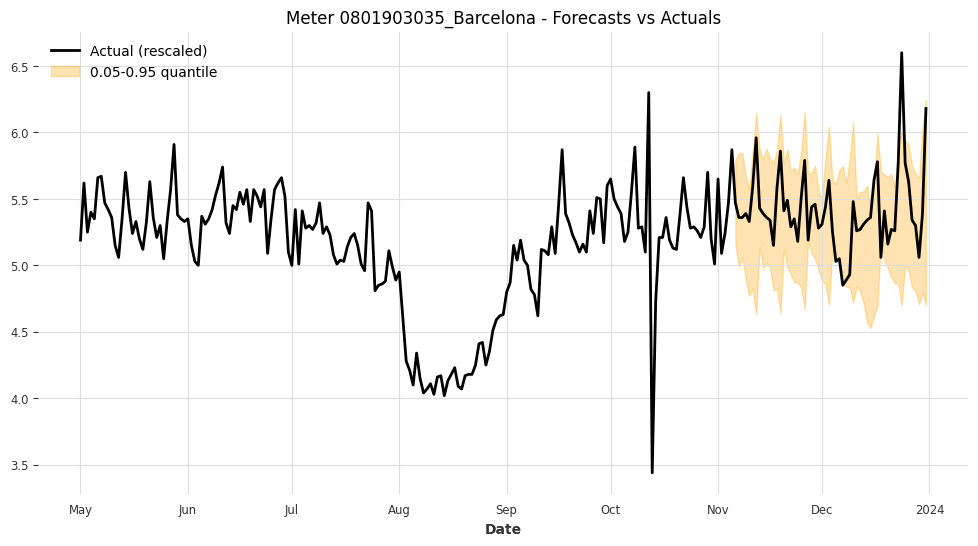

Meter 0801903035_Barcelona - Coverage: 0.9107, Width: 0.8949



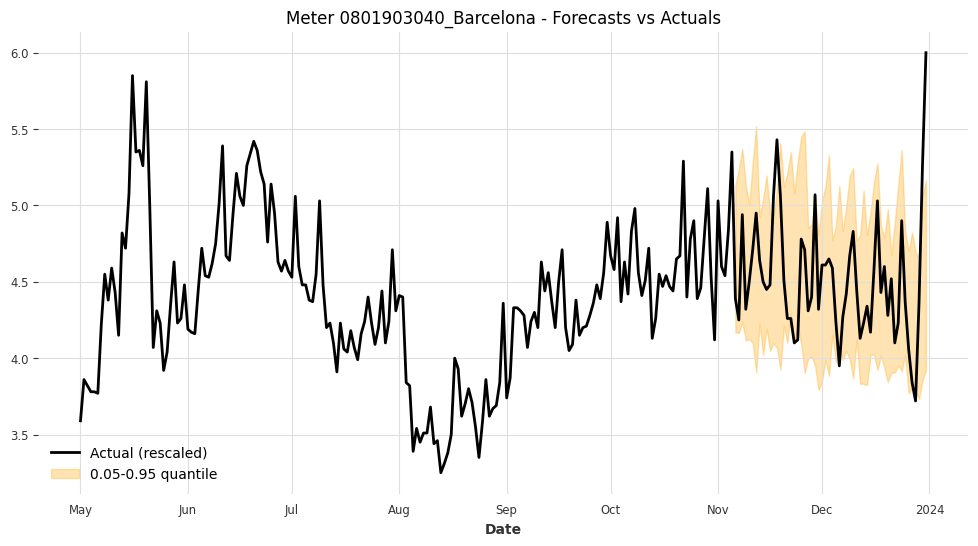

Meter 0801903040_Barcelona - Coverage: 0.8393, Width: 1.0532



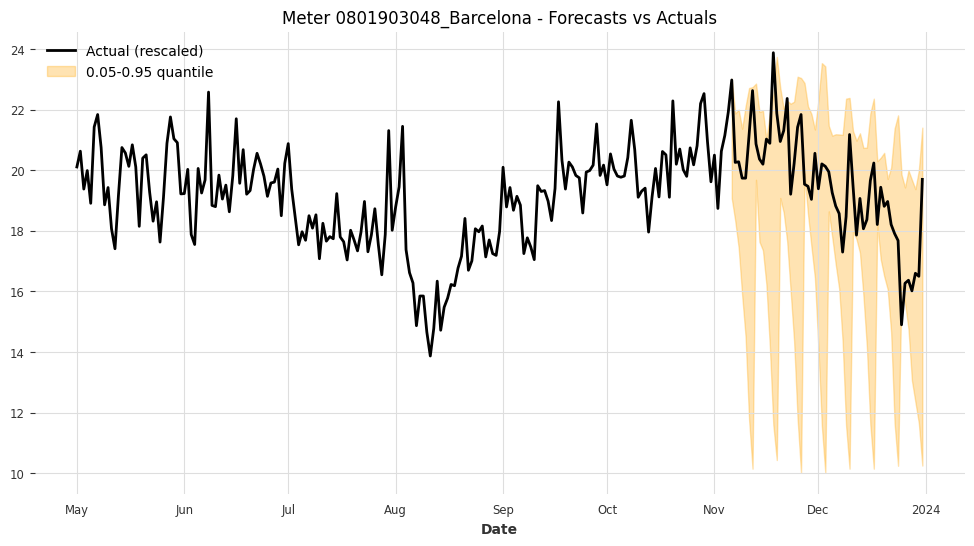

Meter 0801903048_Barcelona - Coverage: 0.8929, Width: 6.6502



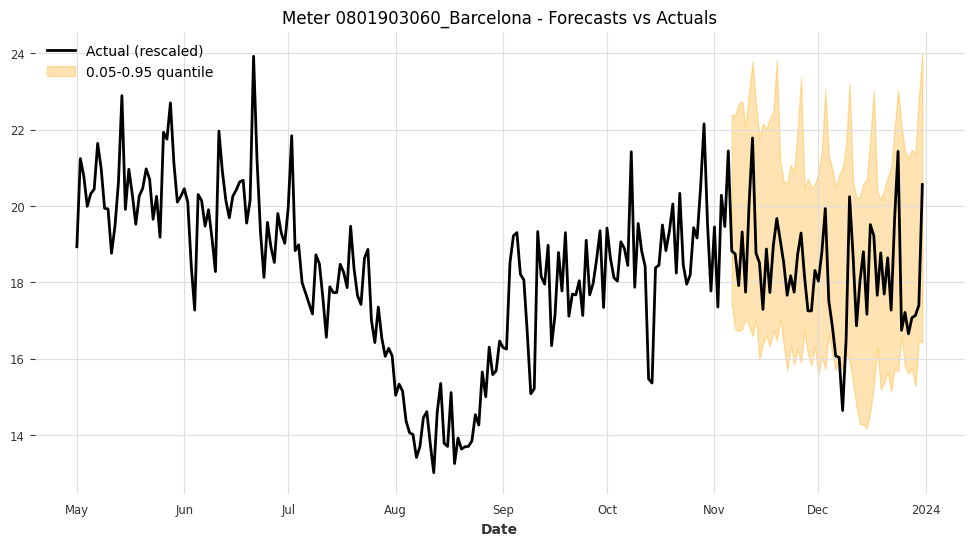

Meter 0801903060_Barcelona - Coverage: 0.9821, Width: 5.6605



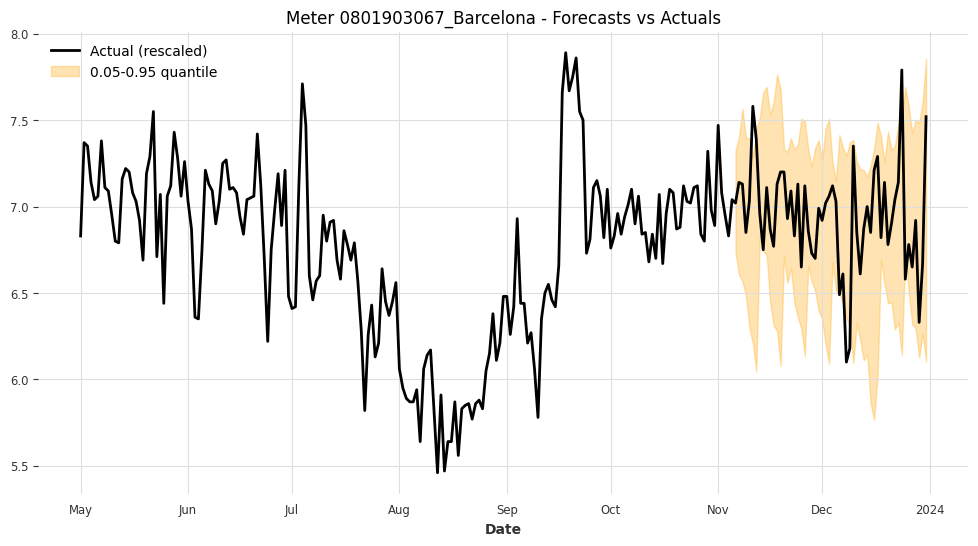

Meter 0801903067_Barcelona - Coverage: 0.8929, Width: 1.0476



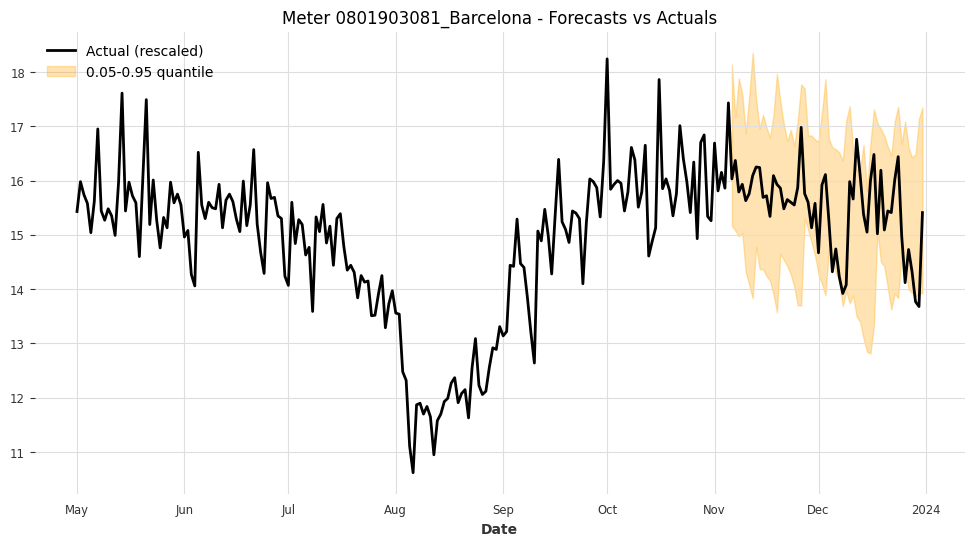

Meter 0801903081_Barcelona - Coverage: 0.8929, Width: 2.8413



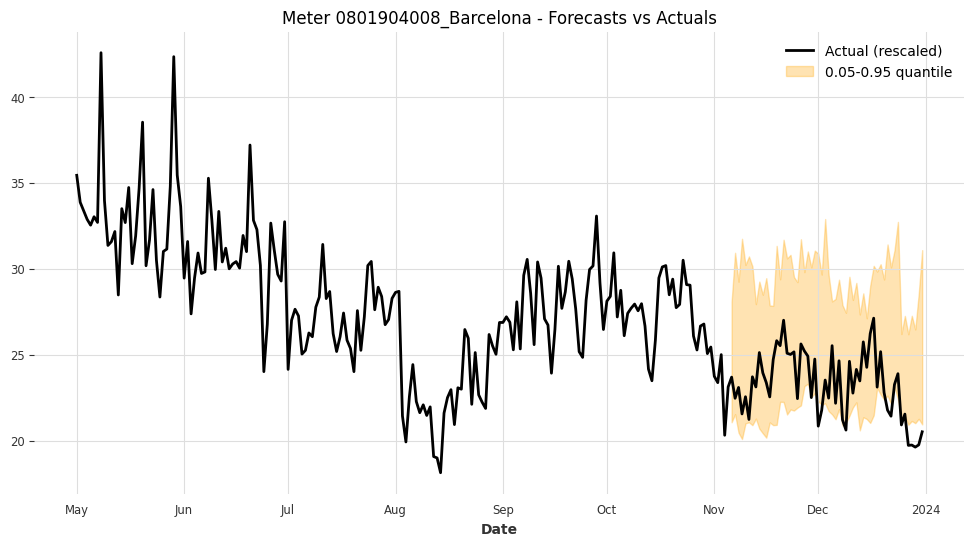

Meter 0801904008_Barcelona - Coverage: 0.7857, Width: 7.8492



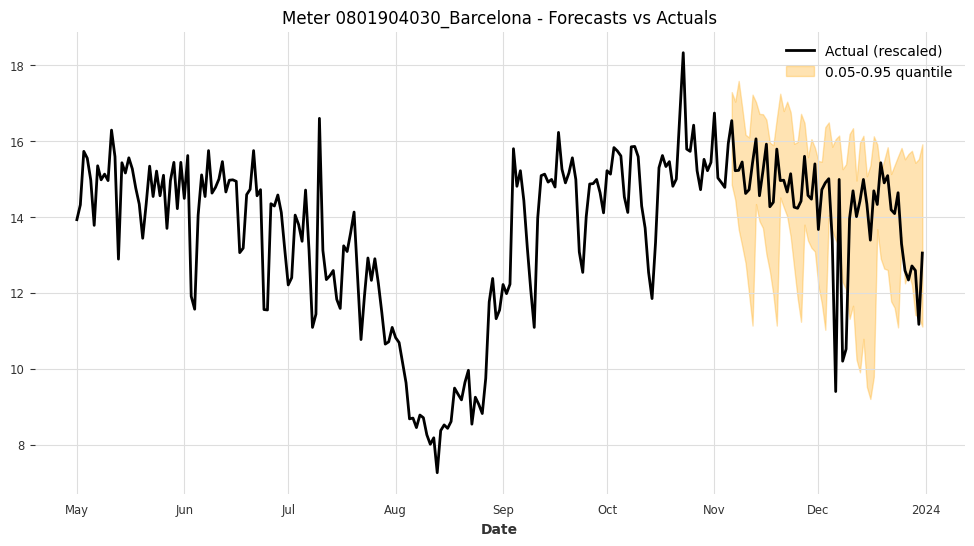

Meter 0801904030_Barcelona - Coverage: 0.8571, Width: 3.6775



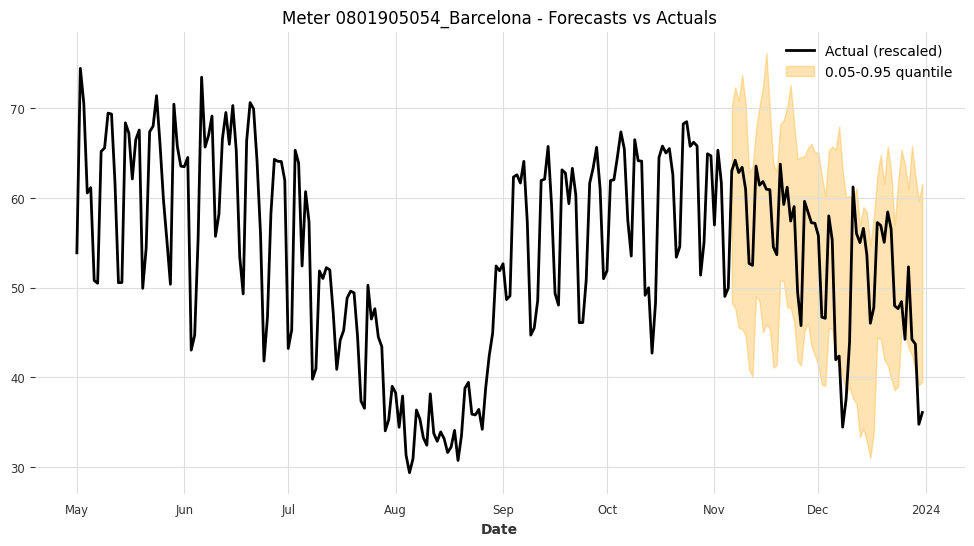

Meter 0801905054_Barcelona - Coverage: 0.8929, Width: 22.4410



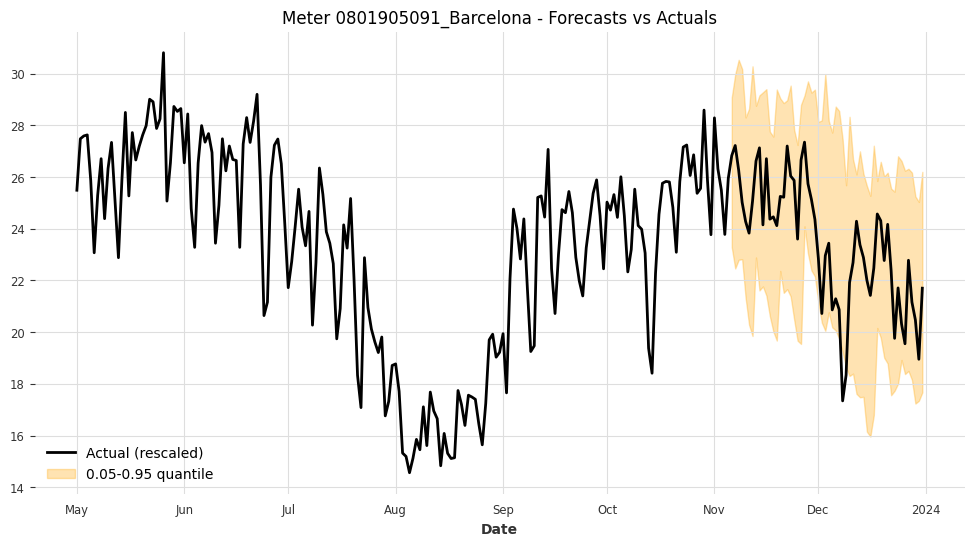

Meter 0801905091_Barcelona - Coverage: 0.9643, Width: 7.8681



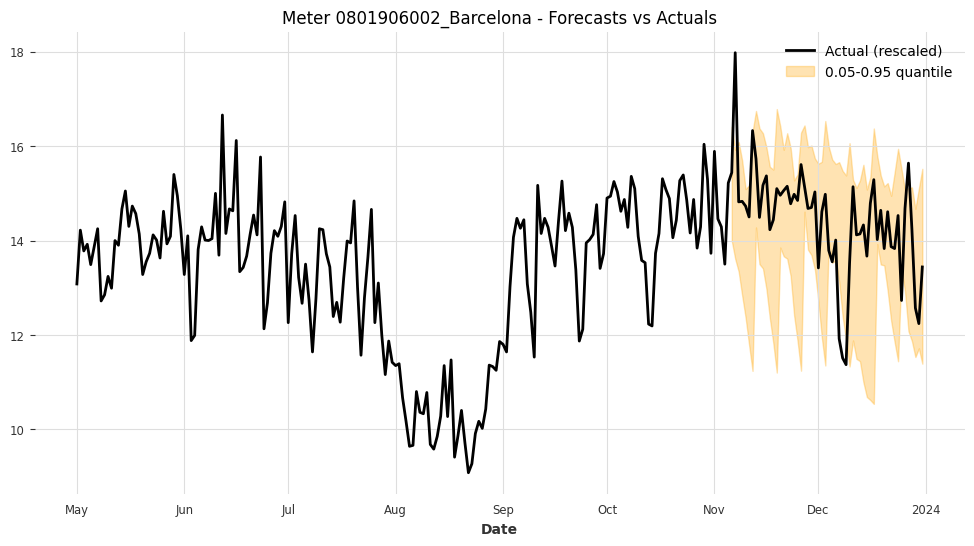

Meter 0801906002_Barcelona - Coverage: 0.8571, Width: 3.1673



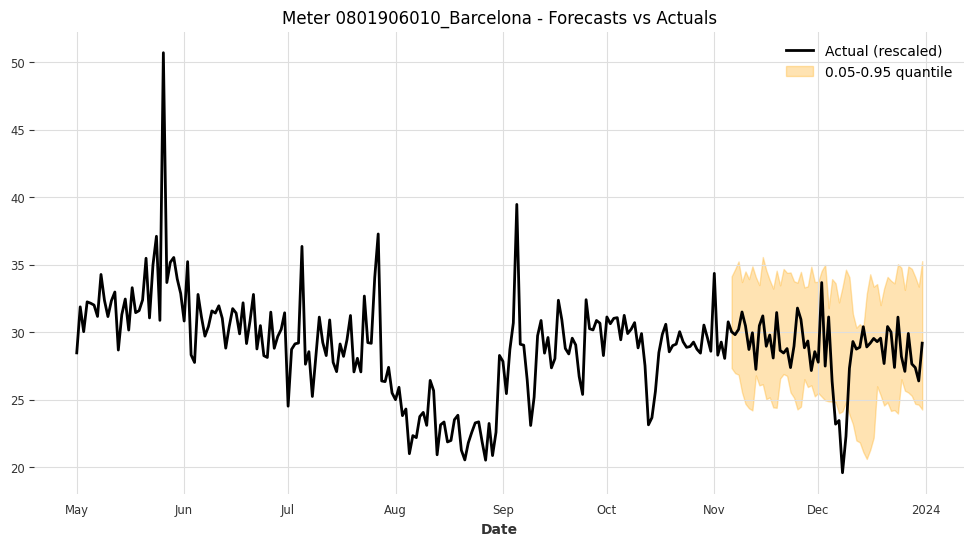

Meter 0801906010_Barcelona - Coverage: 0.9107, Width: 8.9258



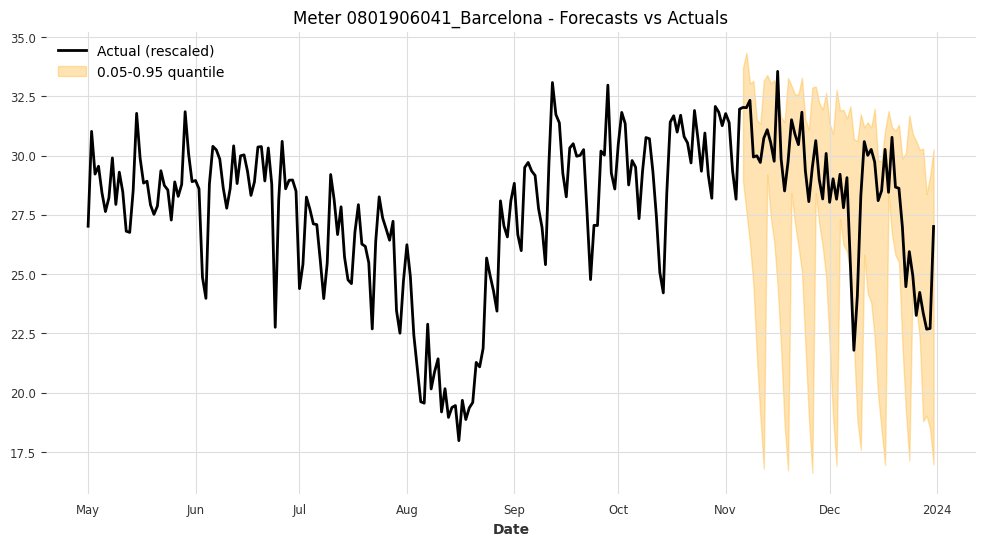

Meter 0801906041_Barcelona - Coverage: 0.9286, Width: 8.7913



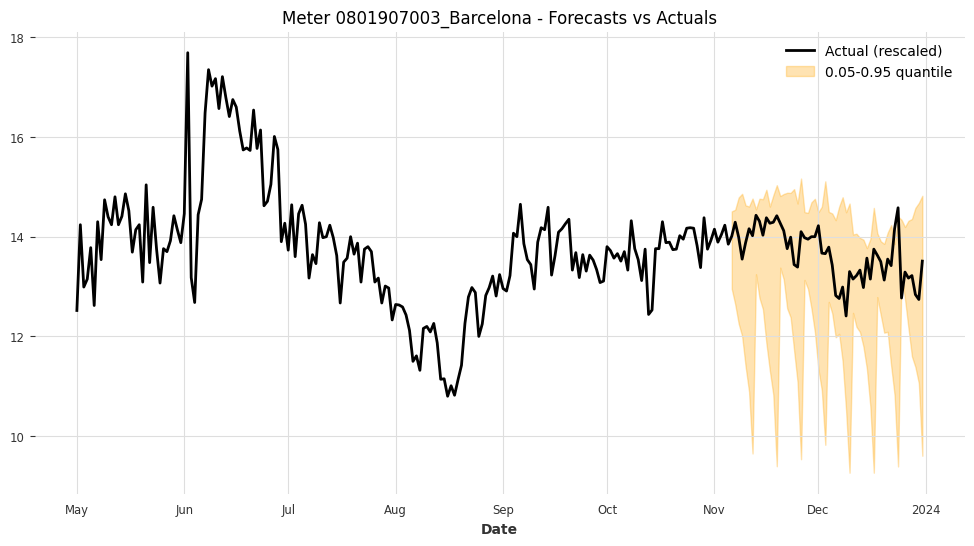

Meter 0801907003_Barcelona - Coverage: 0.9464, Width: 2.8455



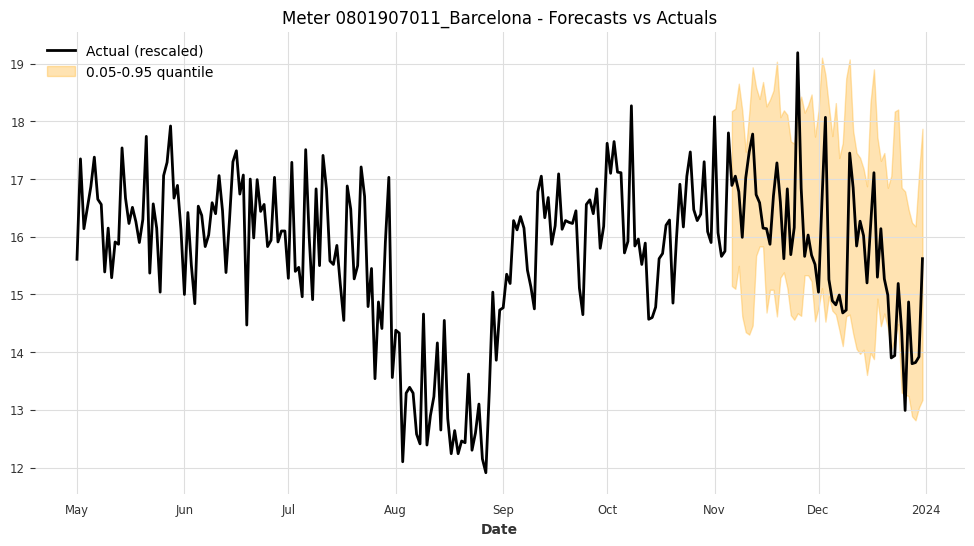

Meter 0801907011_Barcelona - Coverage: 0.9286, Width: 3.4231



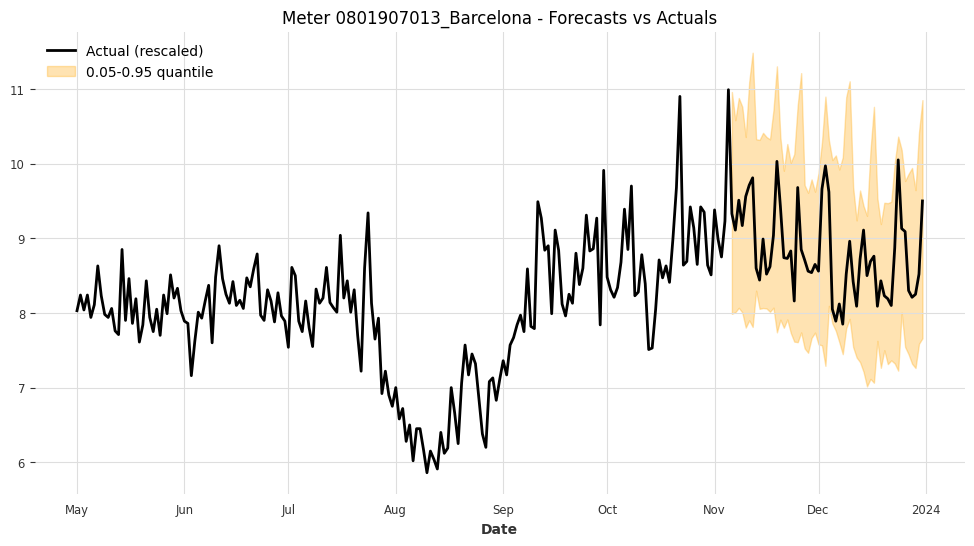

Meter 0801907013_Barcelona - Coverage: 1.0000, Width: 2.5453



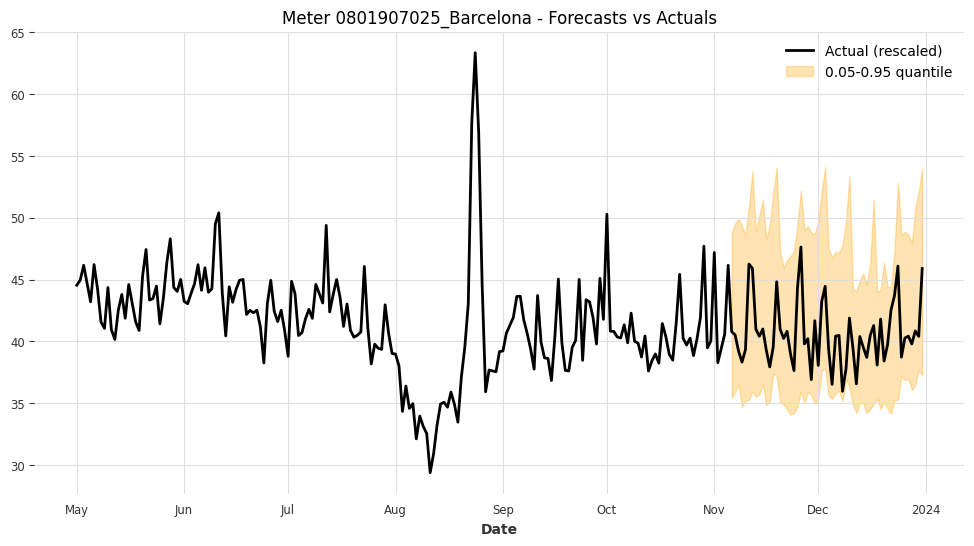

Meter 0801907025_Barcelona - Coverage: 1.0000, Width: 13.1011



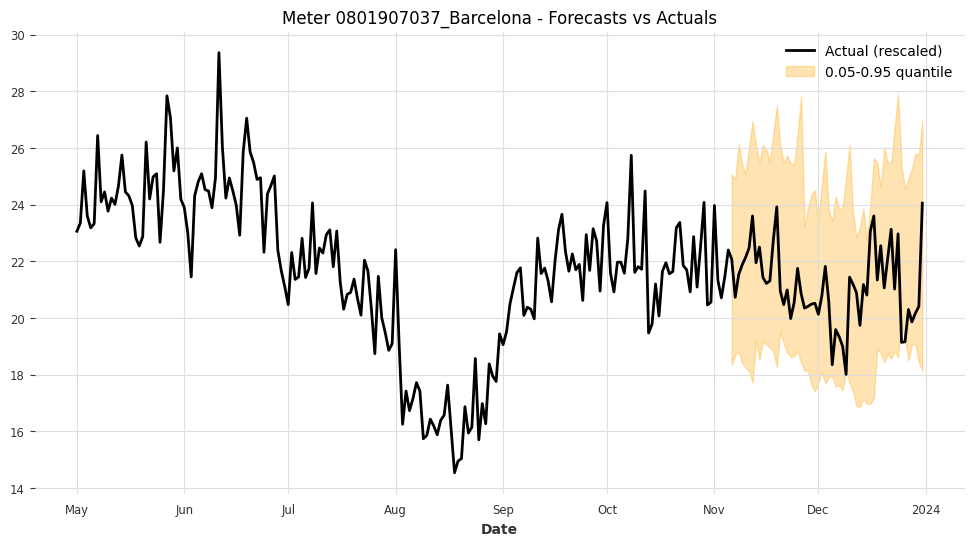

Meter 0801907037_Barcelona - Coverage: 0.9464, Width: 6.9249



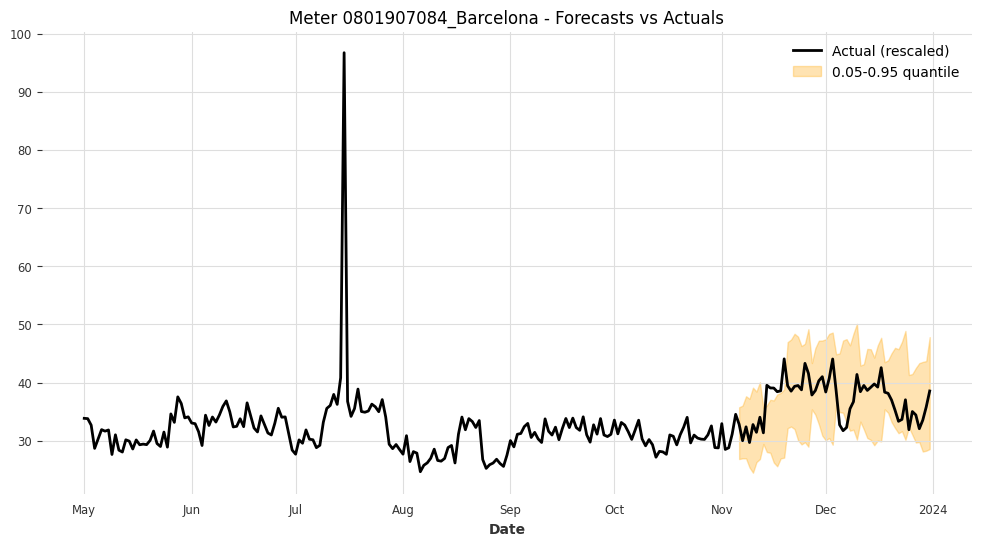

Meter 0801907084_Barcelona - Coverage: 0.8214, Width: 13.5134



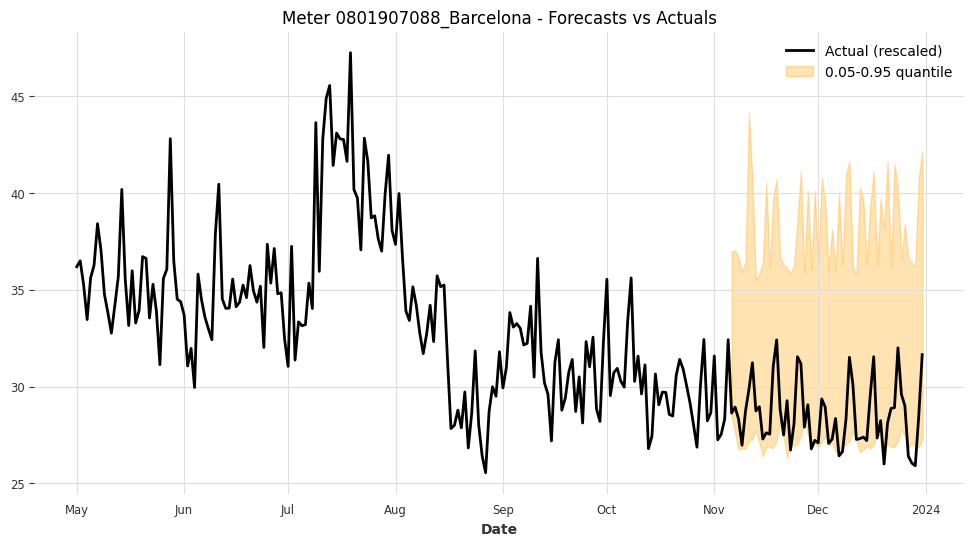

Meter 0801907088_Barcelona - Coverage: 0.8036, Width: 11.0974



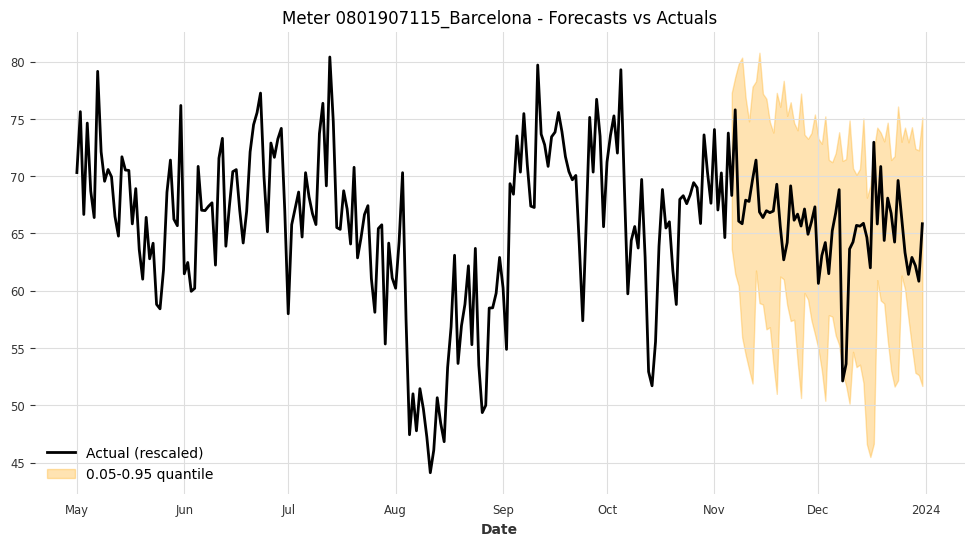

Meter 0801907115_Barcelona - Coverage: 0.9643, Width: 18.9103



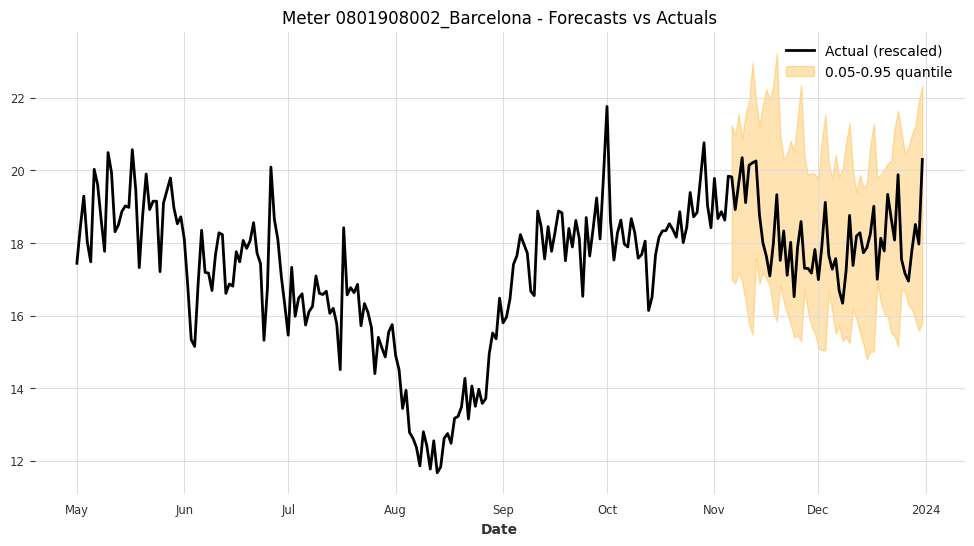

Meter 0801908002_Barcelona - Coverage: 1.0000, Width: 4.8916



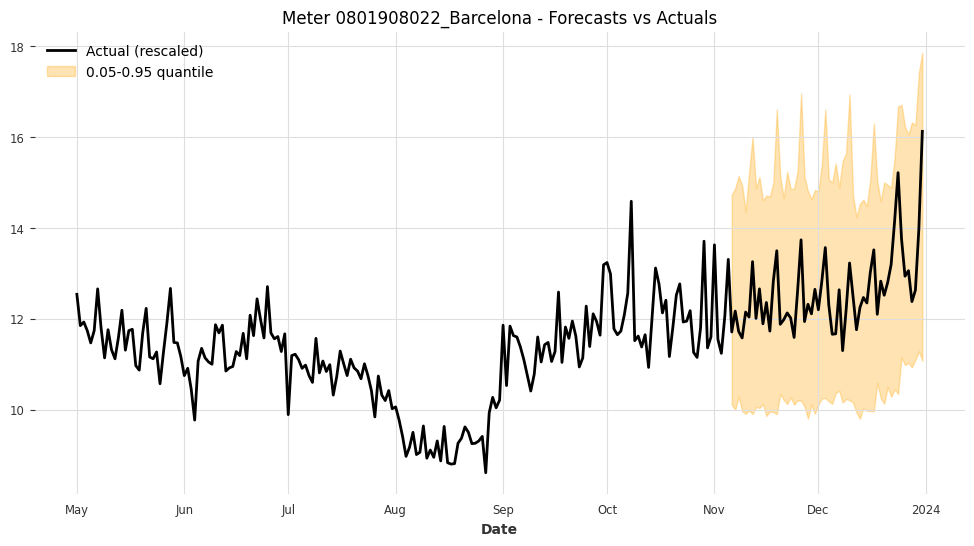

Meter 0801908022_Barcelona - Coverage: 1.0000, Width: 5.1168



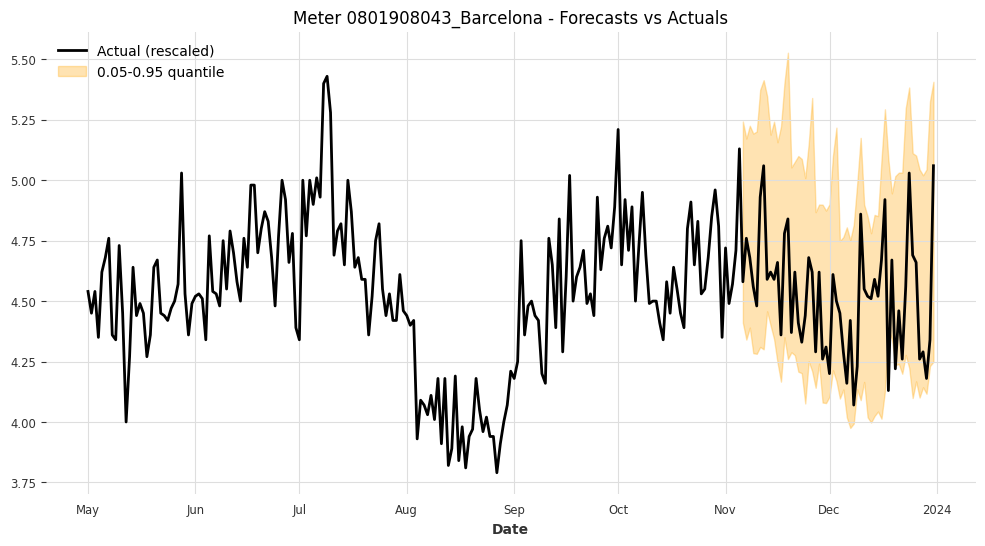

Meter 0801908043_Barcelona - Coverage: 0.9643, Width: 0.8941



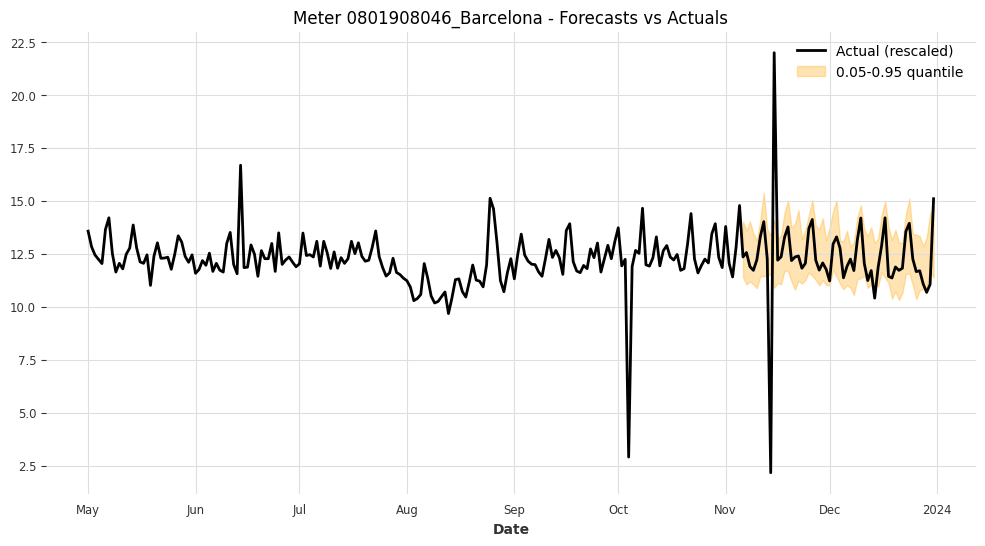

Meter 0801908046_Barcelona - Coverage: 0.8929, Width: 2.6687



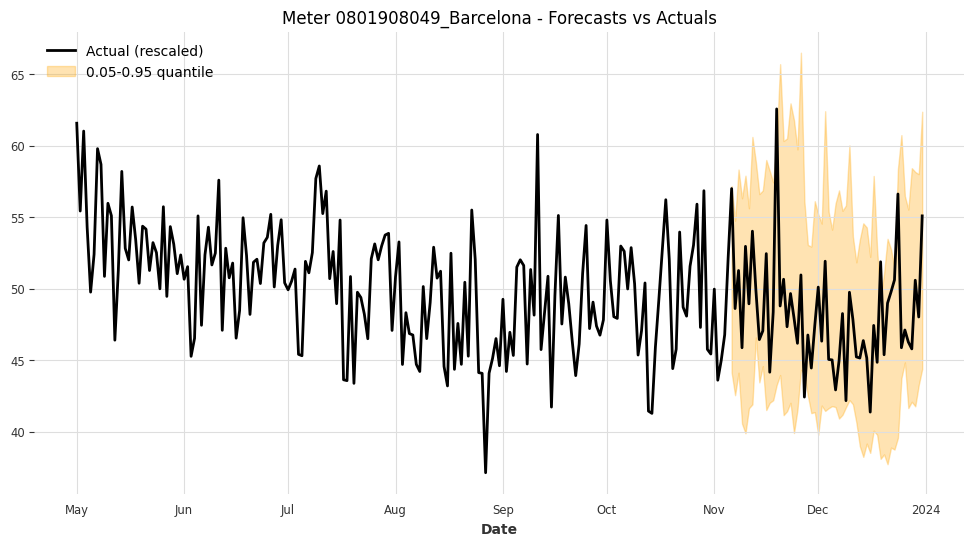

Meter 0801908049_Barcelona - Coverage: 0.9464, Width: 15.3509



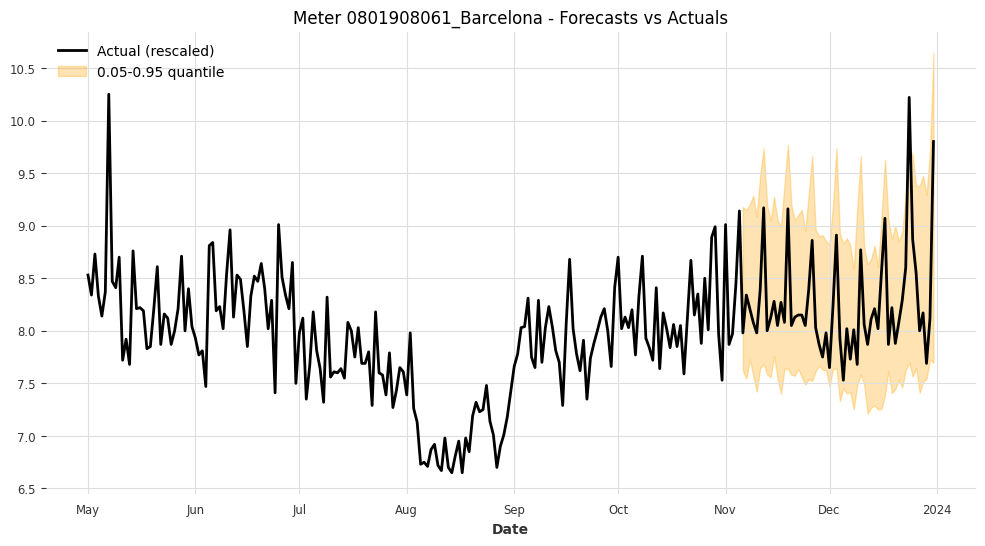

Meter 0801908061_Barcelona - Coverage: 0.9821, Width: 1.6517



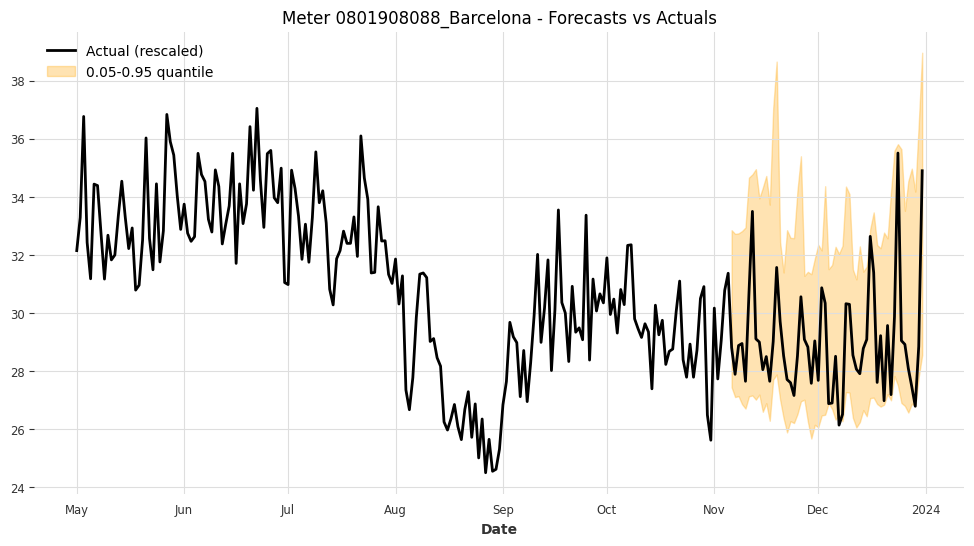

Meter 0801908088_Barcelona - Coverage: 0.9643, Width: 6.6357



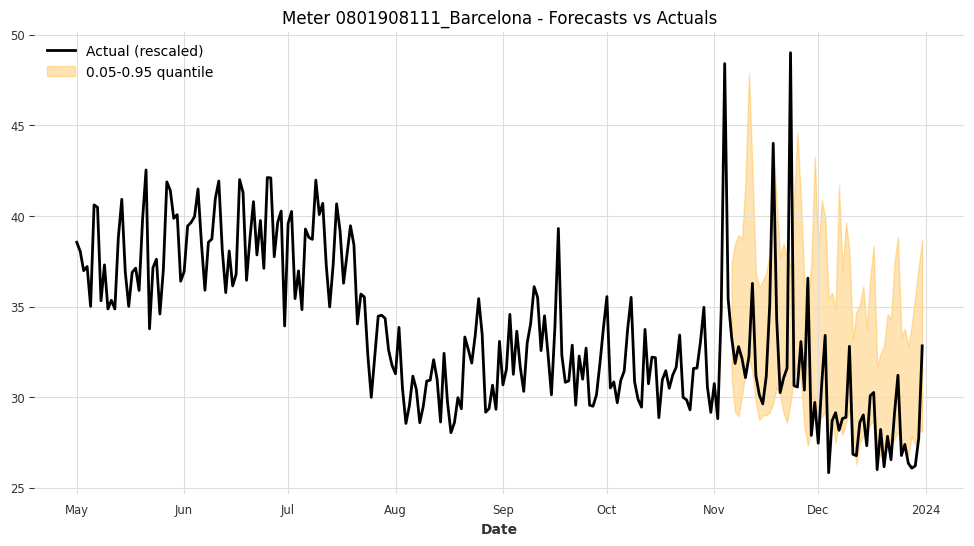

Meter 0801908111_Barcelona - Coverage: 0.6250, Width: 8.7739



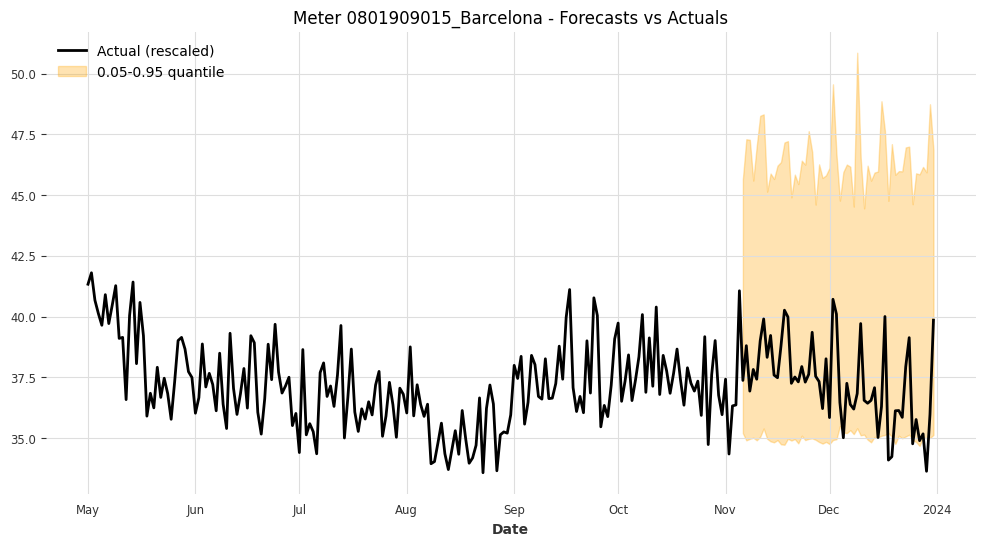

Meter 0801909015_Barcelona - Coverage: 0.8929, Width: 11.4021



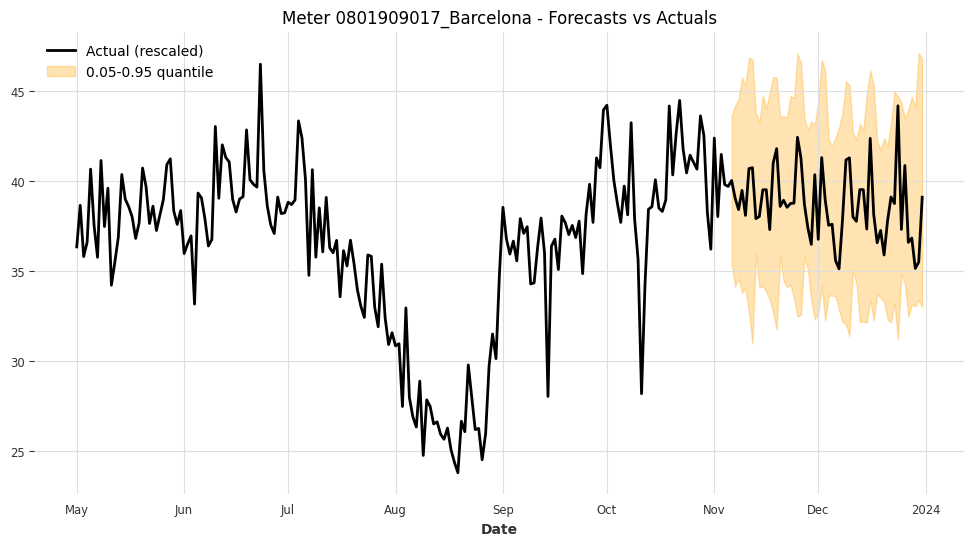

Meter 0801909017_Barcelona - Coverage: 1.0000, Width: 10.9251



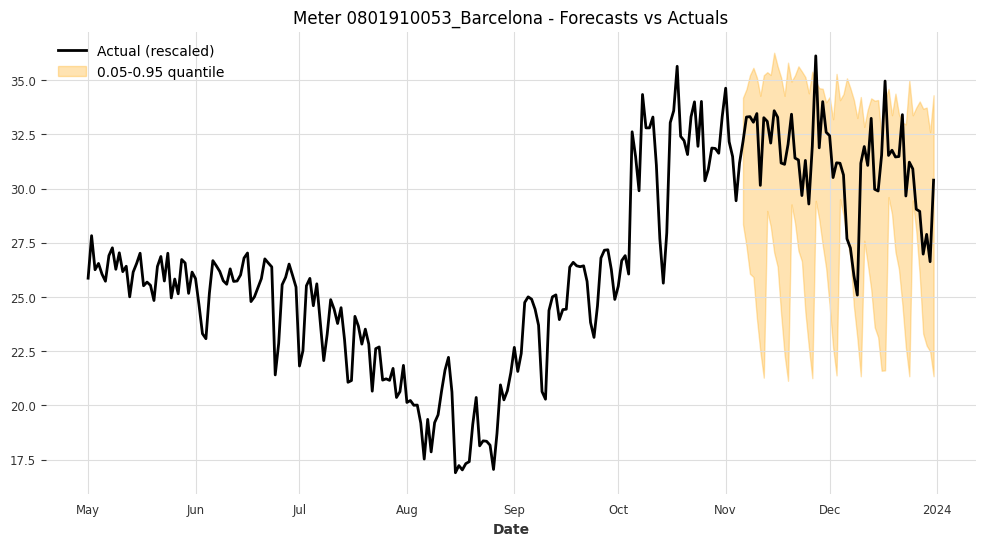

Meter 0801910053_Barcelona - Coverage: 0.9464, Width: 9.0501



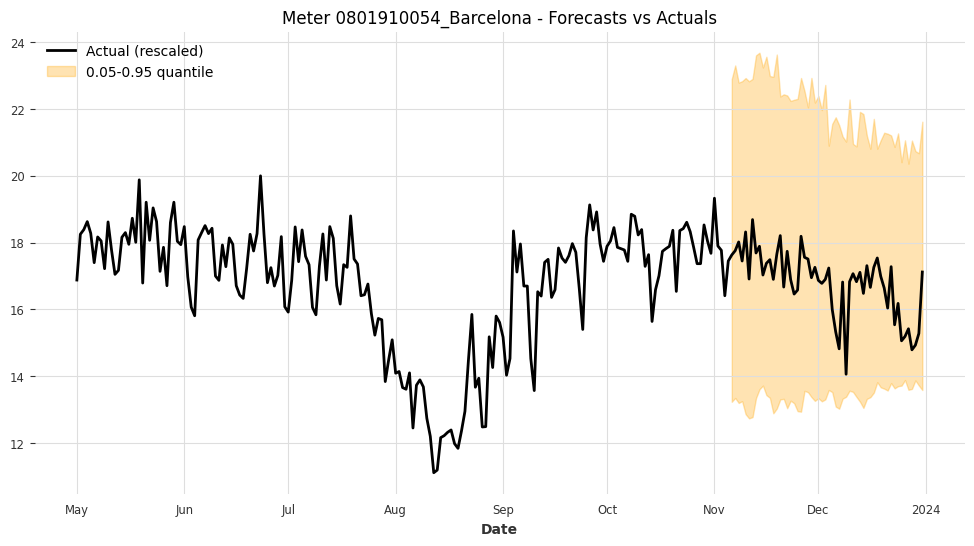

Meter 0801910054_Barcelona - Coverage: 1.0000, Width: 8.6082



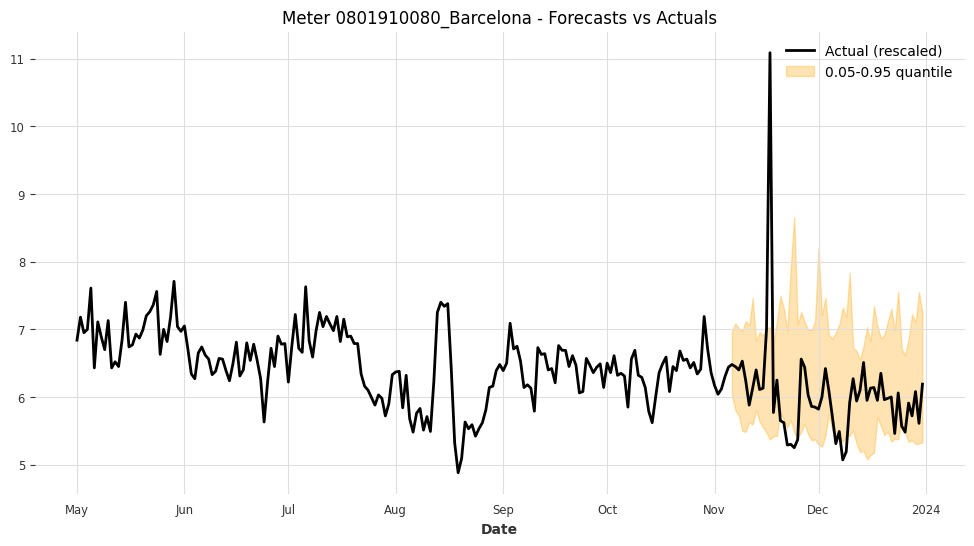

Meter 0801910080_Barcelona - Coverage: 0.8036, Width: 1.6645



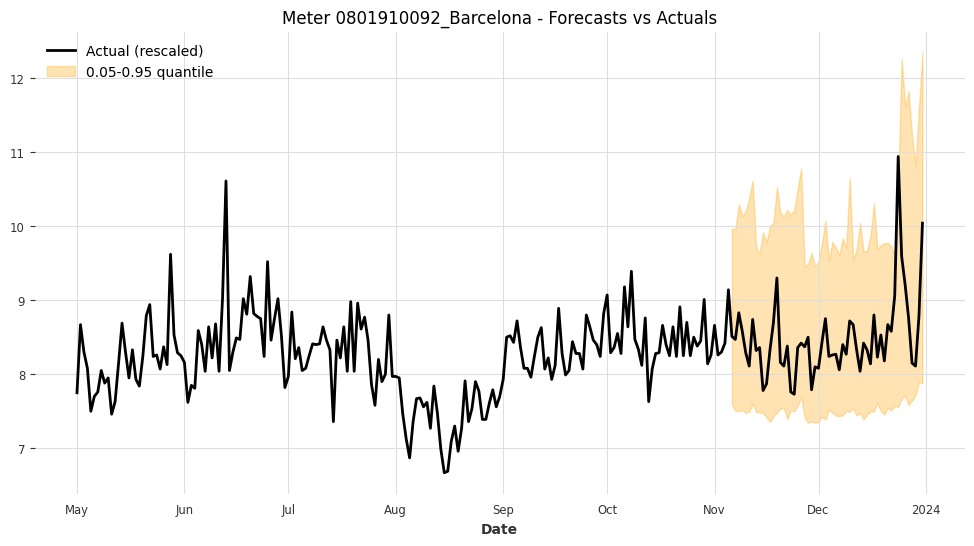

Meter 0801910092_Barcelona - Coverage: 0.9821, Width: 2.6473



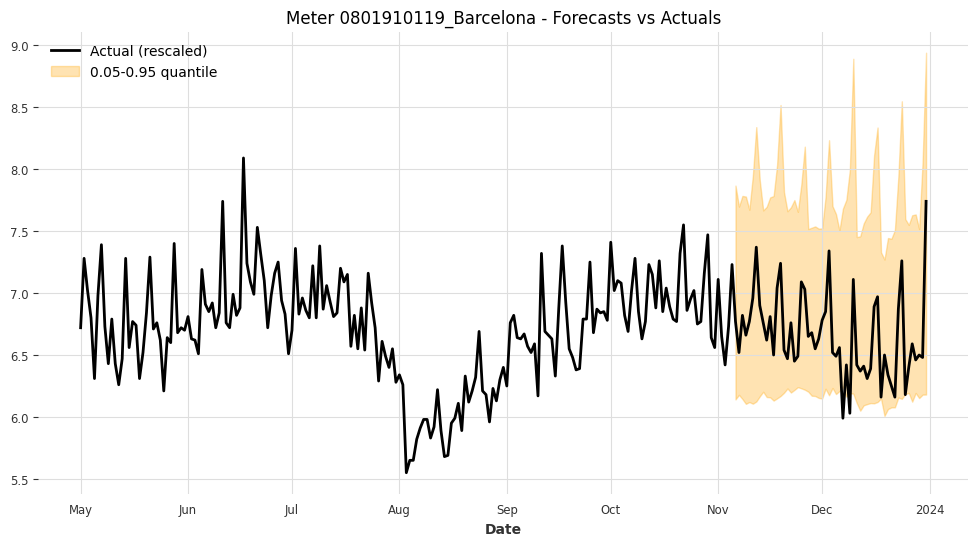

Meter 0801910119_Barcelona - Coverage: 0.9464, Width: 1.6359



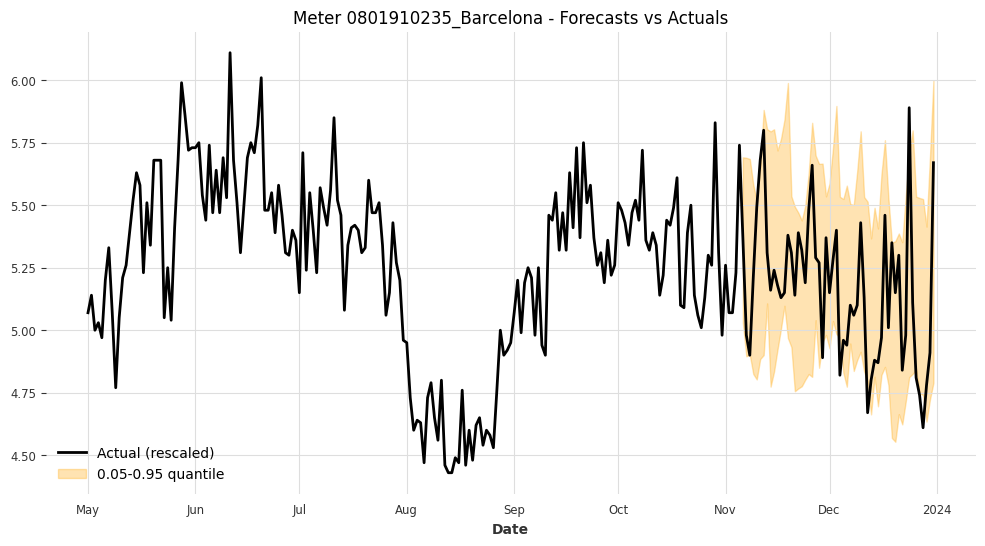

Meter 0801910235_Barcelona - Coverage: 0.8214, Width: 0.7769



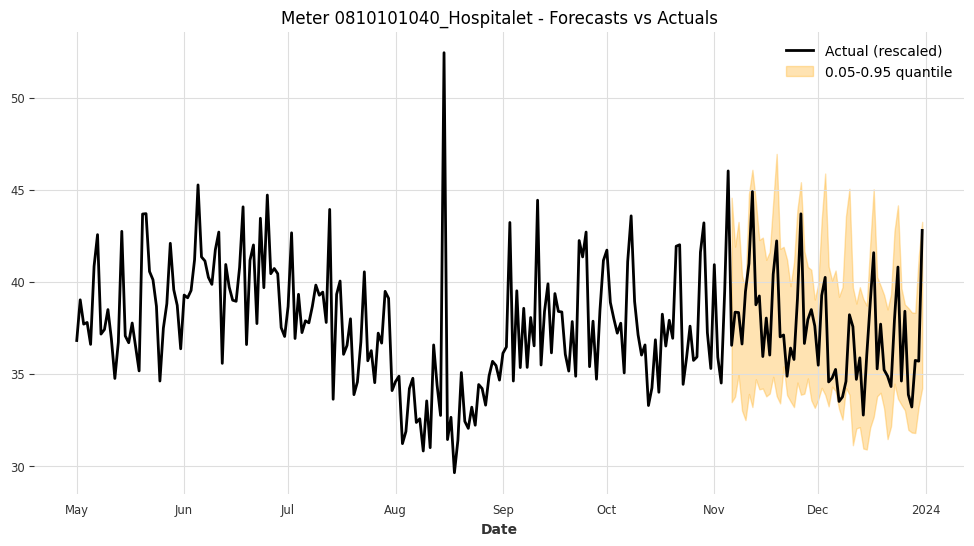

Meter 0810101040_Hospitalet - Coverage: 1.0000, Width: 8.1451



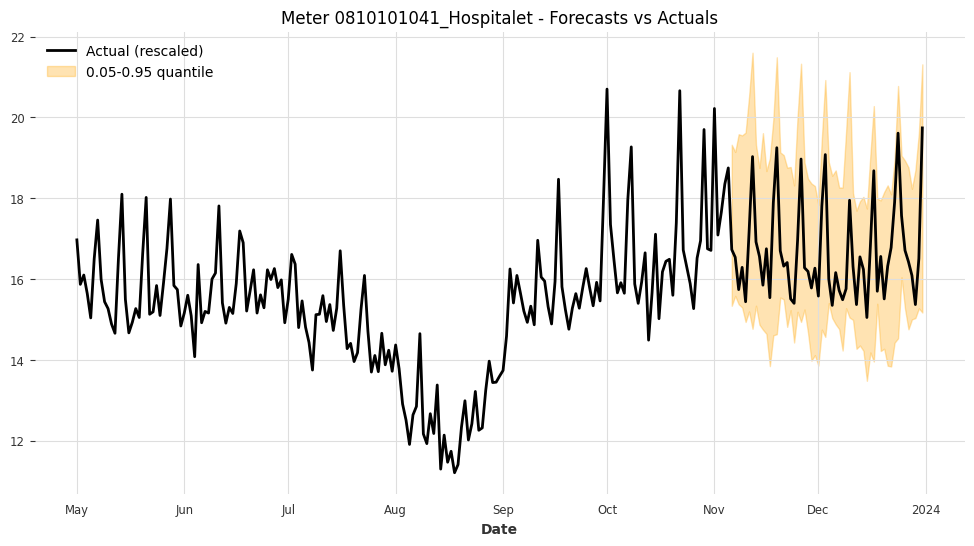

Meter 0810101041_Hospitalet - Coverage: 1.0000, Width: 4.3497



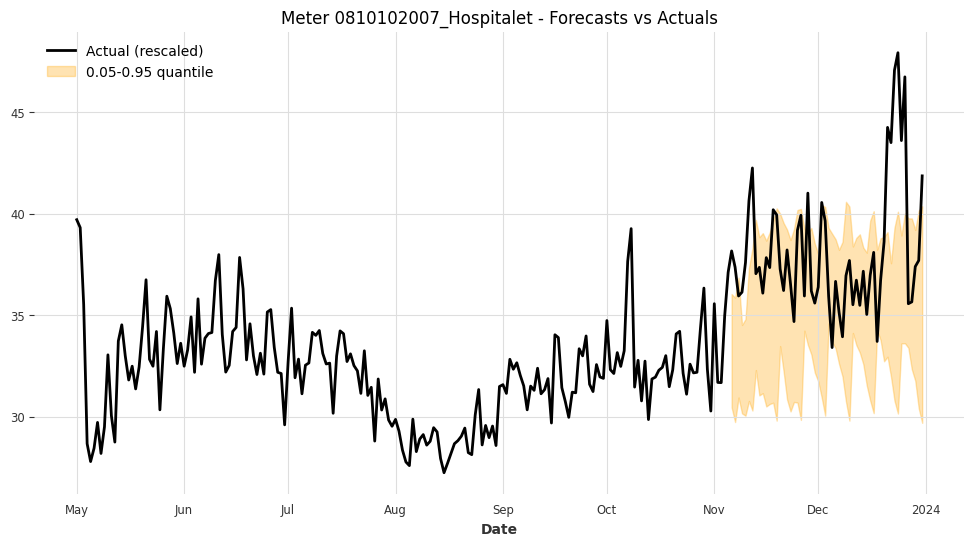

Meter 0810102007_Hospitalet - Coverage: 0.6786, Width: 7.1750



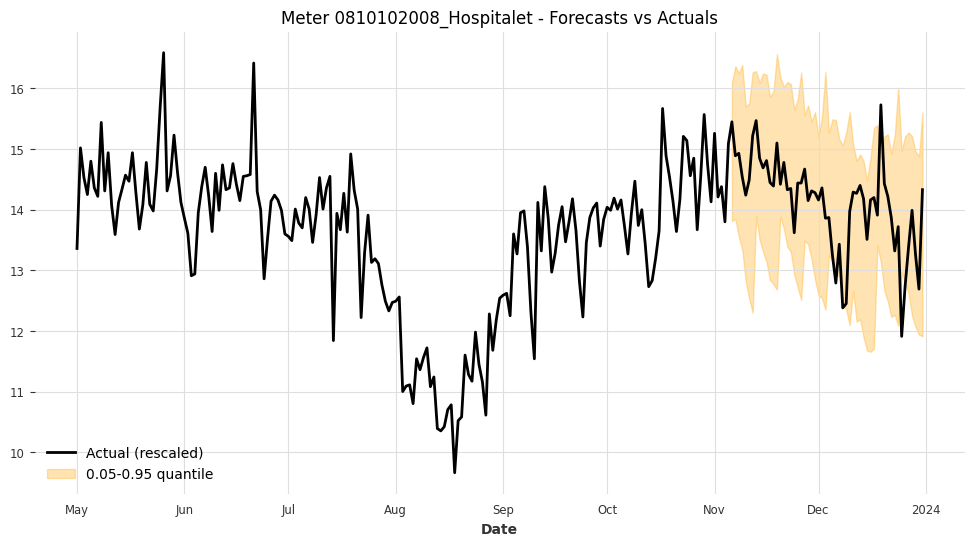

Meter 0810102008_Hospitalet - Coverage: 0.9107, Width: 2.8055



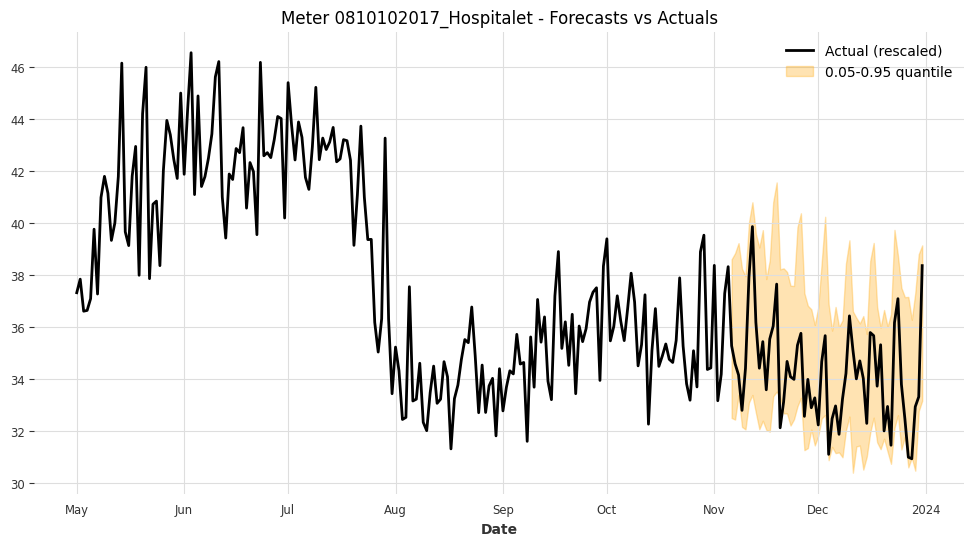

Meter 0810102017_Hospitalet - Coverage: 0.9643, Width: 5.9597



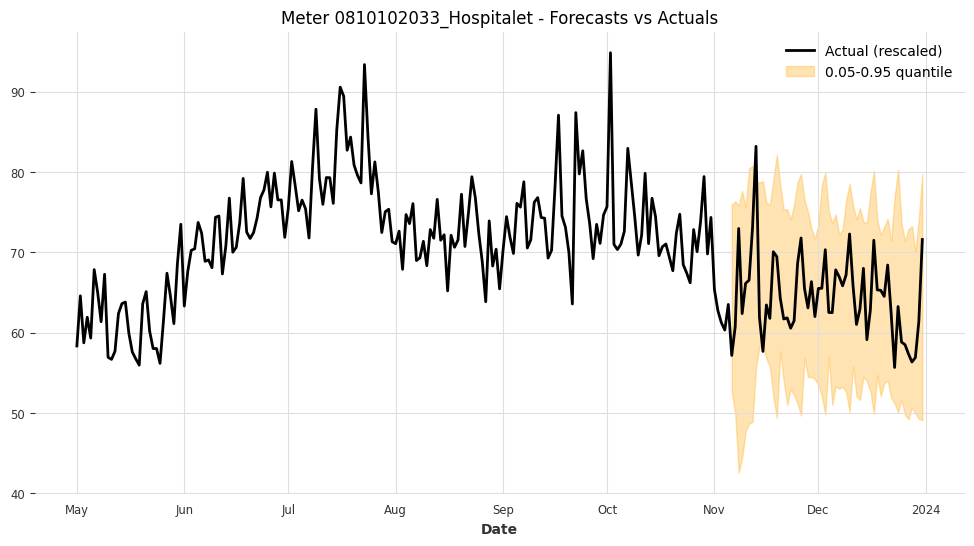

Meter 0810102033_Hospitalet - Coverage: 0.9643, Width: 23.6967



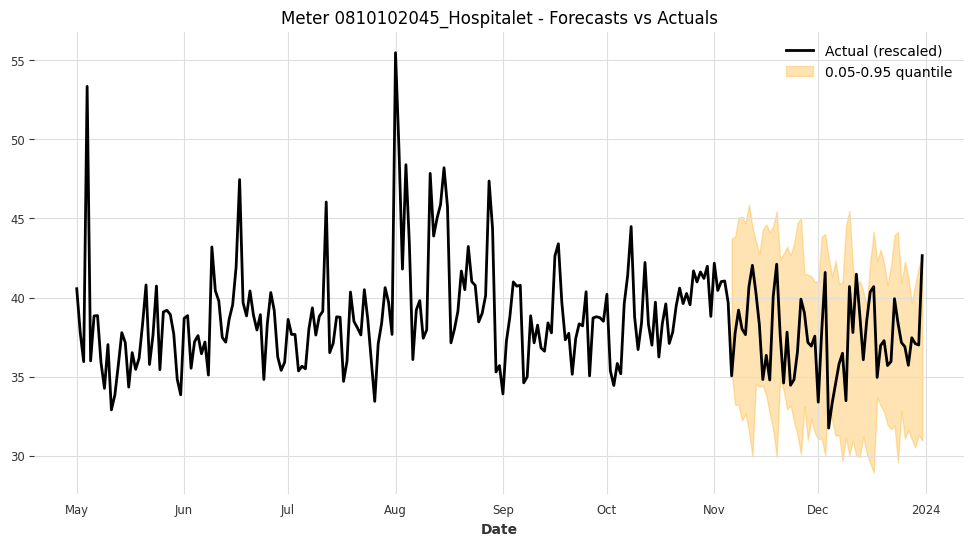

Meter 0810102045_Hospitalet - Coverage: 0.9286, Width: 10.9484



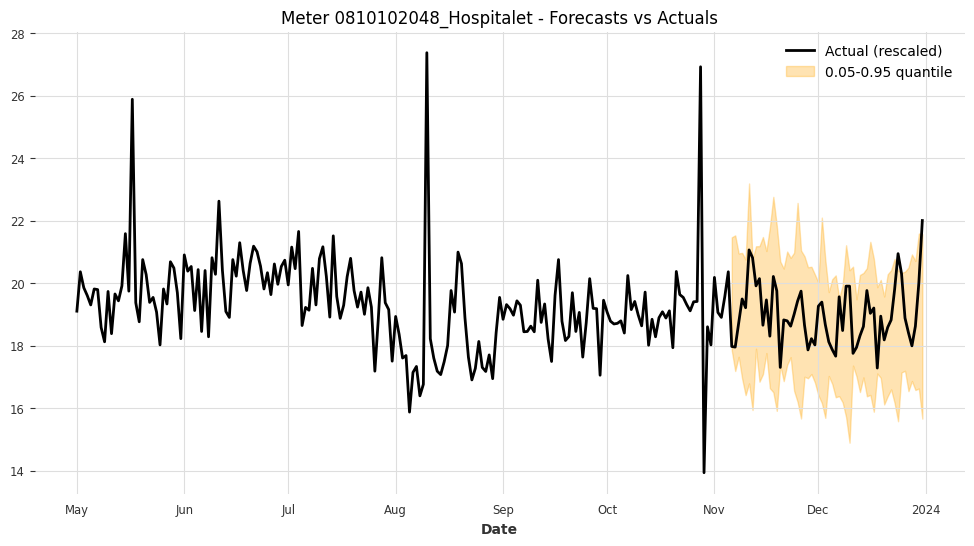

Meter 0810102048_Hospitalet - Coverage: 0.9107, Width: 4.1526



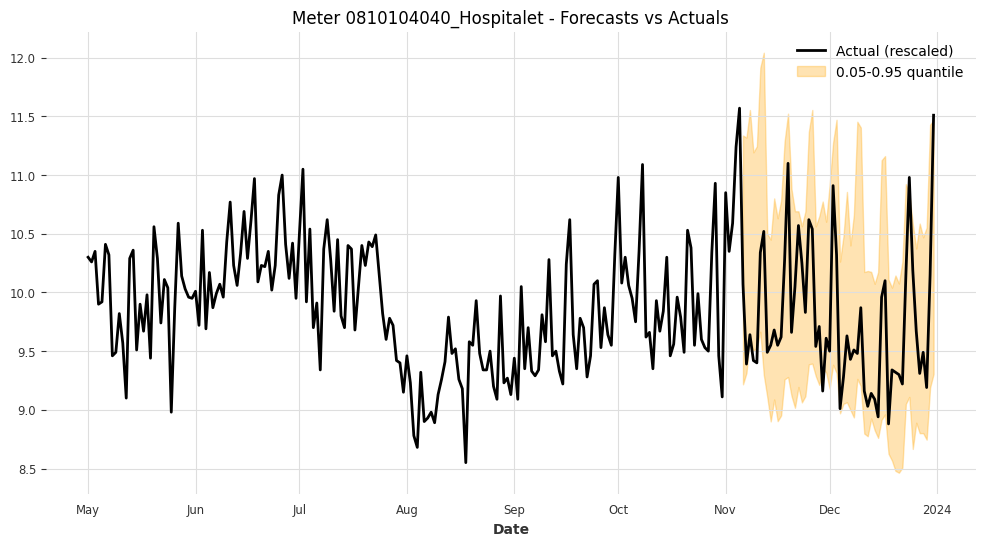

Meter 0810104040_Hospitalet - Coverage: 0.9107, Width: 1.7514



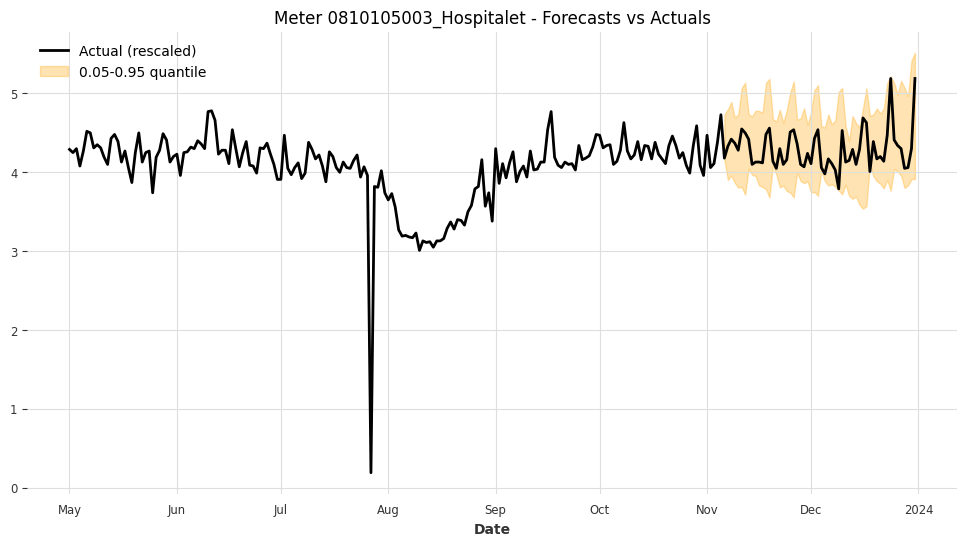

Meter 0810105003_Hospitalet - Coverage: 0.9821, Width: 1.0113



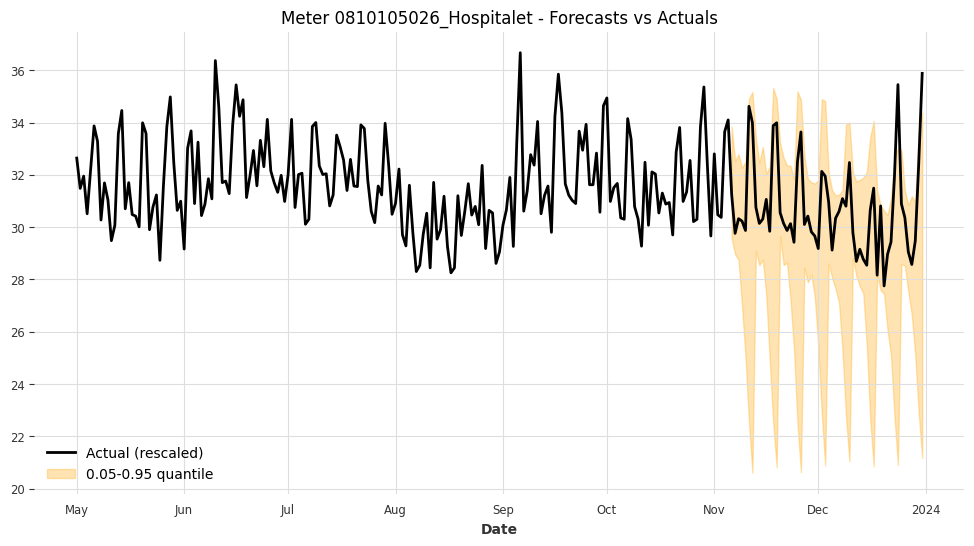

Meter 0810105026_Hospitalet - Coverage: 0.9464, Width: 6.7690



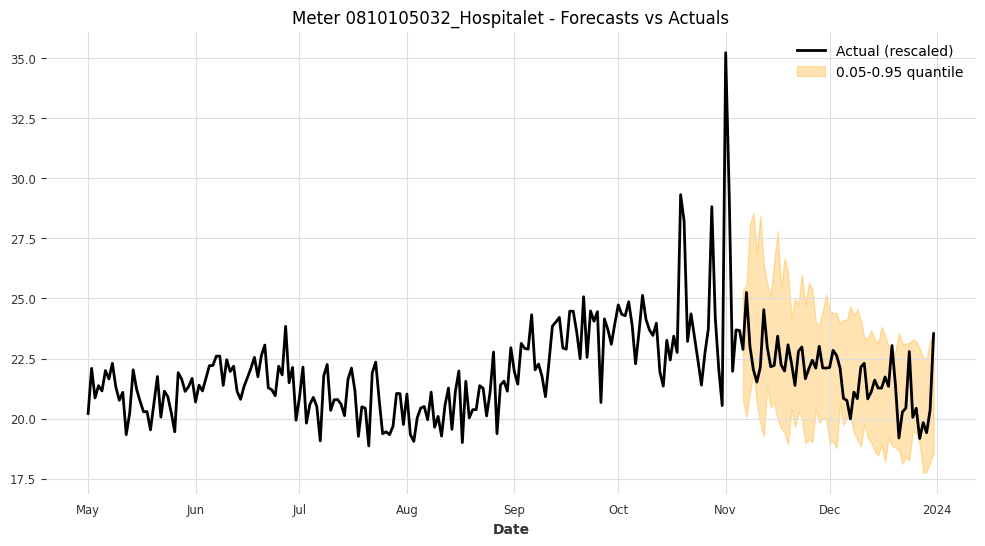

Meter 0810105032_Hospitalet - Coverage: 0.9643, Width: 5.1266



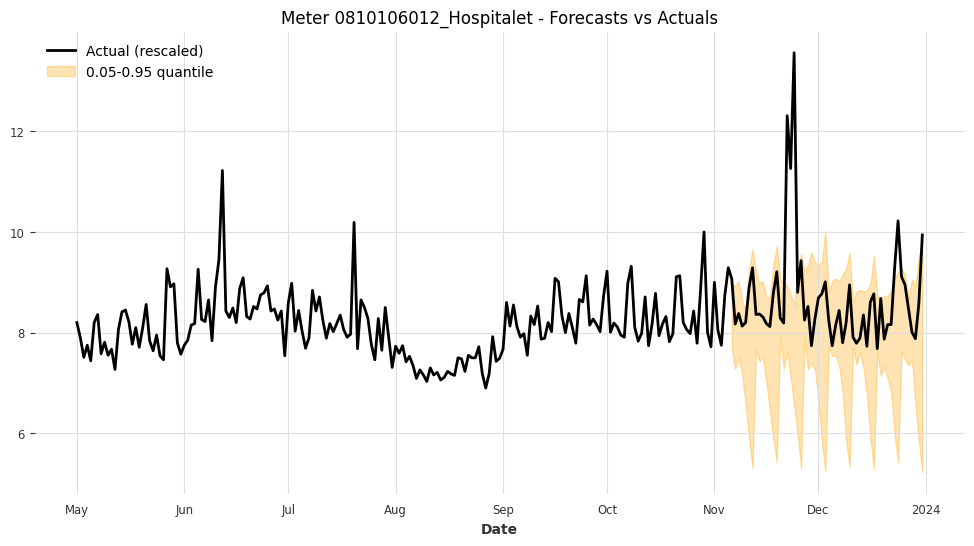

Meter 0810106012_Hospitalet - Coverage: 0.8571, Width: 2.2775



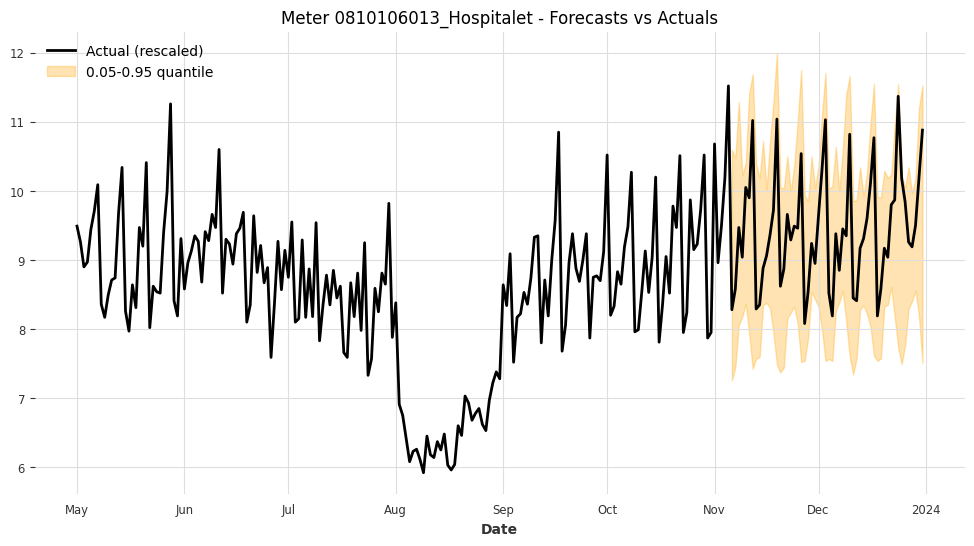

Meter 0810106013_Hospitalet - Coverage: 1.0000, Width: 2.6190



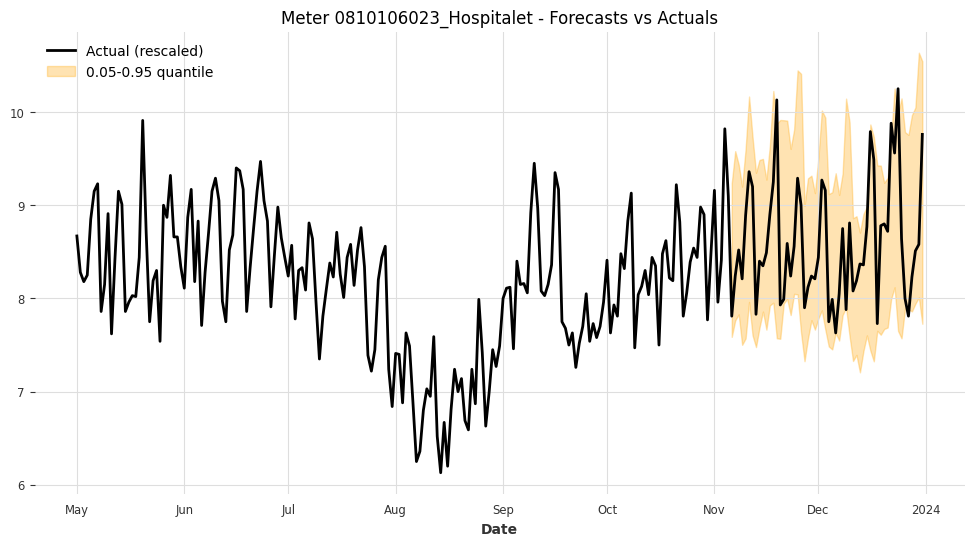

Meter 0810106023_Hospitalet - Coverage: 0.9107, Width: 1.9221



In [ ]:
import matplotlib.pyplot as plt
from darts import concatenate  # Darts utility to merge TimeSeries

for meter_id, hfcs in all_hfcs.items():
    # Get the actual time series
    ts = scaled_calib_test_series[meter_id]

    # Get scaler and results
    scaler = scalers_test[meter_id]
    df_result = all_bt_results[meter_id]
    coverage = df_result["Coverage"].iloc[0]
    width = df_result["Width rescaled"].iloc[0]

    # Start a new plot
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actuals (rescaled)
    ts_orig = scaler.inverse_transform(ts)
    ts_orig.plot(ax=ax, label='Actual (rescaled)', lw=2)

    full_lower = []
    full_upper = []

    # Collect lower and upper quantiles from each forecast window
    for forecast in hfcs:
        if ('Consumption per meter_q0.05' in forecast.components
            and 'Consumption per meter_q0.95' in forecast.components):

            lower = forecast['Consumption per meter_q0.05']
            upper = forecast['Consumption per meter_q0.95']
            lower_orig = scaler.inverse_transform(lower)
            upper_orig = scaler.inverse_transform(upper)
            full_lower.append(lower_orig)
            full_upper.append(upper_orig)


    if full_lower and full_upper:
        # Concatenate all the TimeSeries pieces into full series
        combined_lower = concatenate(full_lower)
        combined_upper = concatenate(full_upper)

        # Plot the quantile area as a filled region
        ax.fill_between(
            combined_lower.time_index,
            combined_lower.values().flatten(),
            combined_upper.values().flatten(),
            color='orange',
            alpha=0.3,
            label='0.05-0.95 quantile'
        )

    ax.set_title(f"Meter {meter_id} - Forecasts vs Actuals")
    ax.legend()
    plt.show()

    # Print the metrics below each plot
    print(f"Meter {meter_id} - Coverage: {coverage:.4f}, Width: {width:.4f}\n")


In [ ]:
# We start with the standard scaling

In [ ]:
# Load model
model = LightGBMModel.load("/content/drive/MyDrive/Colab Notebooks/TFG/data/02_models/lightGBM/simple/lightgbm_model_standard.pkl")

In [ ]:
# Load the test data
test_data = joblib.load('/content/drive/MyDrive/Colab Notebooks/TFG/data/01_datasets/train_test/scaled_test_standard.pkl')

# Extract components
scaled_val_series = test_data['validation']        # validation not used in our case
scaled_calib_test_series = test_data['calib_test']
scalers_test = test_data['scalers']           # the scalers to reescale the series later

# Reuse the same sorted meter IDs to align
meter_ids_test = sorted(scaled_calib_test_series.keys())

# Build aligned lists
test_series_scaled = [scaled_calib_test_series[meter_id] for meter_id in meter_ids_test]

print(f"Loaded {len(test_series_scaled)} time series for testing.")

Loaded 60 time series for testing.


In [ ]:
# Constants
start_date = pd.Timestamp("2023-11-6")
horizon = 7
quantiles = [0.05, 0.5, 0.95]
pred_kwargs={"predict_likelihood_parameters": True, "verbose": True}

# Initialize the conformal quantile regression model
cp_model = ConformalQRModel(
    model=model,
    quantiles=quantiles,
    symmetric=False
    # if cal_length is None, it considers all calibration scores
)
q_interval = cp_model.q_interval  # [(0.05, 0.95)]
q_range = cp_model.interval_range  # [0.9]

# Prepare to collect results
all_hfcs = {}
all_bt_results = {}

# We loop over each time series
for meter_id, ts in zip(meter_ids_test, test_series_scaled):
    # Historical forecasts
    hfcs = cp_model.historical_forecasts(
        series=ts,
        forecast_horizon=7,
        start=start_date,
        last_points_only=False,
        stride=7,
        **pred_kwargs,
    )

    scaler = scalers_test[meter_id]
    widths = []

    for forecast in hfcs:
        q05 = forecast["Consumption per meter_q0.05"]
        q95 = forecast["Consumption per meter_q0.95"]
        q05_orig = scaler.inverse_transform(q05)
        q95_orig = scaler.inverse_transform(q95)
        width = (q95_orig - q05_orig).values()
        widths.append(width)

    mean_width = np.mean([np.mean(w) for w in widths])

    # We evaluate the already-generated historical forecasts
    bt = cp_model.backtest(
        ts,
        historical_forecasts=hfcs,
        last_points_only=False,
        retrain=False,
        metric=[metrics.mic, metrics.miw],
        metric_kwargs={"q_interval": q_interval},
    )
    df_results = pd.DataFrame({"Interval": q_range, "Coverage": bt[0], "Width": bt[1], "Width rescaled": mean_width})
    print(f"Results for meter {meter_id}:\n", df_results, "\n")

    # Store results
    all_hfcs[meter_id] = hfcs
    all_bt_results[meter_id] = df_results

# We combine results across meters
combined_results = pd.concat(all_bt_results.values(), keys=all_bt_results.keys())
combined_results.reset_index(level=1, drop=True, inplace=True)


conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 484.67it/s]


Results for meter 0801501002_Badalona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  2.682654       31.674812 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 482.24it/s]


Results for meter 0801503008_Badalona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  1.720357       27.981292 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 351.73it/s]


Results for meter 0801901042_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  3.933737        8.336604 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 488.51it/s]


Results for meter 0801902035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  1.758555        3.458561 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 298.51it/s]


Results for meter 0801902037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  2.049475        4.879404 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 457.34it/s]


Results for meter 0801902052_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.589286  5.168519        8.929242 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 187.16it/s]


Results for meter 0801902102_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  2.217593         4.74094 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 321.89it/s]


Results for meter 0801903006_Barcelona:
    Interval  Coverage   Width  Width rescaled
0       0.9  0.767857  2.3531        3.733775 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 315.28it/s]


Results for meter 0801903035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  2.049329        0.933031 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 465.39it/s]


Results for meter 0801903040_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  2.487932        1.089119 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 391.31it/s]


Results for meter 0801903048_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  2.706295        4.934917 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 474.74it/s]


Results for meter 0801903060_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  3.626174        7.201182 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 474.67it/s]


Results for meter 0801903067_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  1.713524        1.094205 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 468.43it/s]


Results for meter 0801903081_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  2.574475        3.515665 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 415.20it/s]


Results for meter 0801904008_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.642857  2.509855        12.34226 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 456.05it/s]


Results for meter 0801904030_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  1.901607        3.898059 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 485.63it/s]


Results for meter 0801905054_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.785714  0.933807       16.879194 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 357.68it/s]


Results for meter 0801905091_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  2.420456        9.730434 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 453.94it/s]


Results for meter 0801906002_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  2.407717        3.578884 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 342.37it/s]


Results for meter 0801906010_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  2.478717        9.495286 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 471.77it/s]


Results for meter 0801906041_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  1.587217        6.830464 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 245.99it/s]


Results for meter 0801907003_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  1.928739         4.09934 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 304.53it/s]


Results for meter 0801907011_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  2.158086         3.54596 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 495.06it/s]


Results for meter 0801907013_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  1.800531        2.655104 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 416.07it/s]


Results for meter 0801907025_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  3.226798       13.537266 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 448.86it/s]


Results for meter 0801907037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  3.844241        9.947432 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 381.44it/s]


Results for meter 0801907084_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  4.057346       13.882946 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 445.00it/s]


Results for meter 0801907088_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  1.162316        8.706666 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 441.11it/s]


Results for meter 0801907115_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  1.380274       20.461239 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 436.79it/s]


Results for meter 0801908002_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9       1.0  1.90919        4.479322 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 297.97it/s]


Results for meter 0801908022_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  3.293789        5.651579 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 490.83it/s]


Results for meter 0801908043_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  2.053191         0.92541 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 302.84it/s]


Results for meter 0801908046_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  2.311977        2.739326 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 453.56it/s]


Results for meter 0801908049_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  1.586276       15.158153 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 451.02it/s]


Results for meter 0801908061_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  2.192104        1.672007 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 472.71it/s]


Results for meter 0801908088_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.732143  1.928119        7.252551 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 477.94it/s]


Results for meter 0801908111_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.535714  2.465168        9.336859 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 459.79it/s]


Results for meter 0801909015_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.785714  2.751703       12.663196 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 474.76it/s]


Results for meter 0801909017_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  1.697148        9.749146 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 330.85it/s]


Results for meter 0801910053_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  4.402803       12.947228 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 451.89it/s]


Results for meter 0801910054_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  5.099945       10.863054 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 328.60it/s]


Results for meter 0801910080_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.785714  2.968573        1.935043 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 455.65it/s]


Results for meter 0801910092_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  5.248116        3.185926 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 430.16it/s]


Results for meter 0801910119_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.785714  1.415504        1.427904 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 467.41it/s]


Results for meter 0801910235_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.821429  1.427459        0.722615 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 463.42it/s]


Results for meter 0810101040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  2.037322        8.013626 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 458.95it/s]


Results for meter 0810101041_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  2.092671        4.543287 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 445.06it/s]


Results for meter 0810102007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.714286  3.824785        8.607622 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 447.04it/s]


Results for meter 0810102008_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  2.124857         2.94624 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 456.45it/s]


Results for meter 0810102017_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  2.004034        5.689568 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 338.70it/s]


Results for meter 0810102033_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  4.806944        28.43332 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 445.75it/s]


Results for meter 0810102045_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  2.619809       11.828451 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 438.21it/s]


Results for meter 0810102048_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  2.716395        4.471645 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 366.45it/s]


Results for meter 0810104040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  2.763241        1.665235 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 474.76it/s]


Results for meter 0810105003_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  1.293951         0.81565 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 460.70it/s]


Results for meter 0810105026_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.785714  2.24275        5.418007 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 429.79it/s]


Results for meter 0810105032_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.964286  1.63471         4.42273 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.14it/s]


Results for meter 0810106012_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.857143  1.609804         2.04192 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 457.33it/s]


Results for meter 0810106013_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  2.447803        2.788183 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 341.81it/s]

Results for meter 0810106023_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  2.229664        2.118684 



In [ ]:
mean_coverage = combined_results["Coverage"].mean()
mean_width = combined_results["Width"].mean()
mean_width_rescaled = combined_results["Width rescaled"].mean()

print(f"Mean Coverage: {mean_coverage:.4f}")
print(f"Mean Width: {mean_width:.4f}")
print(f"Mean Width rescaled: {mean_width_rescaled:.4f}")

Mean Coverage: 0.8935
Mean Width: 2.5007
Mean Width rescaled: 7.4434


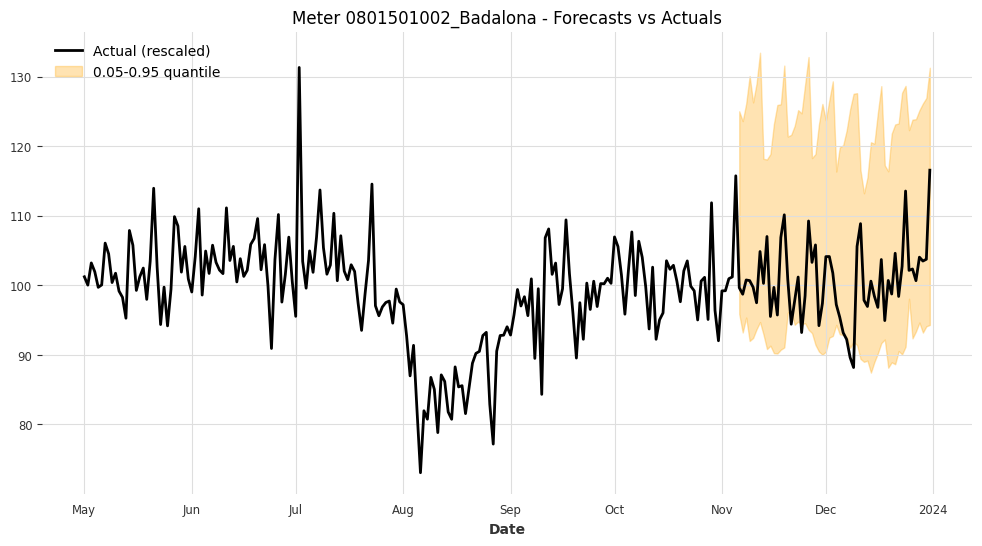

Meter 0801501002_Badalona - Coverage: 0.9107, Width: 31.6748



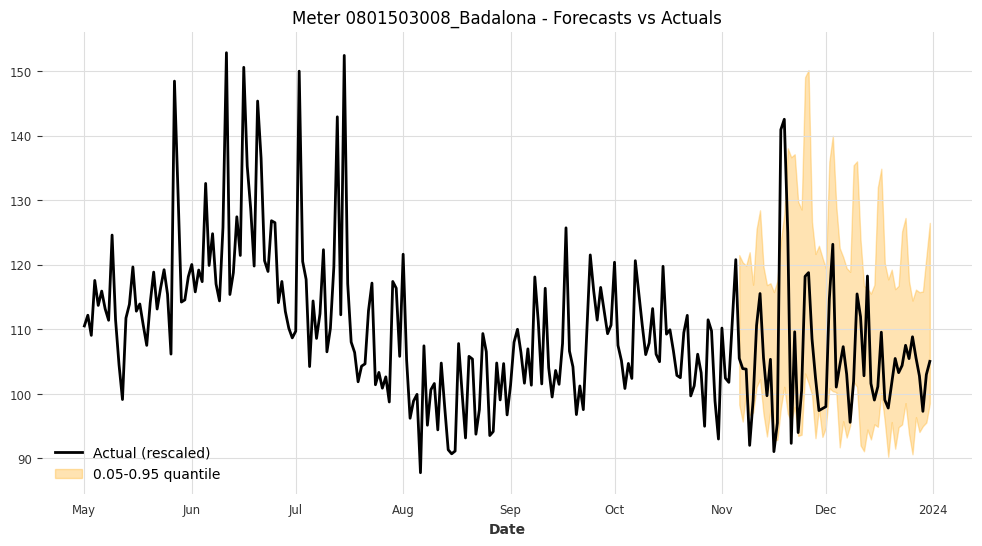

Meter 0801503008_Badalona - Coverage: 0.8750, Width: 27.9813



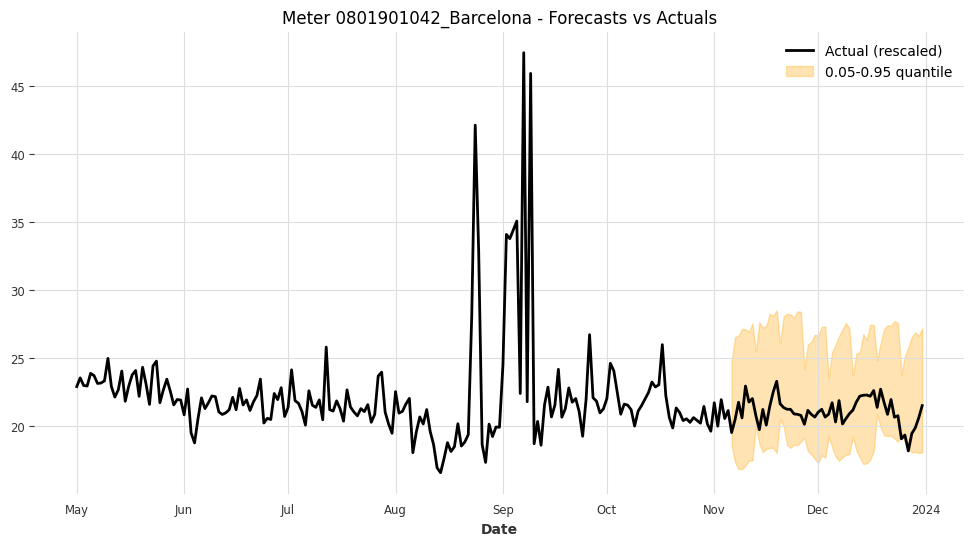

Meter 0801901042_Barcelona - Coverage: 0.9643, Width: 8.3366



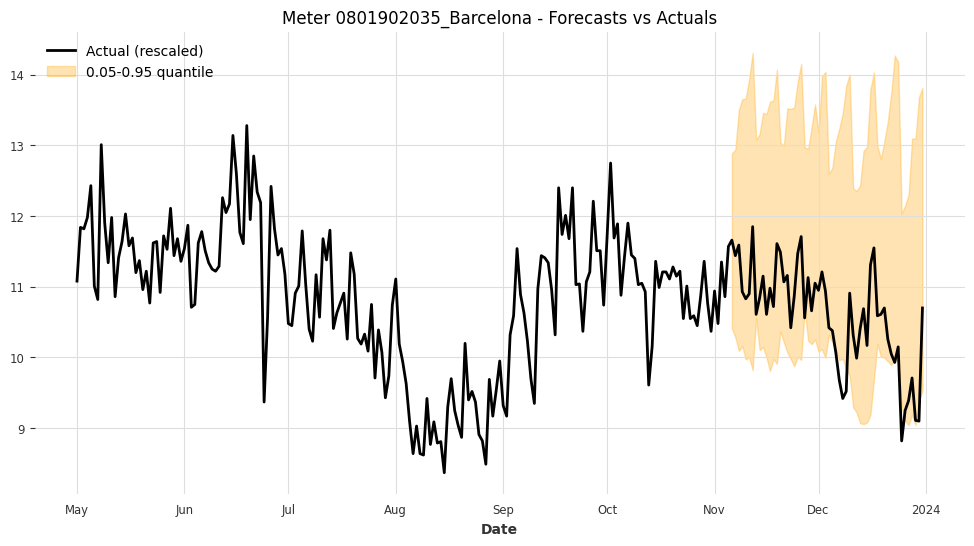

Meter 0801902035_Barcelona - Coverage: 0.8571, Width: 3.4586



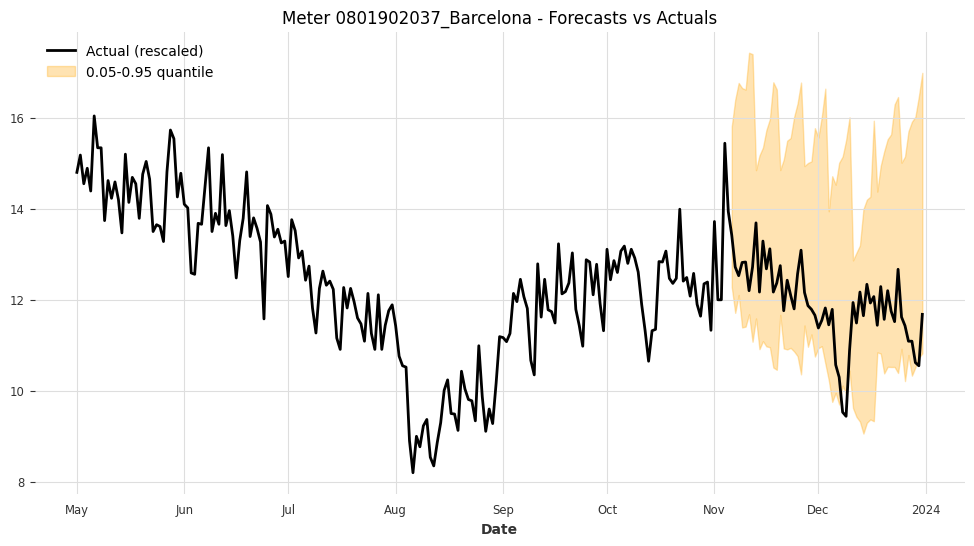

Meter 0801902037_Barcelona - Coverage: 0.9464, Width: 4.8794



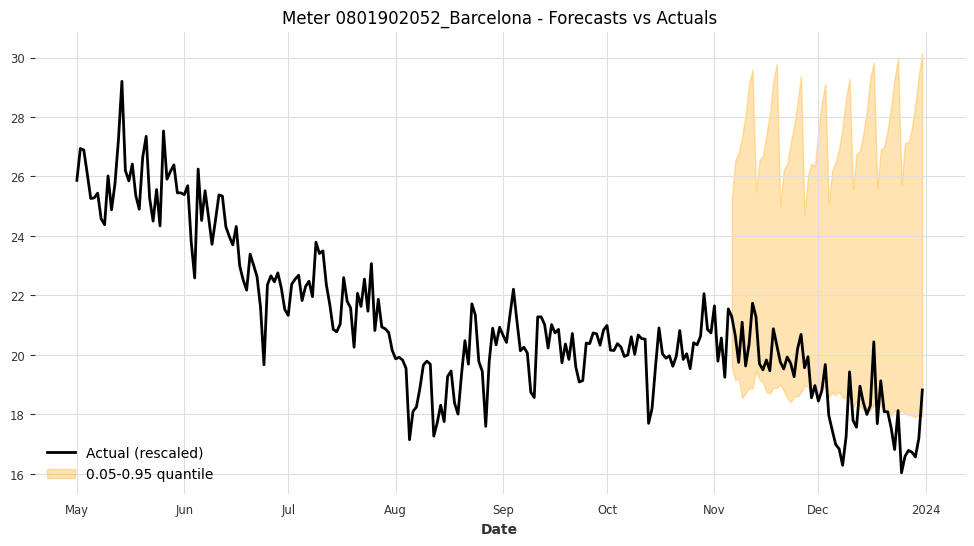

Meter 0801902052_Barcelona - Coverage: 0.5893, Width: 8.9292



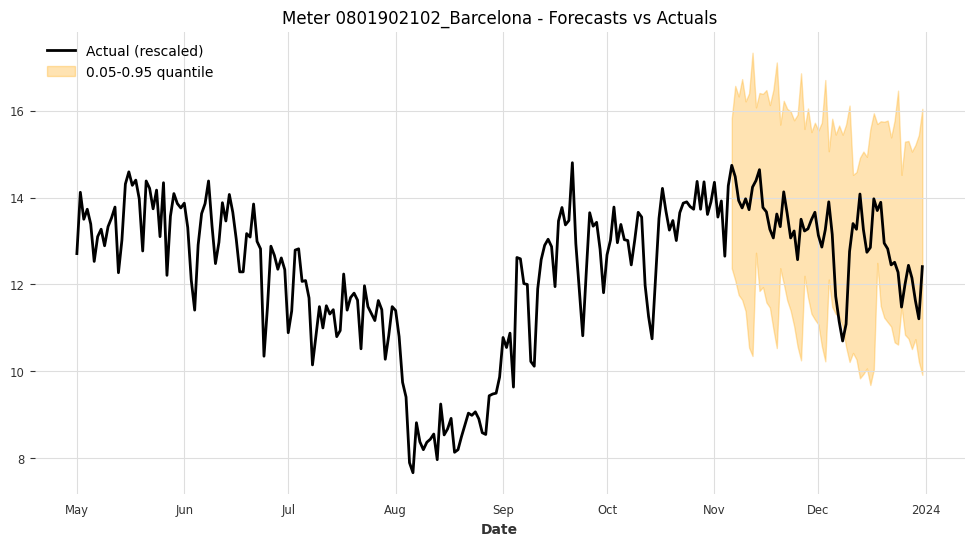

Meter 0801902102_Barcelona - Coverage: 0.9464, Width: 4.7409



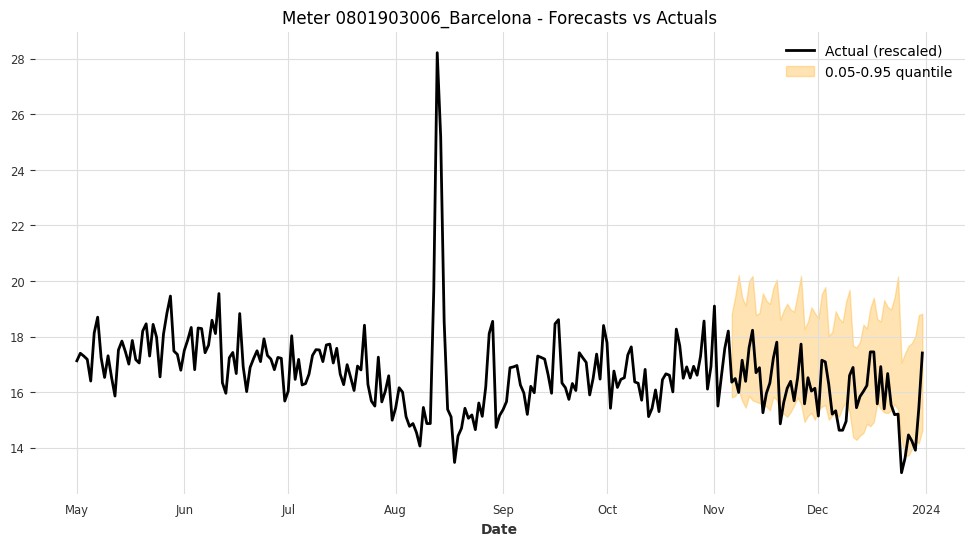

Meter 0801903006_Barcelona - Coverage: 0.7679, Width: 3.7338



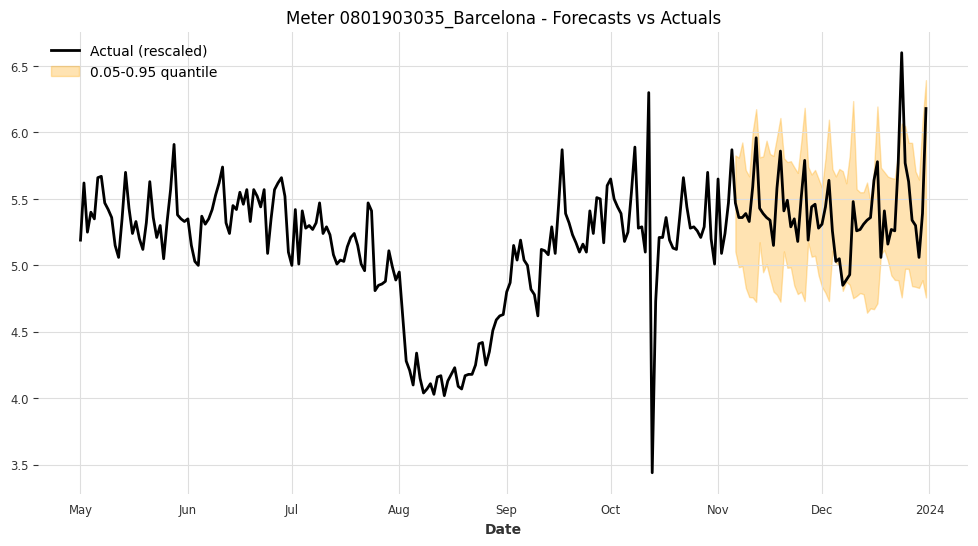

Meter 0801903035_Barcelona - Coverage: 0.9643, Width: 0.9330



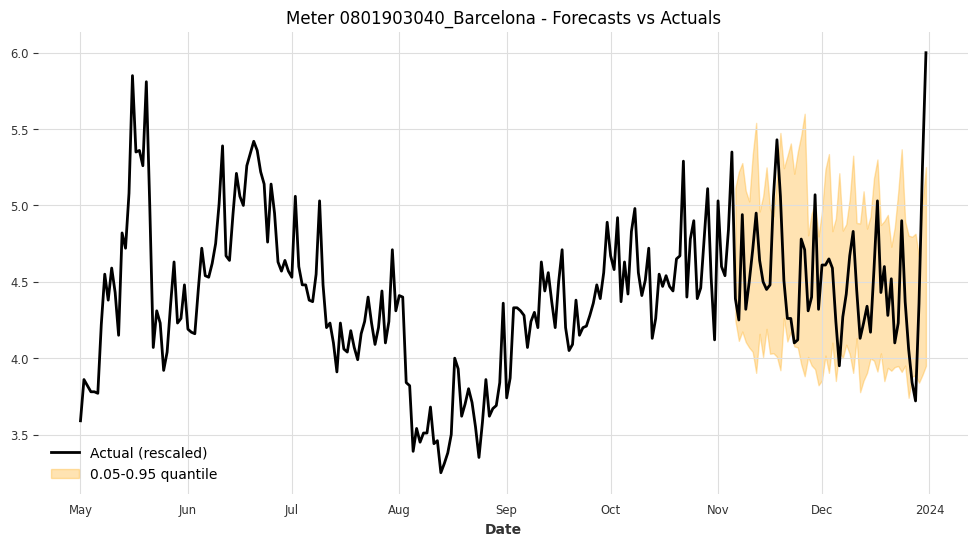

Meter 0801903040_Barcelona - Coverage: 0.8571, Width: 1.0891



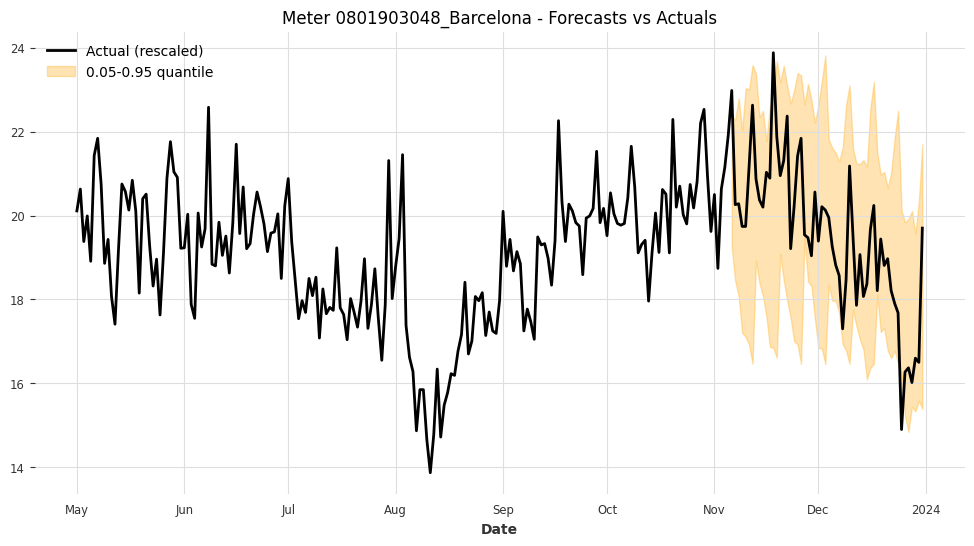

Meter 0801903048_Barcelona - Coverage: 0.9464, Width: 4.9349



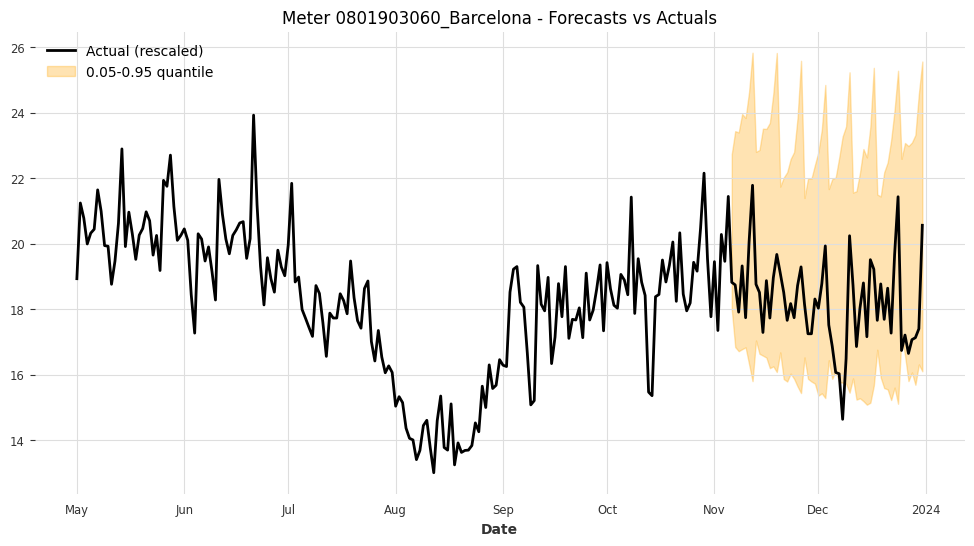

Meter 0801903060_Barcelona - Coverage: 0.9464, Width: 7.2012



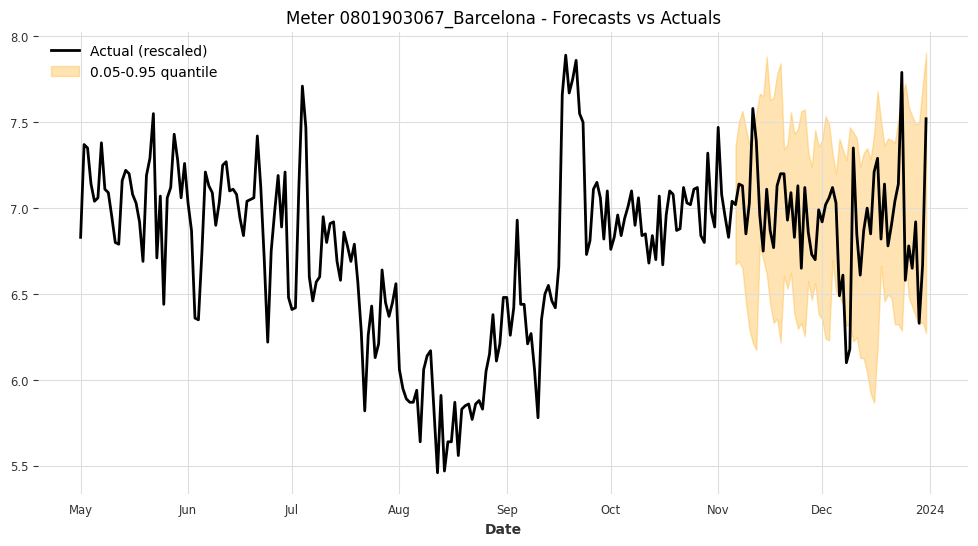

Meter 0801903067_Barcelona - Coverage: 0.9107, Width: 1.0942



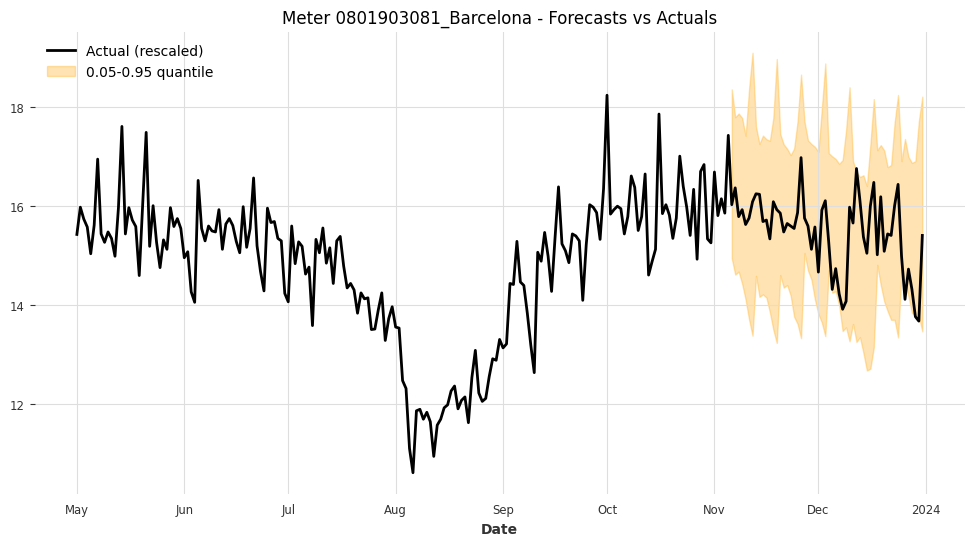

Meter 0801903081_Barcelona - Coverage: 0.9286, Width: 3.5157



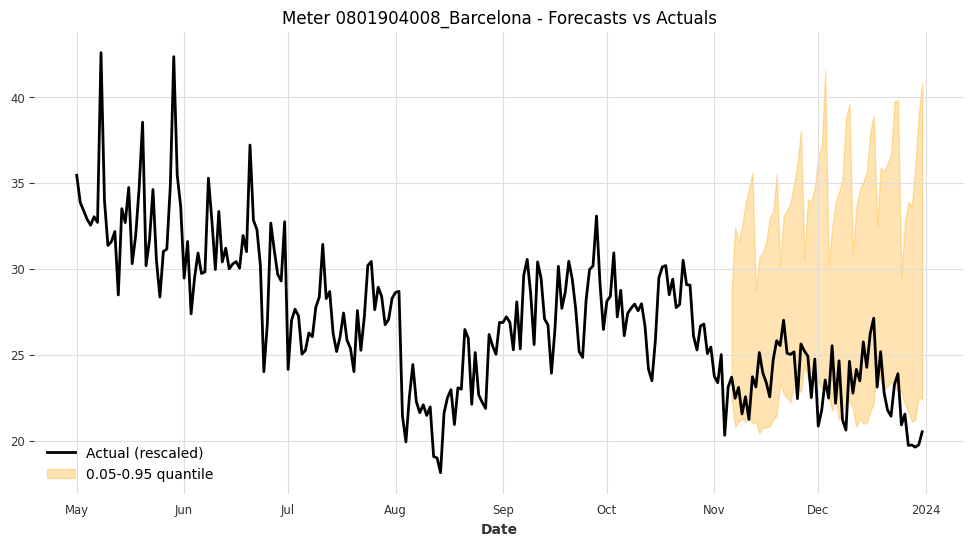

Meter 0801904008_Barcelona - Coverage: 0.6429, Width: 12.3423



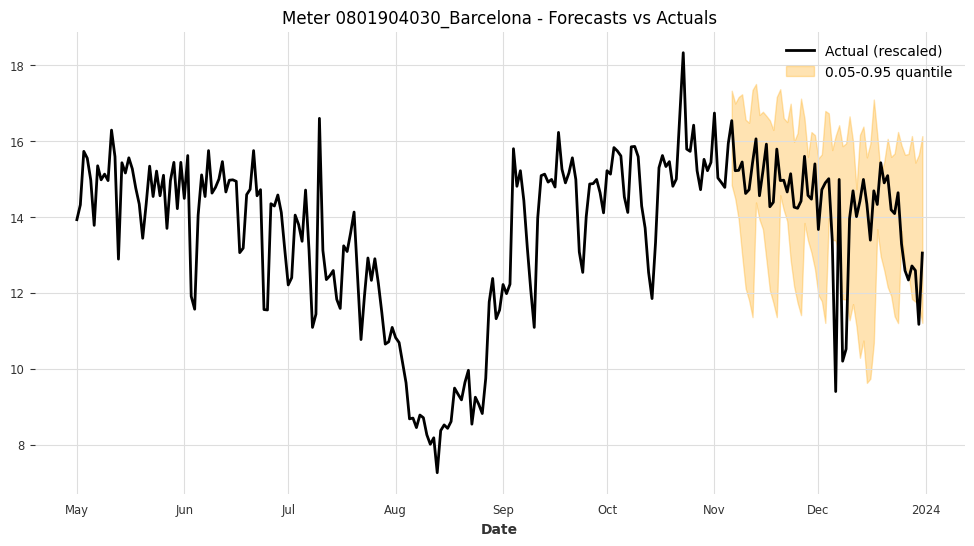

Meter 0801904030_Barcelona - Coverage: 0.8393, Width: 3.8981



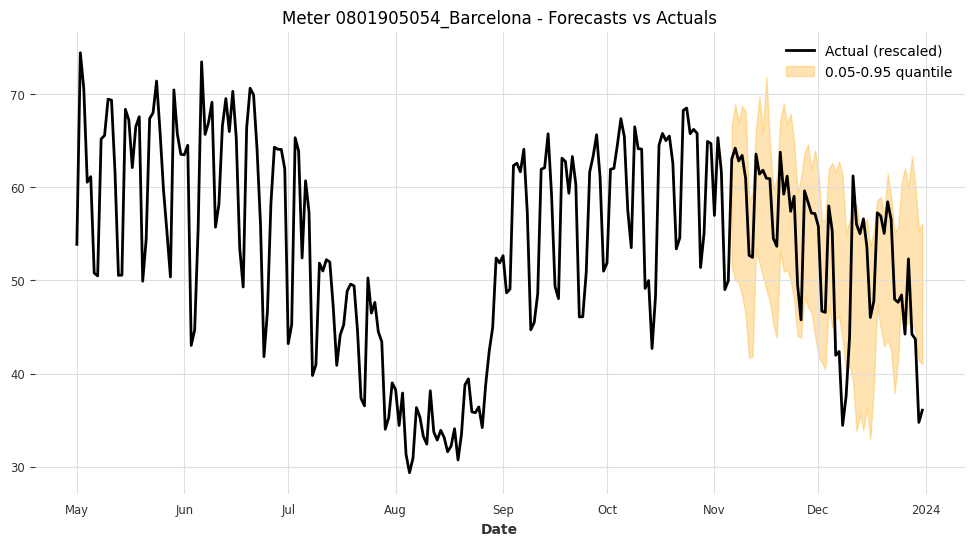

Meter 0801905054_Barcelona - Coverage: 0.7857, Width: 16.8792



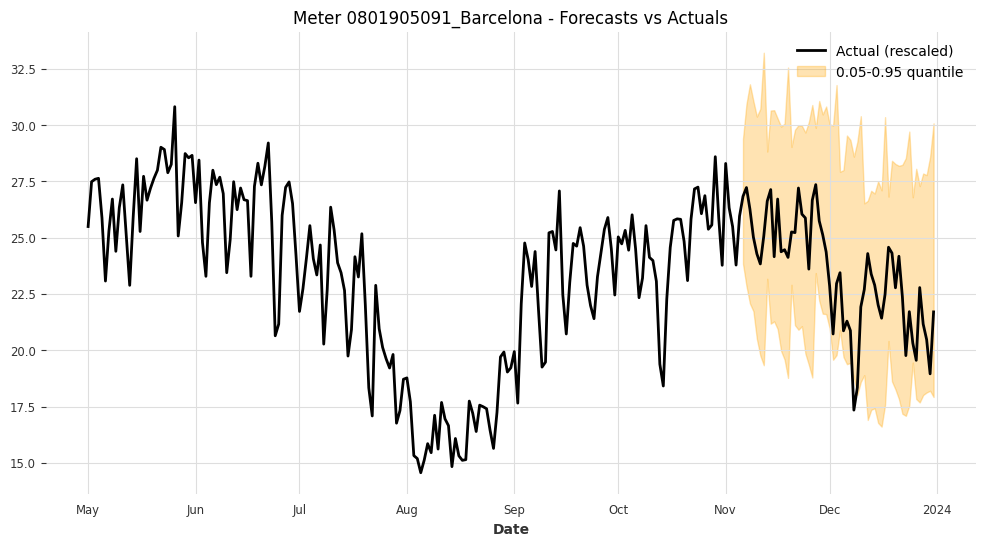

Meter 0801905091_Barcelona - Coverage: 0.9821, Width: 9.7304



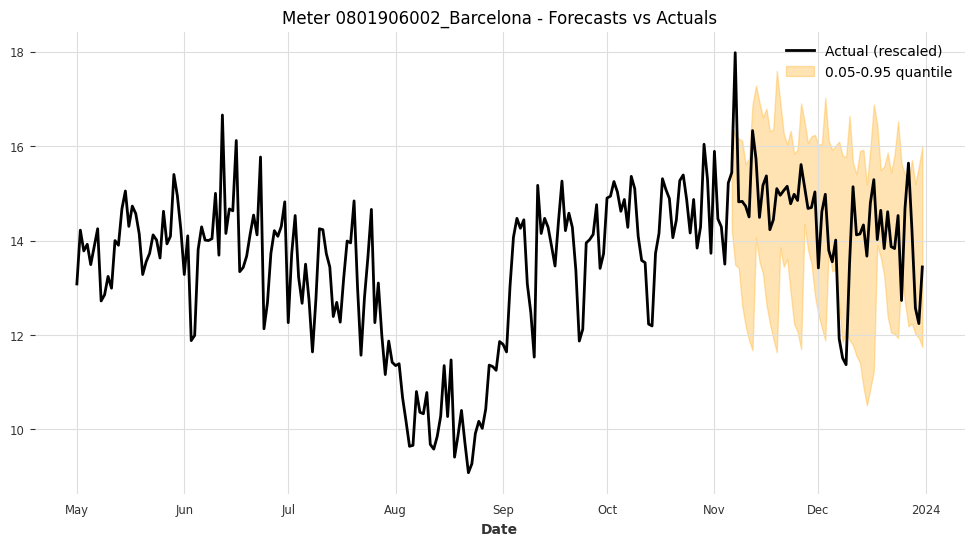

Meter 0801906002_Barcelona - Coverage: 0.8750, Width: 3.5789



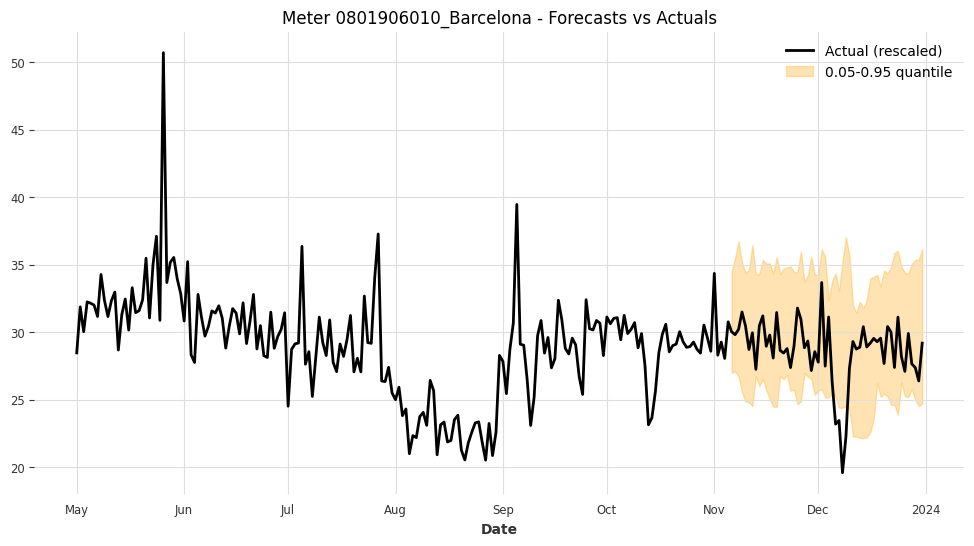

Meter 0801906010_Barcelona - Coverage: 0.9286, Width: 9.4953



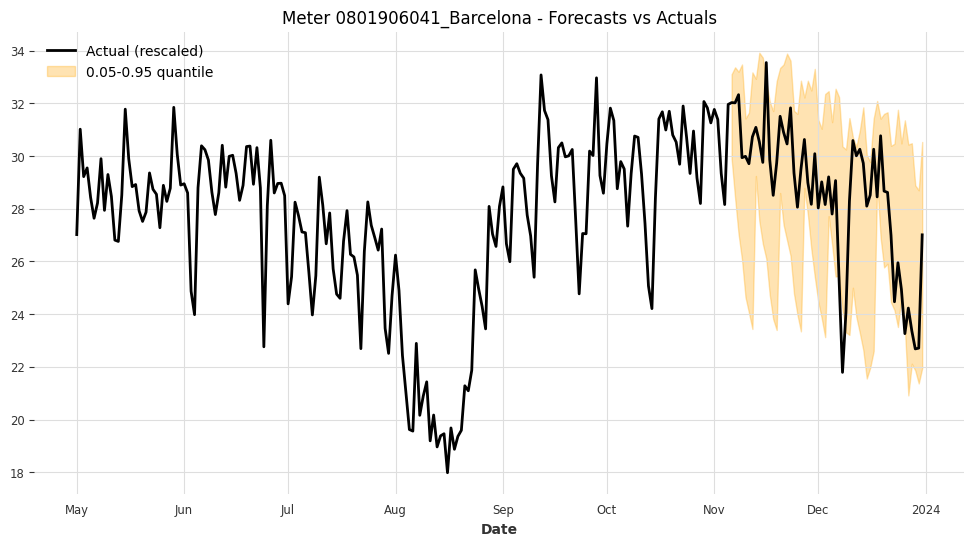

Meter 0801906041_Barcelona - Coverage: 0.9107, Width: 6.8305



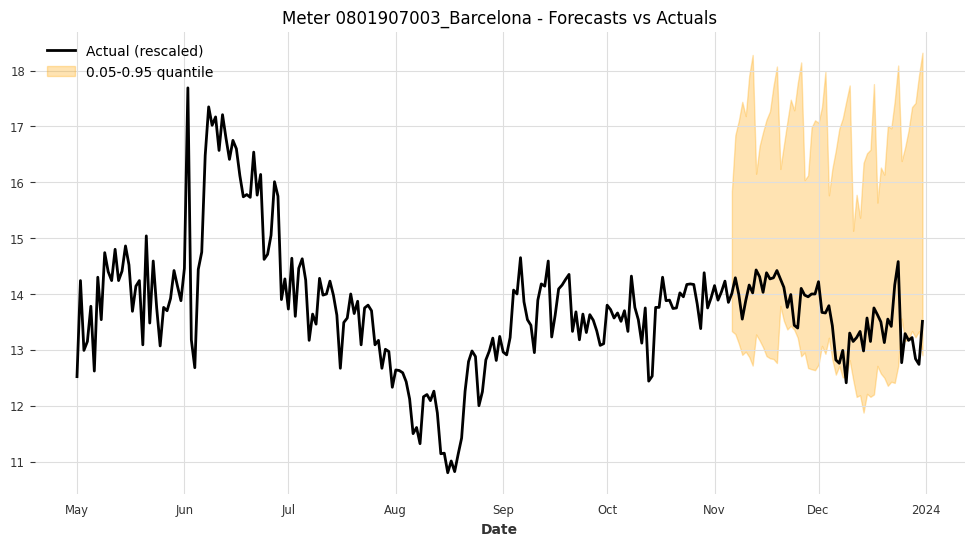

Meter 0801907003_Barcelona - Coverage: 0.8929, Width: 4.0993



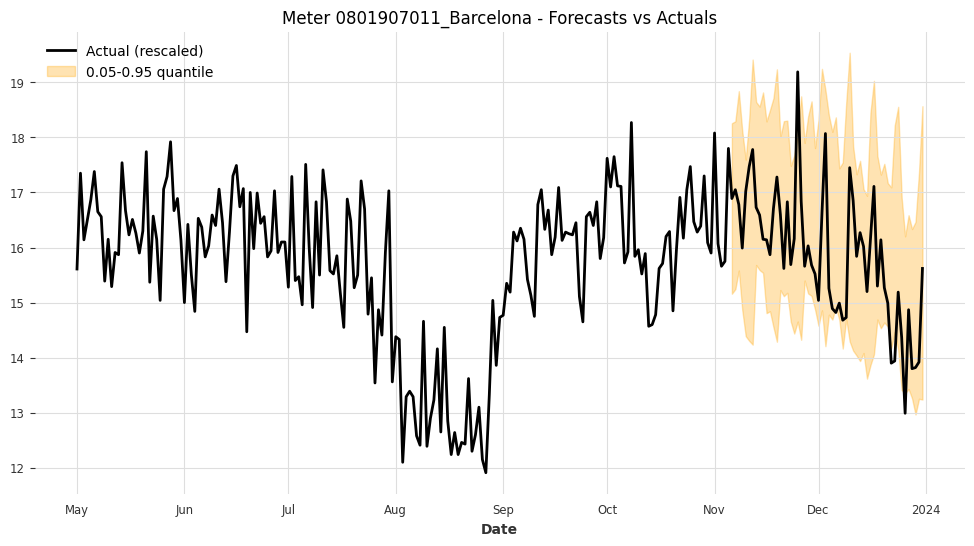

Meter 0801907011_Barcelona - Coverage: 0.9107, Width: 3.5460



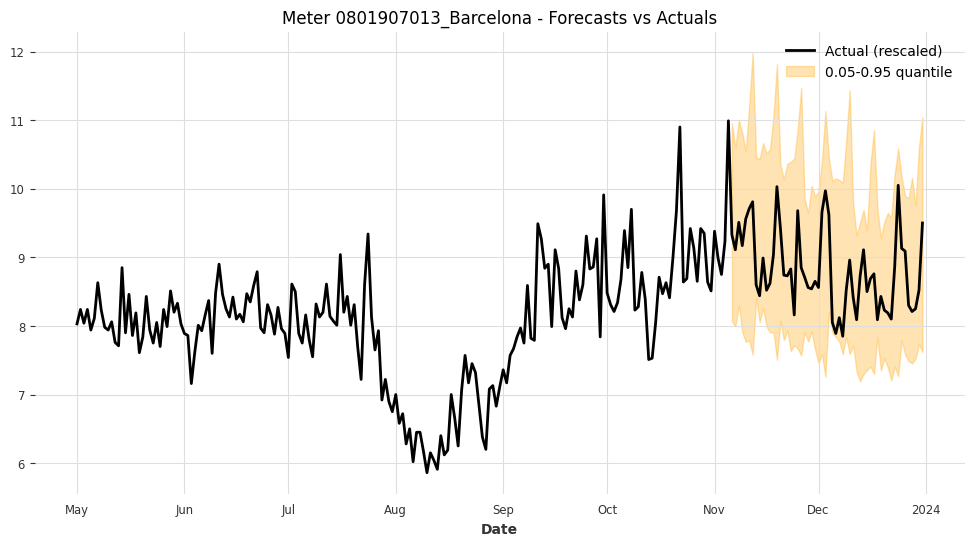

Meter 0801907013_Barcelona - Coverage: 1.0000, Width: 2.6551



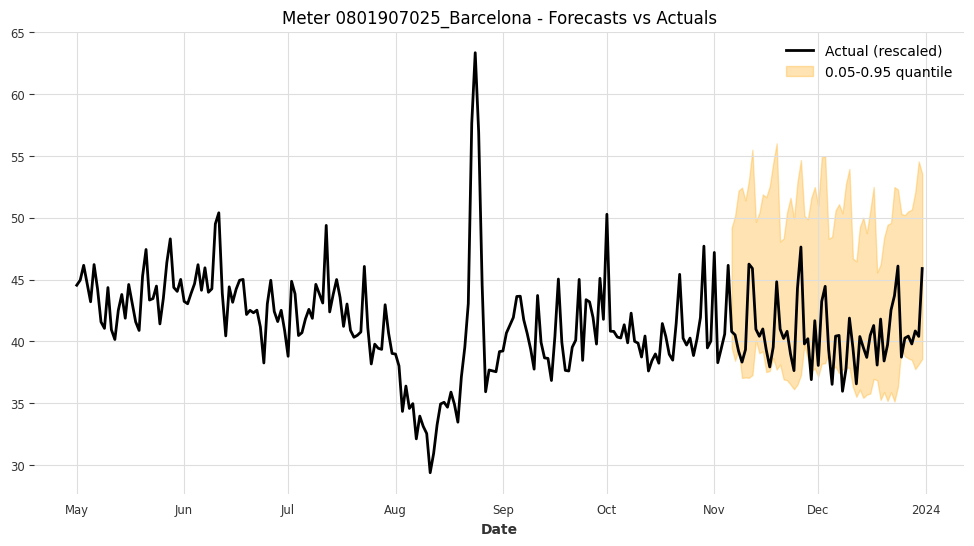

Meter 0801907025_Barcelona - Coverage: 0.8929, Width: 13.5373



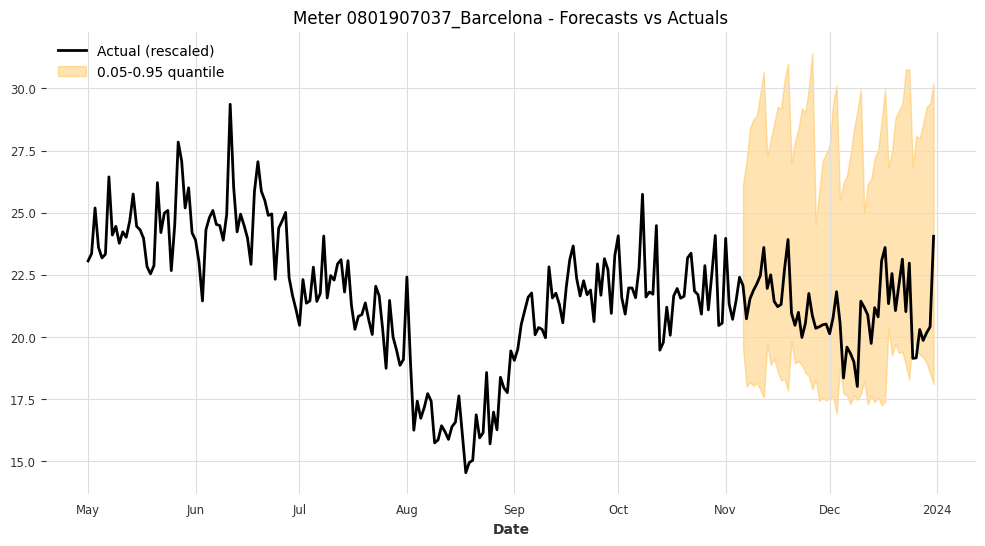

Meter 0801907037_Barcelona - Coverage: 0.9643, Width: 9.9474



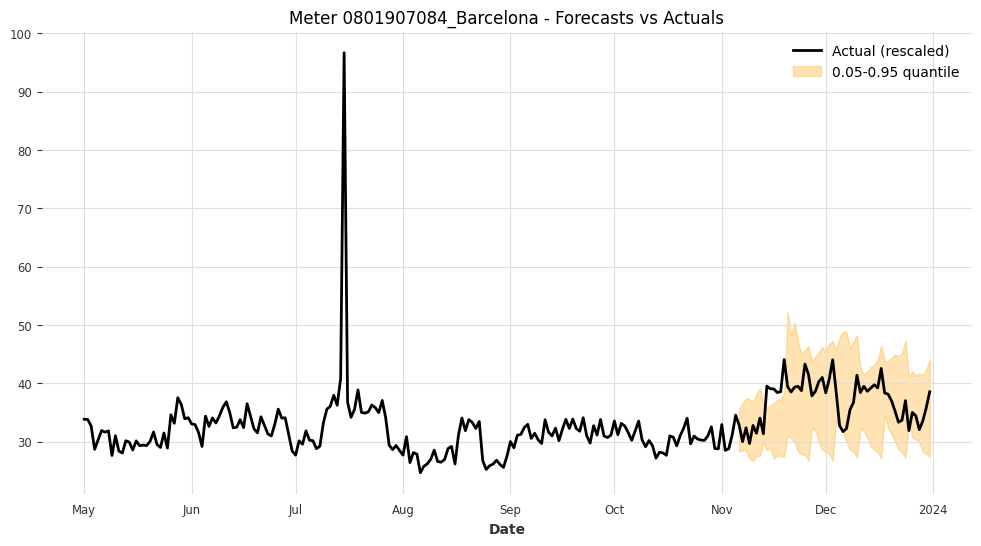

Meter 0801907084_Barcelona - Coverage: 0.8571, Width: 13.8829



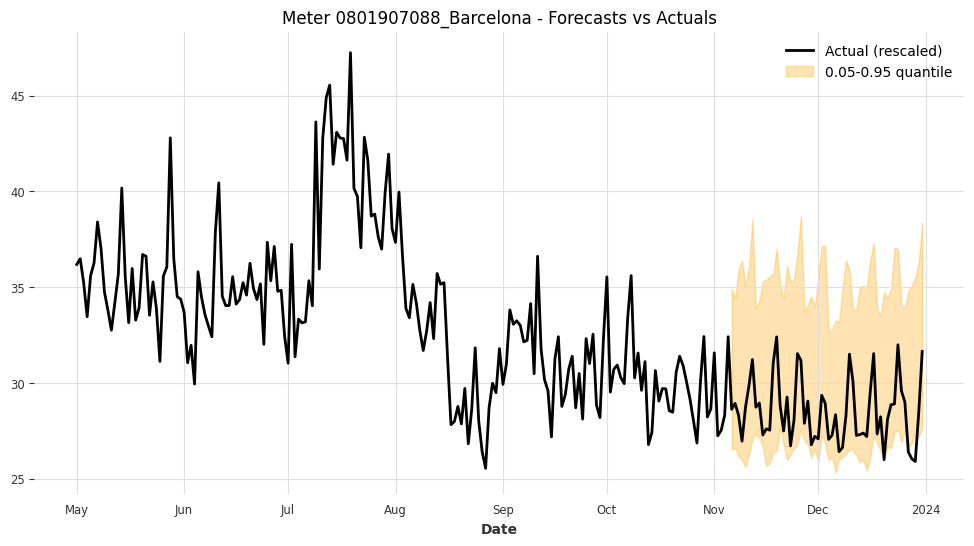

Meter 0801907088_Barcelona - Coverage: 0.9286, Width: 8.7067



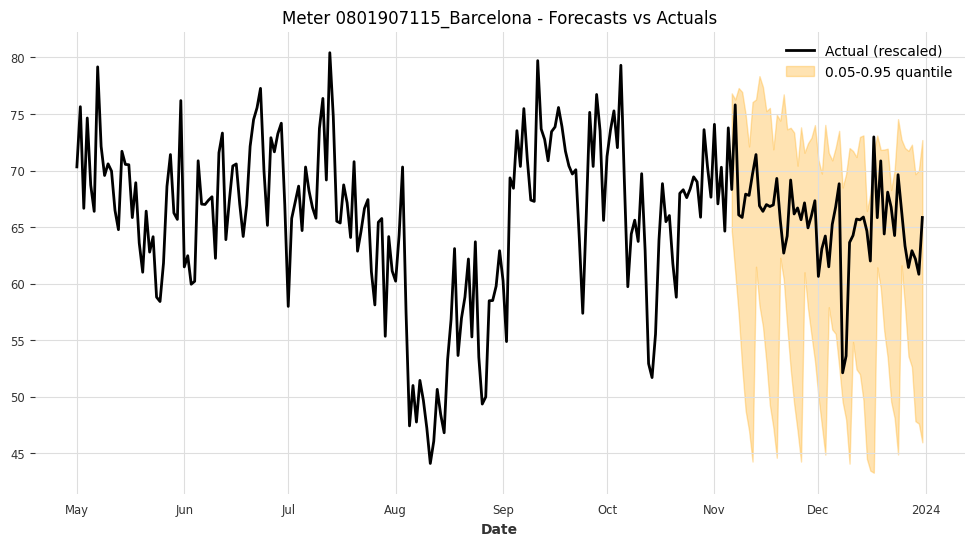

Meter 0801907115_Barcelona - Coverage: 0.9821, Width: 20.4612



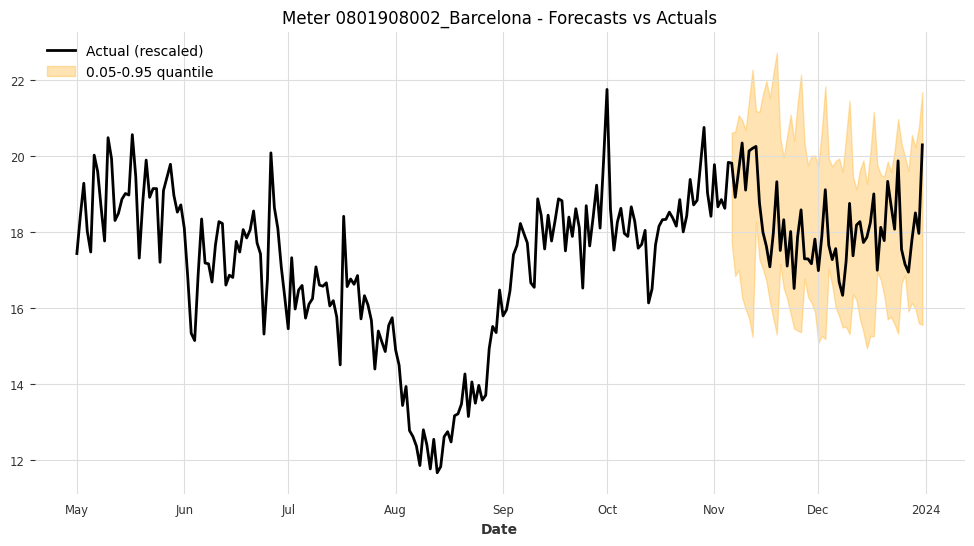

Meter 0801908002_Barcelona - Coverage: 1.0000, Width: 4.4793



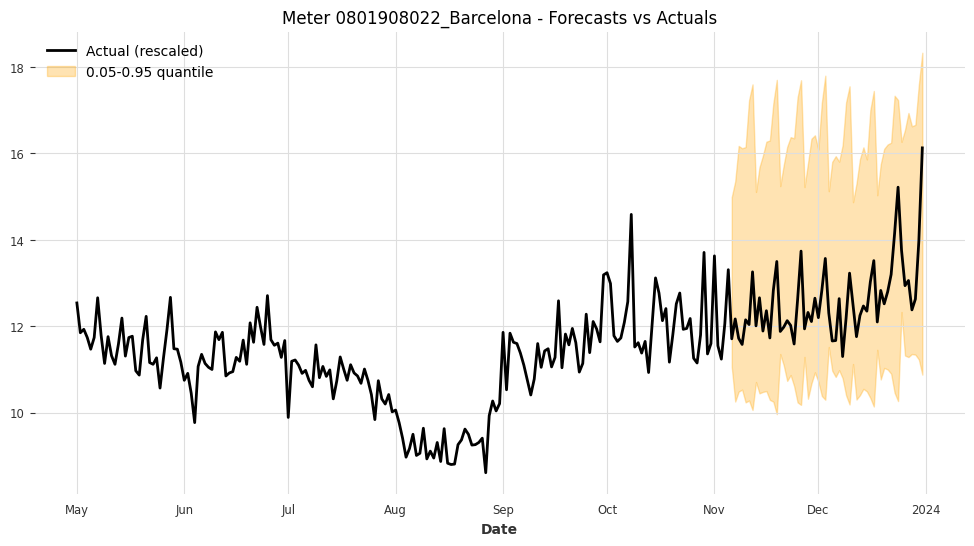

Meter 0801908022_Barcelona - Coverage: 1.0000, Width: 5.6516



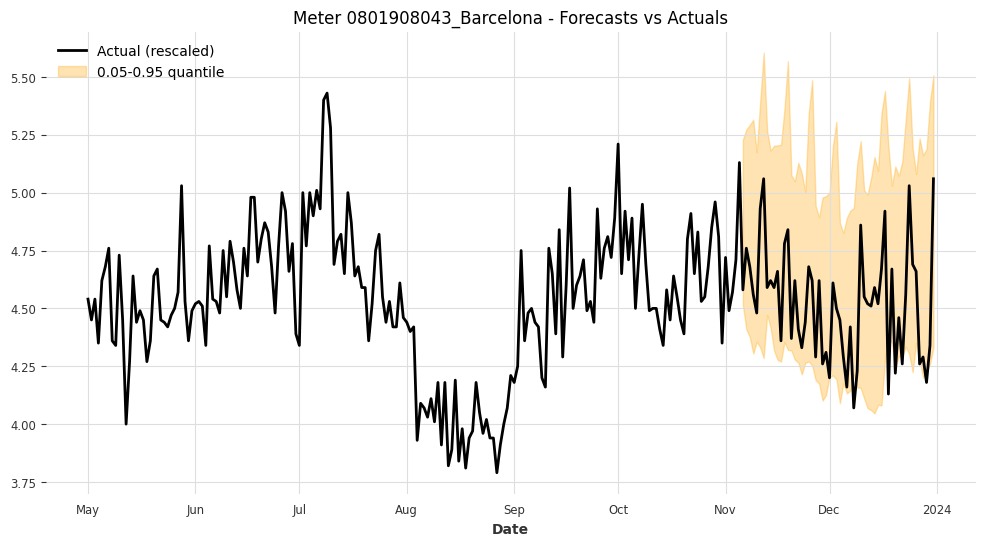

Meter 0801908043_Barcelona - Coverage: 0.8750, Width: 0.9254



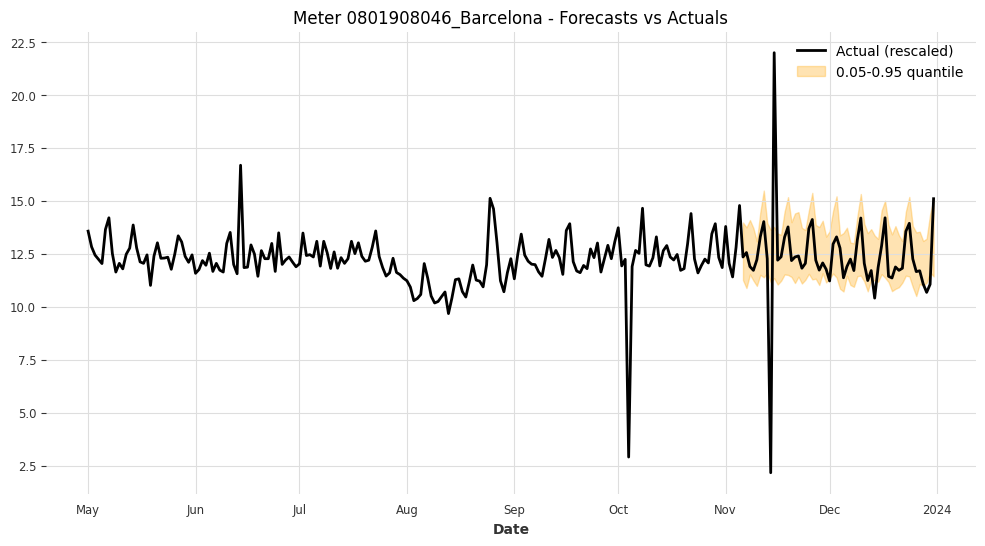

Meter 0801908046_Barcelona - Coverage: 0.8750, Width: 2.7393



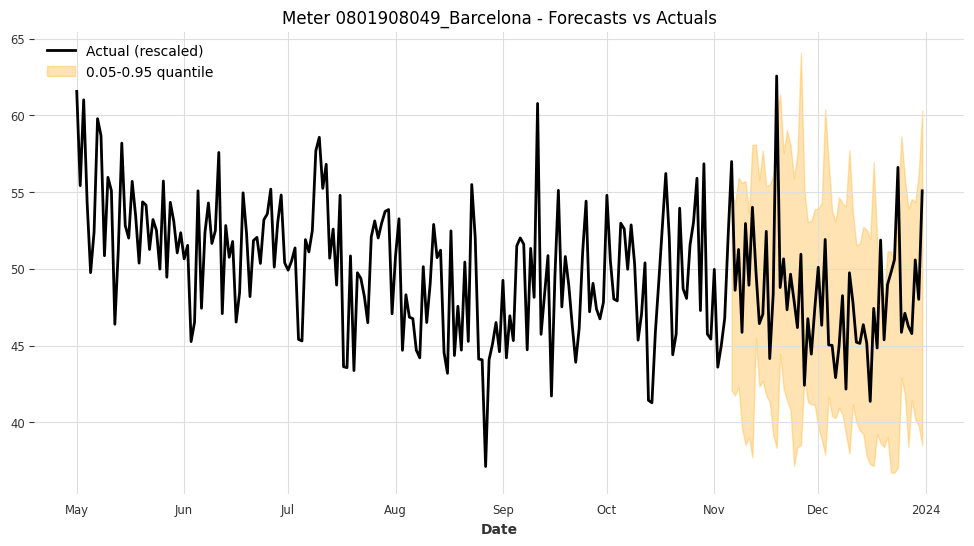

Meter 0801908049_Barcelona - Coverage: 0.8929, Width: 15.1582



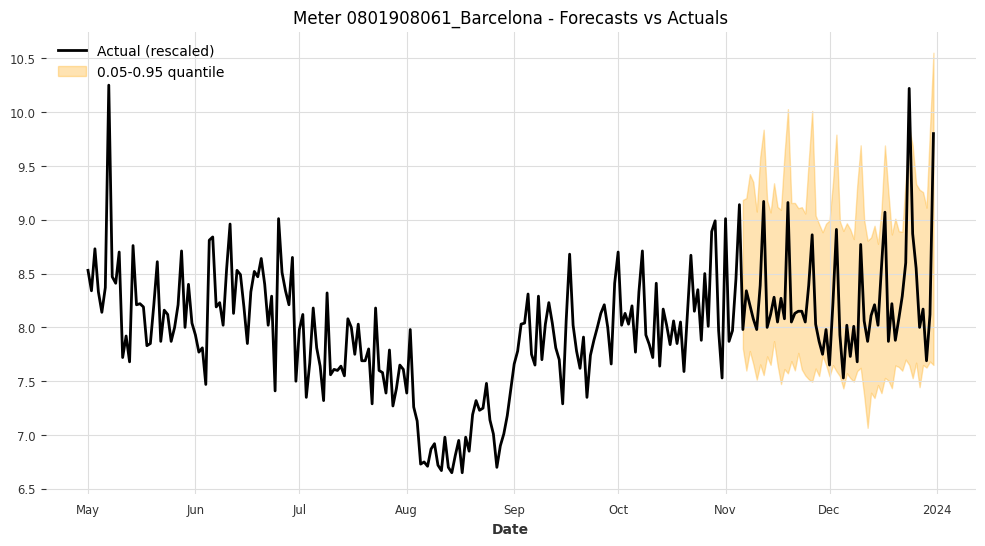

Meter 0801908061_Barcelona - Coverage: 0.9821, Width: 1.6720



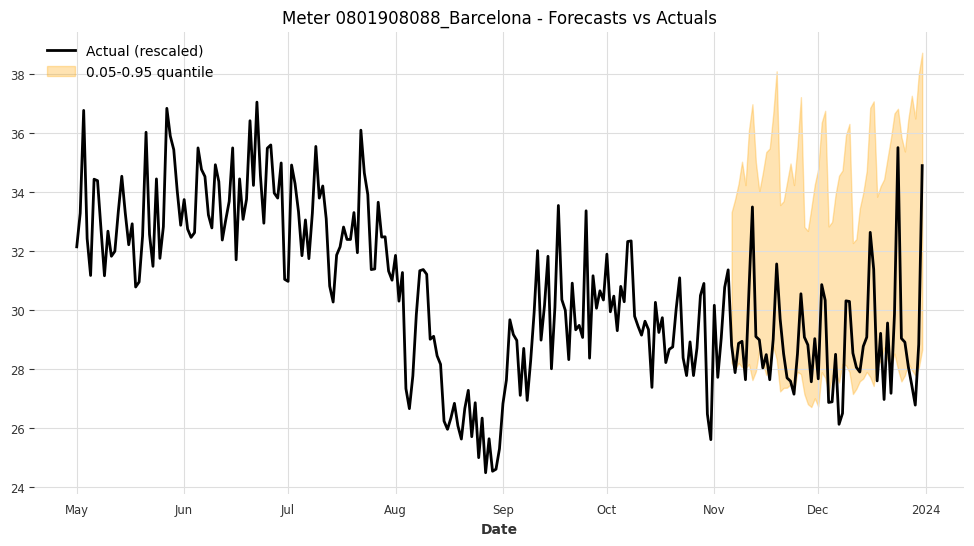

Meter 0801908088_Barcelona - Coverage: 0.7321, Width: 7.2526



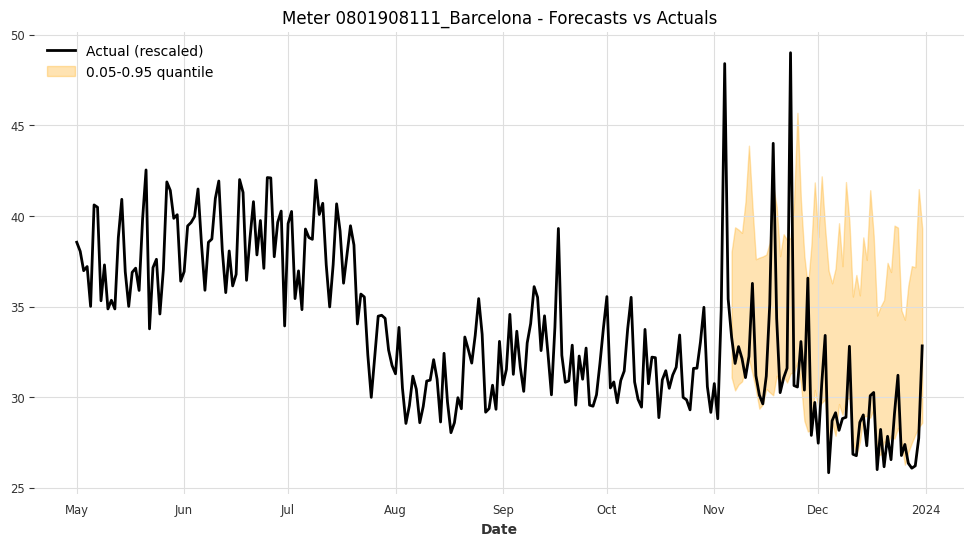

Meter 0801908111_Barcelona - Coverage: 0.5357, Width: 9.3369



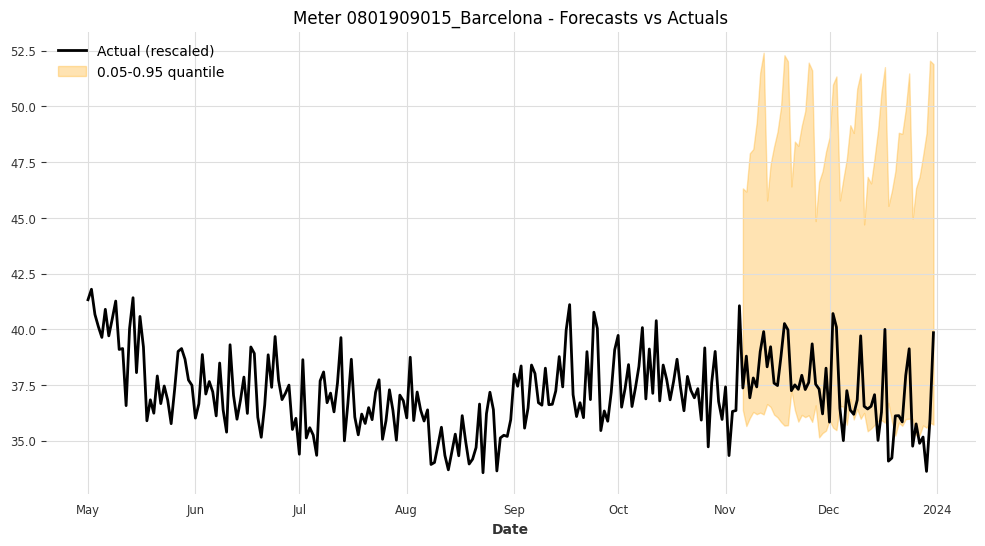

Meter 0801909015_Barcelona - Coverage: 0.7857, Width: 12.6632



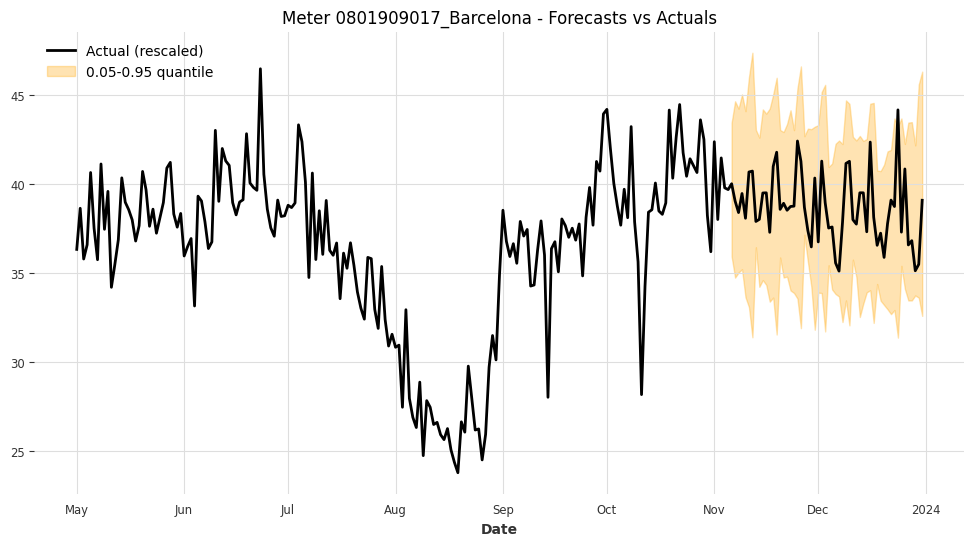

Meter 0801909017_Barcelona - Coverage: 0.9821, Width: 9.7491



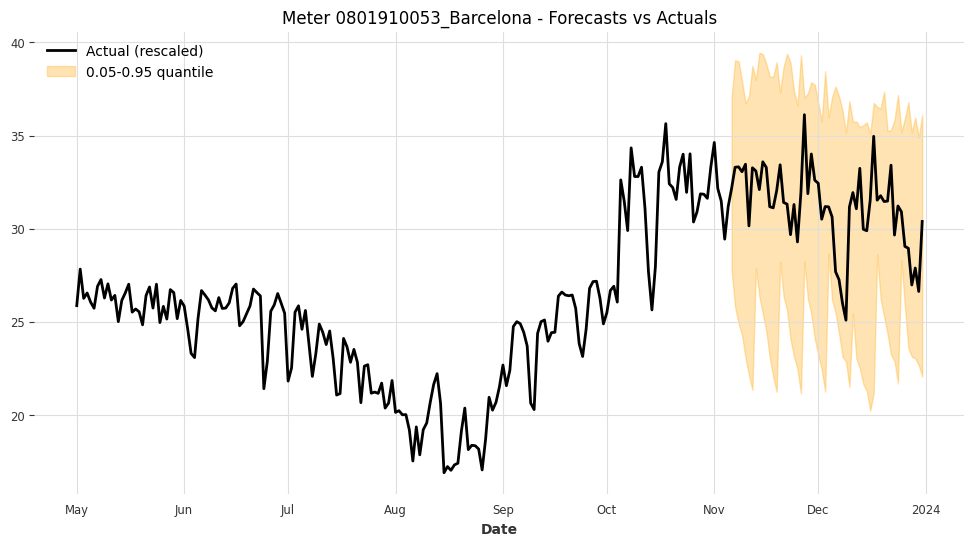

Meter 0801910053_Barcelona - Coverage: 1.0000, Width: 12.9472



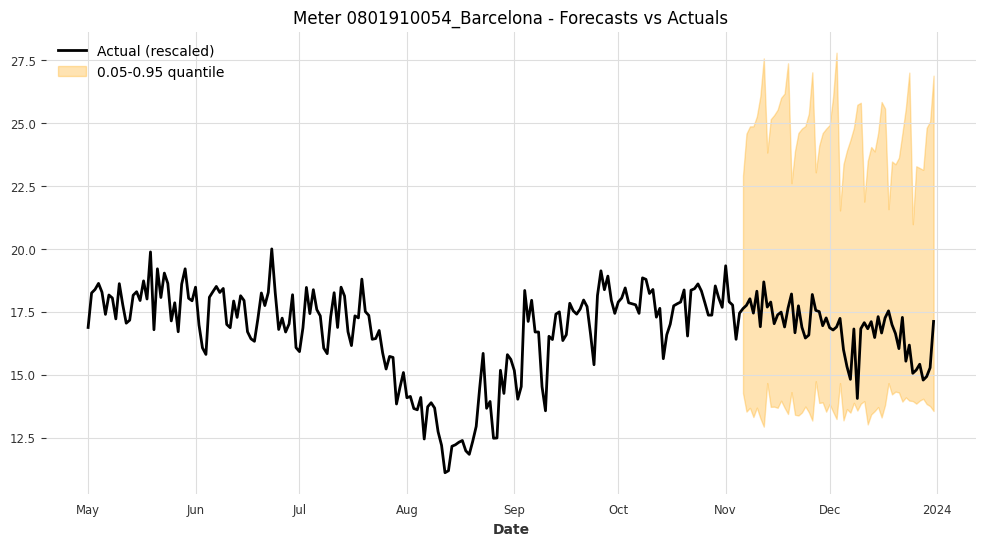

Meter 0801910054_Barcelona - Coverage: 1.0000, Width: 10.8631



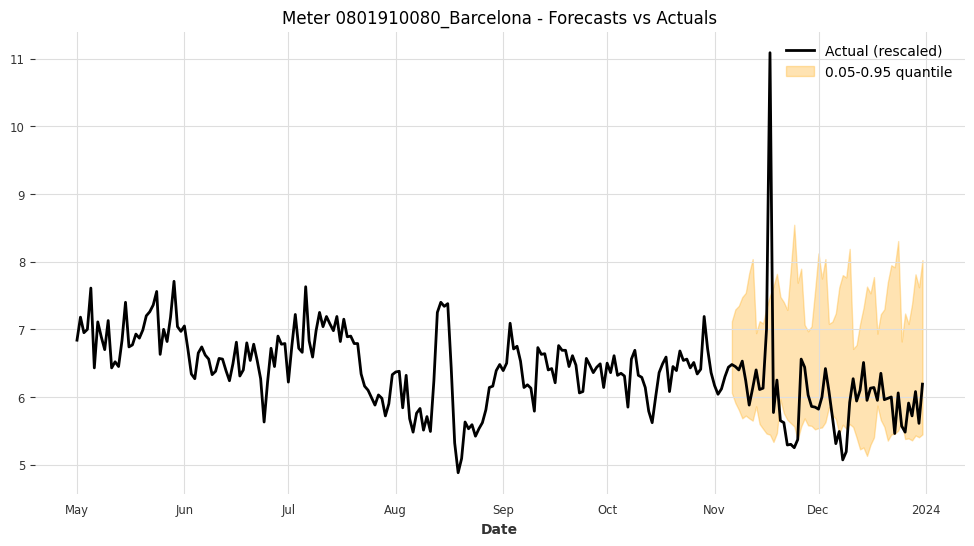

Meter 0801910080_Barcelona - Coverage: 0.7857, Width: 1.9350



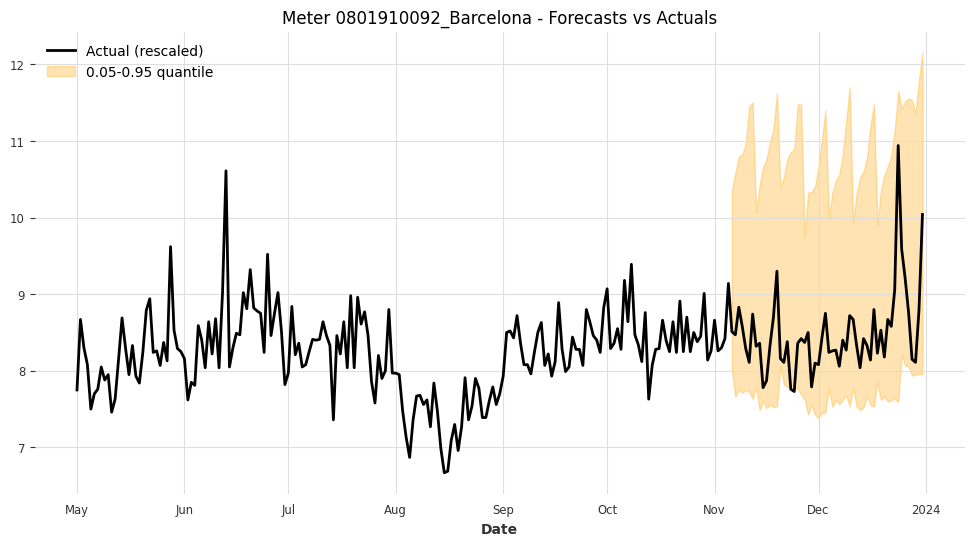

Meter 0801910092_Barcelona - Coverage: 0.9643, Width: 3.1859



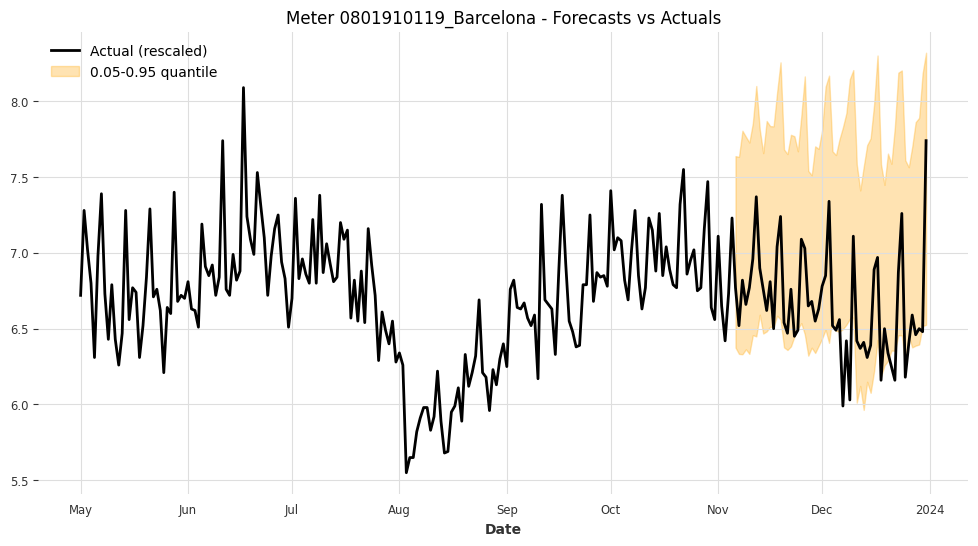

Meter 0801910119_Barcelona - Coverage: 0.7857, Width: 1.4279



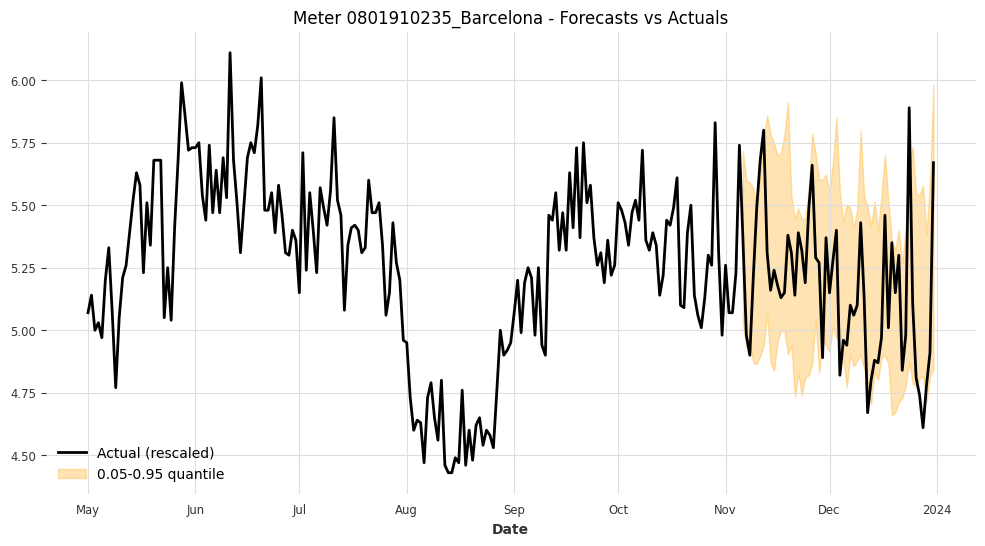

Meter 0801910235_Barcelona - Coverage: 0.8214, Width: 0.7226



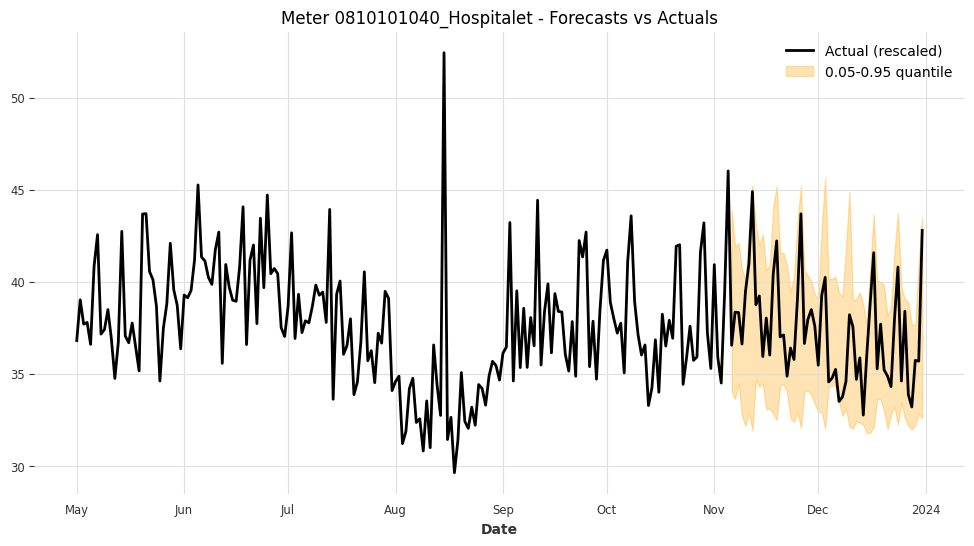

Meter 0810101040_Hospitalet - Coverage: 1.0000, Width: 8.0136



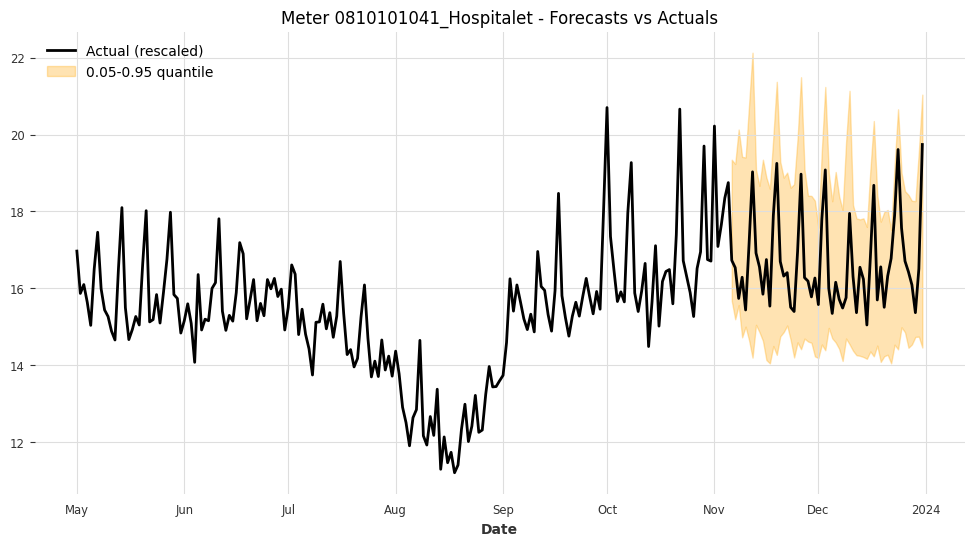

Meter 0810101041_Hospitalet - Coverage: 1.0000, Width: 4.5433



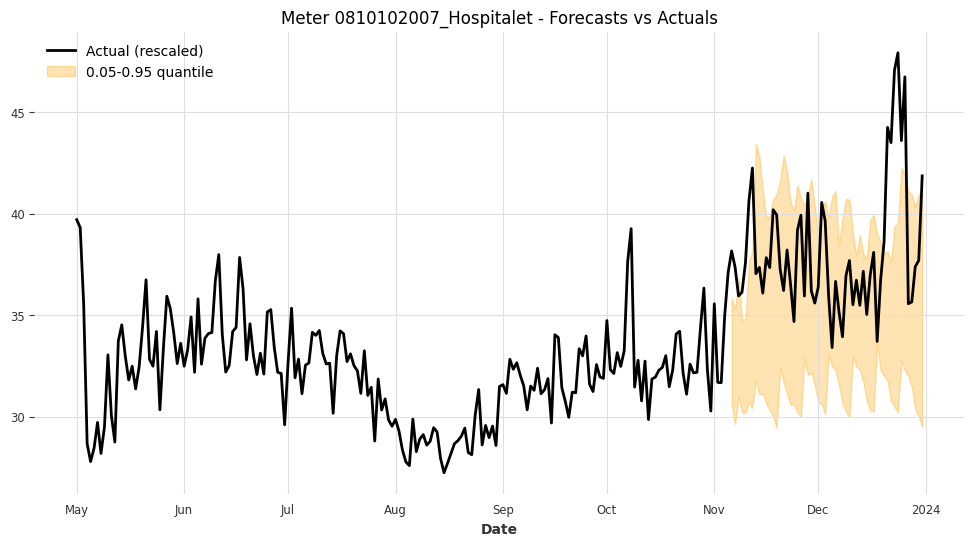

Meter 0810102007_Hospitalet - Coverage: 0.7143, Width: 8.6076



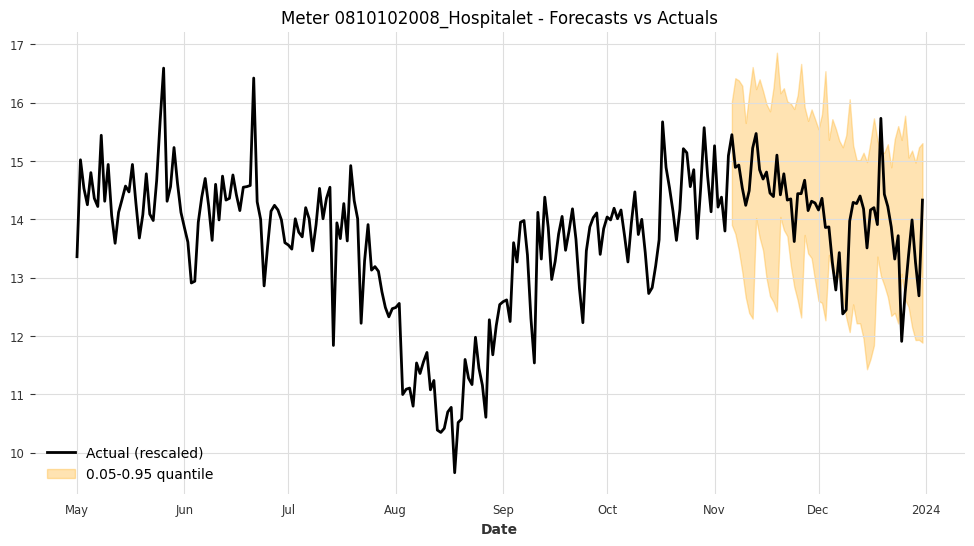

Meter 0810102008_Hospitalet - Coverage: 0.9286, Width: 2.9462



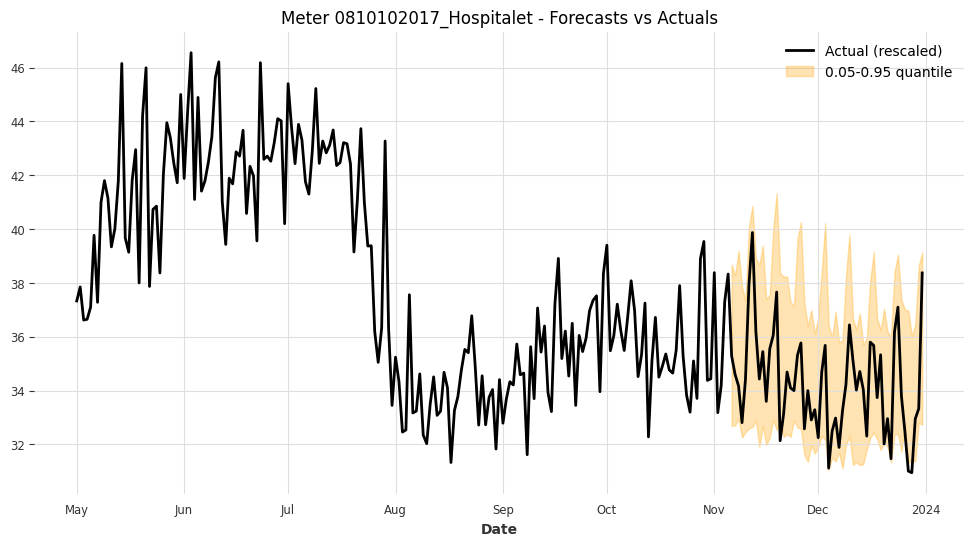

Meter 0810102017_Hospitalet - Coverage: 0.9107, Width: 5.6896



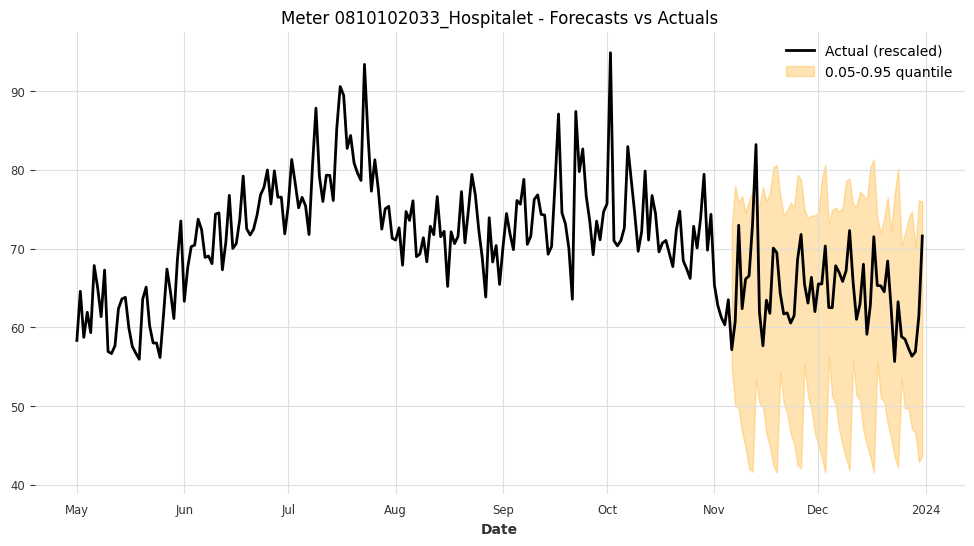

Meter 0810102033_Hospitalet - Coverage: 0.9821, Width: 28.4333



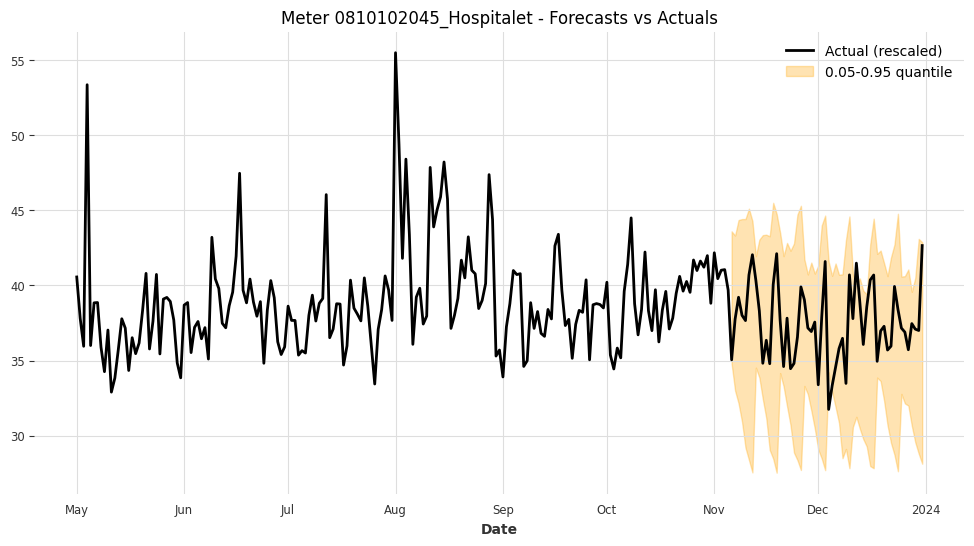

Meter 0810102045_Hospitalet - Coverage: 0.9643, Width: 11.8285



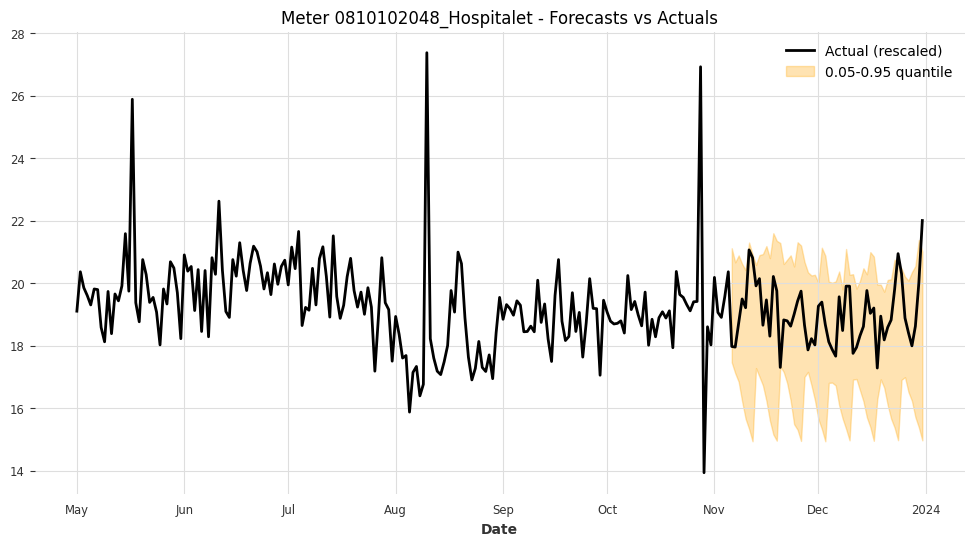

Meter 0810102048_Hospitalet - Coverage: 0.9464, Width: 4.4716



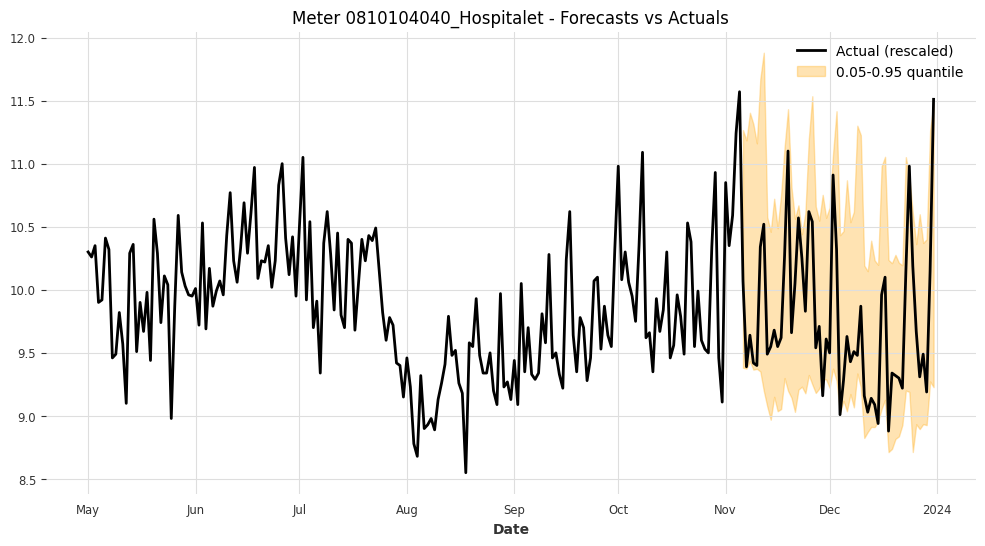

Meter 0810104040_Hospitalet - Coverage: 0.9107, Width: 1.6652



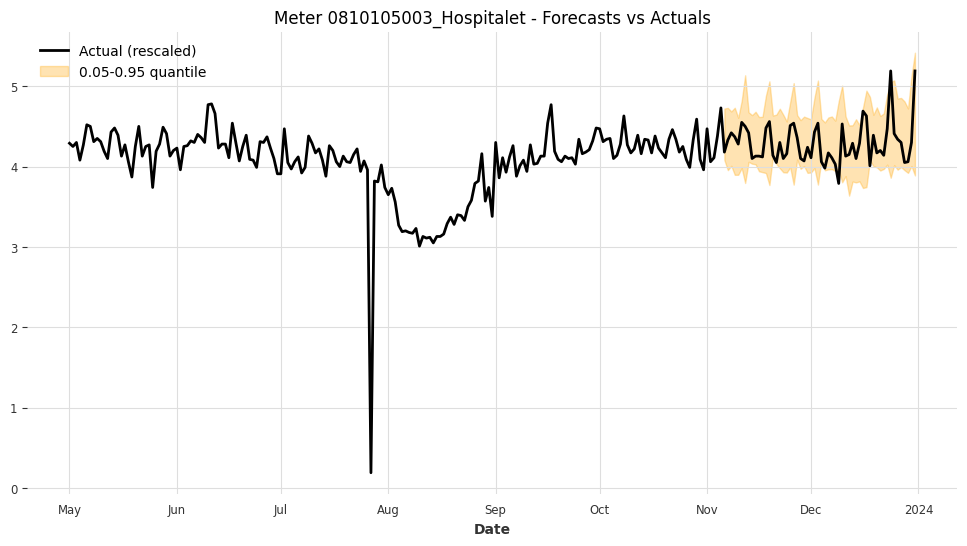

Meter 0810105003_Hospitalet - Coverage: 0.9286, Width: 0.8156



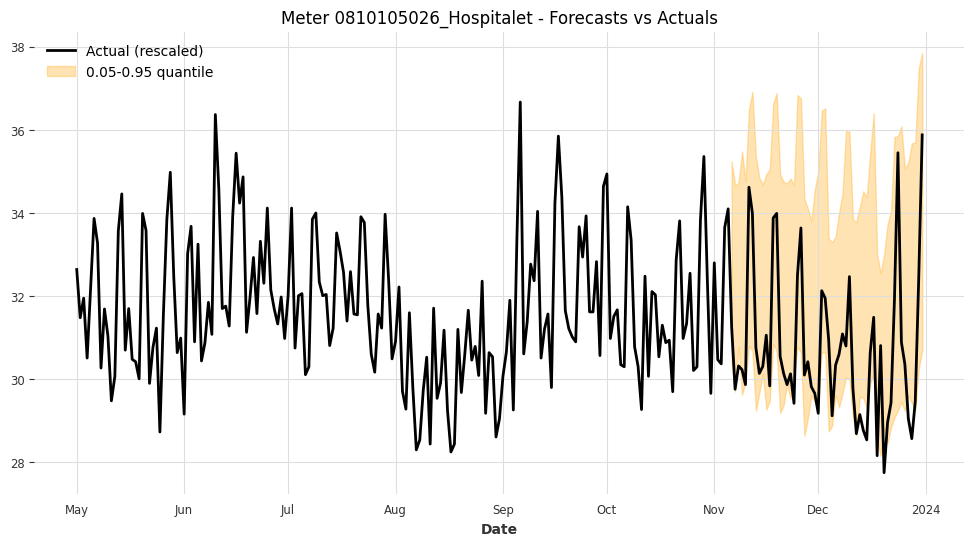

Meter 0810105026_Hospitalet - Coverage: 0.7857, Width: 5.4180



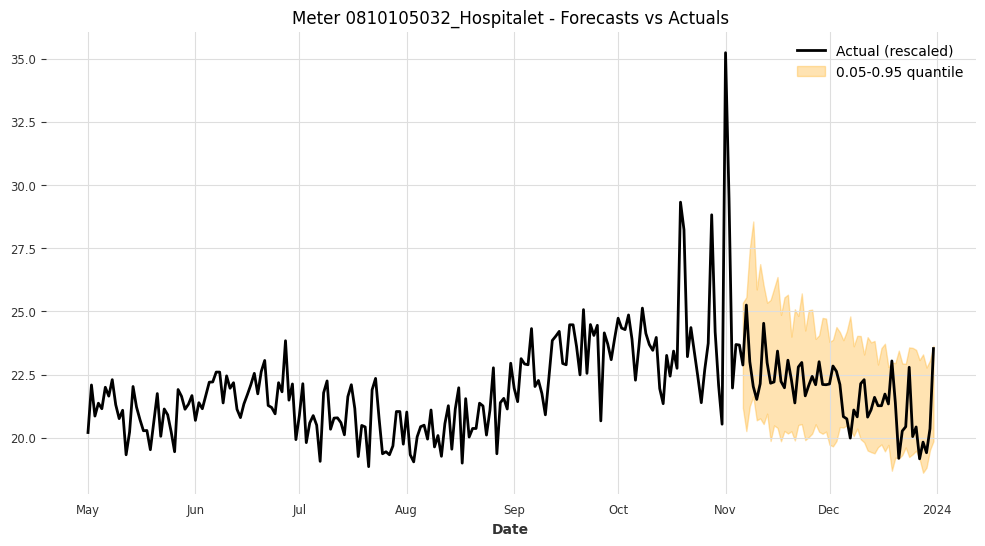

Meter 0810105032_Hospitalet - Coverage: 0.9643, Width: 4.4227



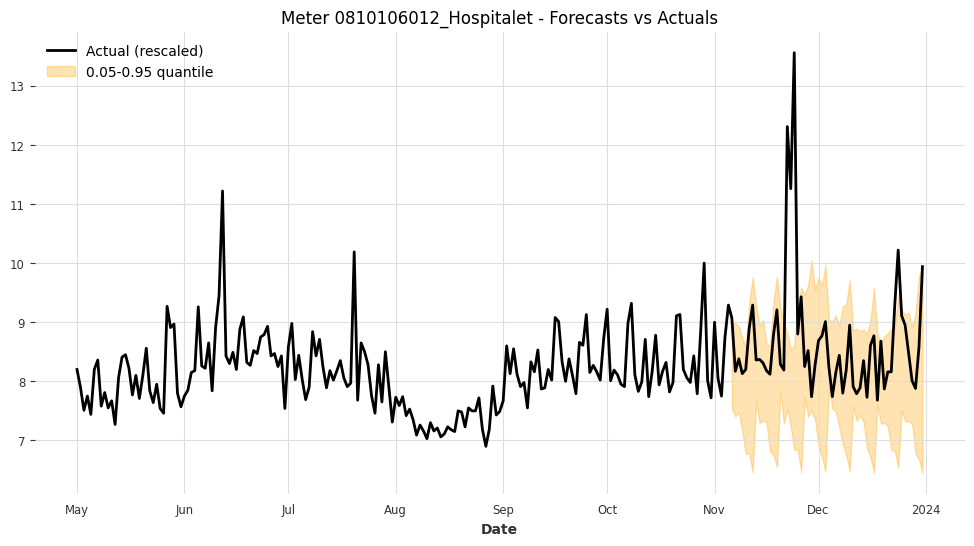

Meter 0810106012_Hospitalet - Coverage: 0.8571, Width: 2.0419



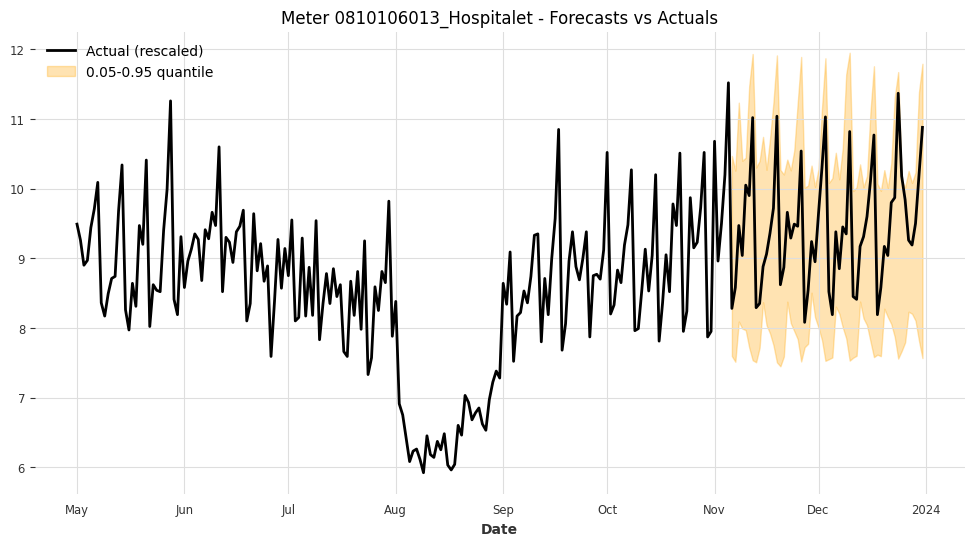

Meter 0810106013_Hospitalet - Coverage: 0.9821, Width: 2.7882



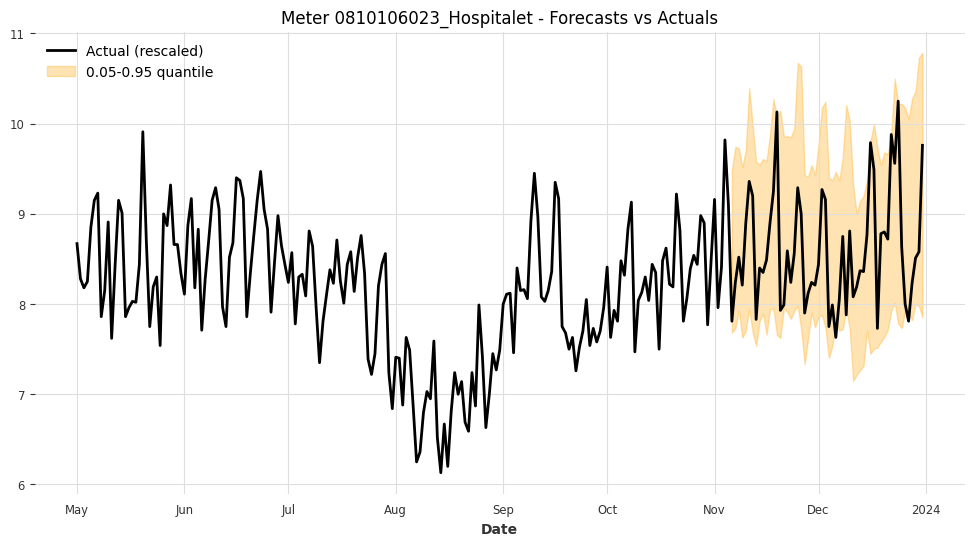

Meter 0810106023_Hospitalet - Coverage: 0.9107, Width: 2.1187



In [ ]:
import matplotlib.pyplot as plt
from darts import concatenate  # Darts utility to merge TimeSeries

for meter_id, hfcs in all_hfcs.items():
    # Get the actual time series
    ts = scaled_calib_test_series[meter_id]

    # Get scaler and results
    scaler = scalers_test[meter_id]
    df_result = all_bt_results[meter_id]
    coverage = df_result["Coverage"].iloc[0]
    width = df_result["Width rescaled"].iloc[0]

    # Start a new plot
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actuals (rescaled)
    ts_orig = scaler.inverse_transform(ts)
    ts_orig.plot(ax=ax, label='Actual (rescaled)', lw=2)

    full_lower = []
    full_upper = []

    # Collect lower and upper quantiles from each forecast window
    for forecast in hfcs:
        if ('Consumption per meter_q0.05' in forecast.components
            and 'Consumption per meter_q0.95' in forecast.components):

            lower = forecast['Consumption per meter_q0.05']
            upper = forecast['Consumption per meter_q0.95']
            lower_orig = scaler.inverse_transform(lower)
            upper_orig = scaler.inverse_transform(upper)
            full_lower.append(lower_orig)
            full_upper.append(upper_orig)


    if full_lower and full_upper:
        # Concatenate all the TimeSeries pieces into full series
        combined_lower = concatenate(full_lower)
        combined_upper = concatenate(full_upper)

        # Plot the quantile area as a filled region
        ax.fill_between(
            combined_lower.time_index,
            combined_lower.values().flatten(),
            combined_upper.values().flatten(),
            color='orange',
            alpha=0.3,
            label='0.05-0.95 quantile'
        )

    ax.set_title(f"Meter {meter_id} - Forecasts vs Actuals")
    ax.legend()
    plt.show()

    # Print the metrics below each plot
    print(f"Meter {meter_id} - Coverage: {coverage:.4f}, Width: {width:.4f}\n")


In [ ]:
# Specific test

In [ ]:
# Load model
model = LightGBMModel.load("/content/drive/MyDrive/Colab Notebooks/TFG/data/02_models/lightGBM/simple/lightgbm_model.pkl")

In [ ]:
# Load the test data
test_data = joblib.load('/content/drive/MyDrive/Colab Notebooks/TFG/data/01_datasets/train_test_reduced/scaled_test_reduced.pkl')

# Extract components
scaled_val_series = test_data['validation']        # validation not used in our case
scaled_calib_test_series = test_data['calib_test']
scalers_test = test_data['scalers']           # the scalers to reescale the series later

# Reuse the same sorted meter IDs to align
meter_ids_test = sorted(scaled_calib_test_series.keys())

# Build aligned lists
test_series_scaled = [scaled_calib_test_series[meter_id] for meter_id in meter_ids_test]

print(f"Loaded {len(test_series_scaled)} time series for testing.")

Loaded 60 time series for testing.


In [ ]:
# Constants
start_date = pd.Timestamp("2023-11-6")
horizon = 7
quantiles = [0.05, 0.5, 0.95]
pred_kwargs={"predict_likelihood_parameters": True, "verbose": True}

# Initialize the conformal quantile regression model
cp_model = ConformalQRModel(
    model=model,
    quantiles=quantiles,
    symmetric=False
    # if cal_length is None, it considers all calibration scores
)
q_interval = cp_model.q_interval  # [(0.05, 0.95)]
q_range = cp_model.interval_range  # [0.9]

# Prepare to collect results
all_hfcs = {}
all_bt_results = {}

# We loop over each time series
for meter_id, ts in zip(meter_ids_test, test_series_scaled):
    # Historical forecasts
    hfcs = cp_model.historical_forecasts(
        series=ts,
        forecast_horizon=7,
        start=start_date,
        last_points_only=False,
        stride=7,
        **pred_kwargs,
    )

    scaler = scalers_test[meter_id]
    widths = []

    for forecast in hfcs:
        q05 = forecast["Consumption per meter_q0.05"]
        q95 = forecast["Consumption per meter_q0.95"]
        q05_orig = scaler.inverse_transform(q05)
        q95_orig = scaler.inverse_transform(q95)
        width = (q95_orig - q05_orig).values()
        widths.append(width)

    mean_width = np.mean([np.mean(w) for w in widths])

    # We evaluate the already-generated historical forecasts
    bt = cp_model.backtest(
        ts,
        historical_forecasts=hfcs,
        last_points_only=False,
        retrain=False,
        metric=[metrics.mic, metrics.miw],
        metric_kwargs={"q_interval": q_interval},
    )
    df_results = pd.DataFrame({"Interval": q_range, "Coverage": bt[0], "Width": bt[1], "Width rescaled": mean_width})
    print(f"Results for meter {meter_id}:\n", df_results, "\n")

    # Store results
    all_hfcs[meter_id] = hfcs
    all_bt_results[meter_id] = df_results

# We combine results across meters
combined_results = pd.concat(all_bt_results.values(), keys=all_bt_results.keys())
combined_results.reset_index(level=1, drop=True, inplace=True)


conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 307.13it/s]


Results for meter 0801902043_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.259137        3.075954 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 469.22it/s]


Results for meter 0801903008_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.192506        3.803919 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 459.85it/s]


Results for meter 0801903021_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.412412        1.690888 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 369.03it/s]


Results for meter 0801903026_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.337867        2.429264 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 480.51it/s]


Results for meter 0801903035_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.320507         0.89742 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.04it/s]


Results for meter 0801903037_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.474403        2.789492 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 325.22it/s]


Results for meter 0801903213_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.355947        0.544599 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 456.22it/s]


Results for meter 0801904027_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.946429  0.29803         4.73867 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 334.18it/s]


Results for meter 0801904047_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.236134        3.586877 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 481.85it/s]


Results for meter 0801904049_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.910714  0.50602        4.549122 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 472.34it/s]


Results for meter 0801905057_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.341397        3.765606 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 384.00it/s]


Results for meter 0801906071_Barcelona:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.355333        1.879713 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 482.86it/s]


Results for meter 0801910007_Barcelona:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.910714  0.38501        1.258983 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 324.12it/s]


Results for meter 0807302003_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.205428        6.477157 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 424.13it/s]


Results for meter 0807710008_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.821429  0.16795        69.86724 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 462.75it/s]


Results for meter 0810101004_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.429025         9.87615 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 466.78it/s]


Results for meter 0810101011_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.982143  0.29393        4.406004 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 466.71it/s]


Results for meter 0810101018_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.964286  0.27954        1.408879 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 298.07it/s]


Results for meter 0810101019_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.275295        1.943582 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 447.40it/s]


Results for meter 0810101024_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.839286  0.447317        3.851397 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 469.12it/s]


Results for meter 0810101029_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.294923        7.287543 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 344.64it/s]


Results for meter 0810101033_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.414511        6.346171 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.73it/s]


Results for meter 0810101039_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.353767        5.193303 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 486.12it/s]


Results for meter 0810101040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9       1.0  0.407472        8.149448 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 450.01it/s]


Results for meter 0810102005_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.360644        3.404475 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 451.53it/s]


Results for meter 0810102007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.678571  0.510351        7.160225 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 343.78it/s]


Results for meter 0810102016_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.359664        5.135999 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 449.15it/s]


Results for meter 0810102024_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.482005        3.431875 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 478.28it/s]


Results for meter 0810102034_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.276958        7.652363 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 462.46it/s]


Results for meter 0810102038_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.596804        8.480587 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 472.40it/s]


Results for meter 0810102039_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.548729        8.318732 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 310.32it/s]


Results for meter 0810102045_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.442594       10.967479 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 424.05it/s]


Results for meter 0810102048_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.171345        4.149977 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 470.87it/s]


Results for meter 0810102049_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.460019        4.365579 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 307.44it/s]


Results for meter 0810103002_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.899177        1.762387 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 490.55it/s]


Results for meter 0810103006_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.245832        6.384262 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.87it/s]


Results for meter 0810103011_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.406426        4.682031 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 460.43it/s]


Results for meter 0810103012_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.330205        0.501912 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 348.11it/s]


Results for meter 0810103018_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.406413        2.503503 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 401.94it/s]


Results for meter 0810103022_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.306186        3.977357 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 393.32it/s]


Results for meter 0810104007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.399364        4.744443 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 447.23it/s]


Results for meter 0810104010_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.946429  0.42432        2.864163 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 256.56it/s]


Results for meter 0810104011_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.131415        3.600771 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 425.27it/s]


Results for meter 0810104033_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.377164        4.246865 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 456.91it/s]


Results for meter 0810104035_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.473528        1.098586 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 462.31it/s]


Results for meter 0810104040_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.388677         1.74516 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 434.55it/s]


Results for meter 0810105001_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.289069        0.942364 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 281.59it/s]


Results for meter 0810105007_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.946429  0.332561        6.232191 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 441.29it/s]


Results for meter 0810105018_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.444499        3.098161 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 443.48it/s]


Results for meter 0810106005_Hospitalet:
    Interval  Coverage    Width  Width rescaled
0       0.9  0.910714  0.26362        2.499122 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 336.59it/s]


Results for meter 0810106008_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.349821         1.91352 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 433.52it/s]


Results for meter 0810106010_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.964286  0.294277        1.486101 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 461.68it/s]


Results for meter 0810106014_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.567962        2.249131 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 435.74it/s]


Results for meter 0810106016_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.254085        0.996014 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 408.79it/s]


Results for meter 0810106019_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.316033        1.346301 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 295.11it/s]


Results for meter 0810106021_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.982143  0.173322        2.076403 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 464.34it/s]


Results for meter 0810106022_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9     0.875  0.368885        1.125098 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 404.80it/s]


Results for meter 0810106023_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.892857  0.320538         1.91682 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 414.21it/s]


Results for meter 0810106026_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.928571  0.184301        0.632151 



conformal forecasts: 100%|██████████| 8/8 [00:00<00:00, 391.90it/s]


Results for meter 0810106032_Hospitalet:
    Interval  Coverage     Width  Width rescaled
0       0.9  0.910714  0.423645         2.38512 



In [ ]:
mean_coverage = combined_results["Coverage"].mean()
mean_width = combined_results["Width"].mean()
mean_width_rescaled = combined_results["Width rescaled"].mean()

print(f"Mean Coverage: {mean_coverage:.4f}")
print(f"Mean Width: {mean_width:.4f}")
print(f"Mean Width rescaled: {mean_width_rescaled:.4f}")

Mean Coverage: 0.9235
Mean Width: 0.3604
Mean Width rescaled: 4.8316


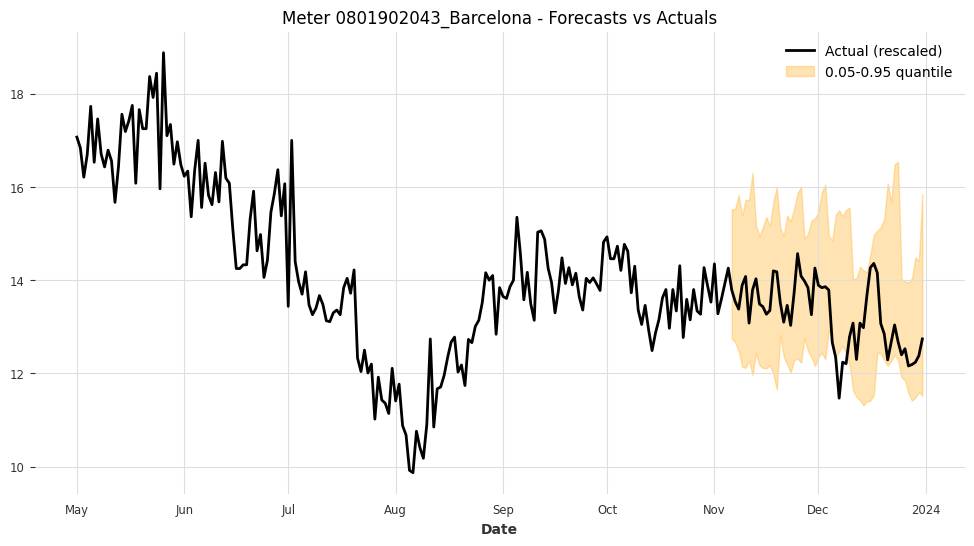

Meter 0801902043_Barcelona - Coverage: 0.9107, Width: 3.0760



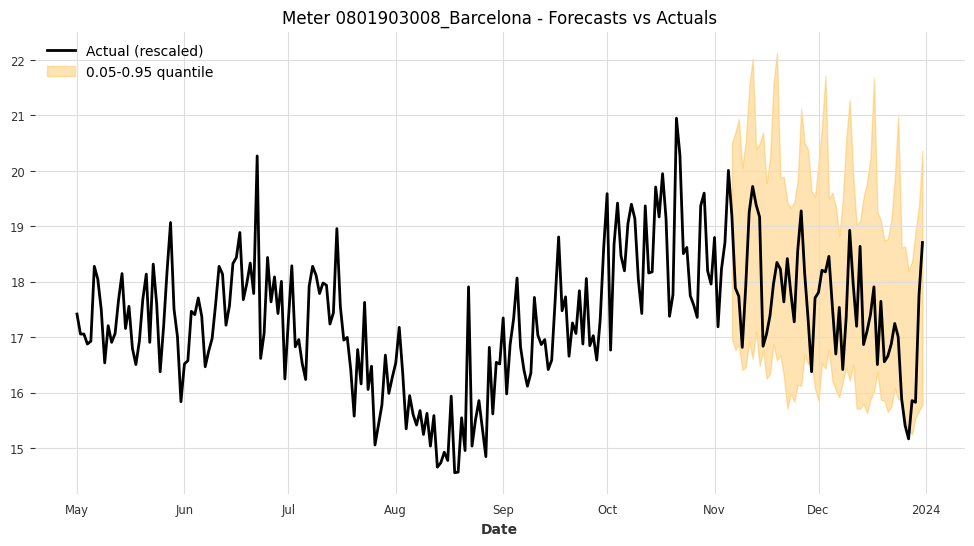

Meter 0801903008_Barcelona - Coverage: 0.9464, Width: 3.8039



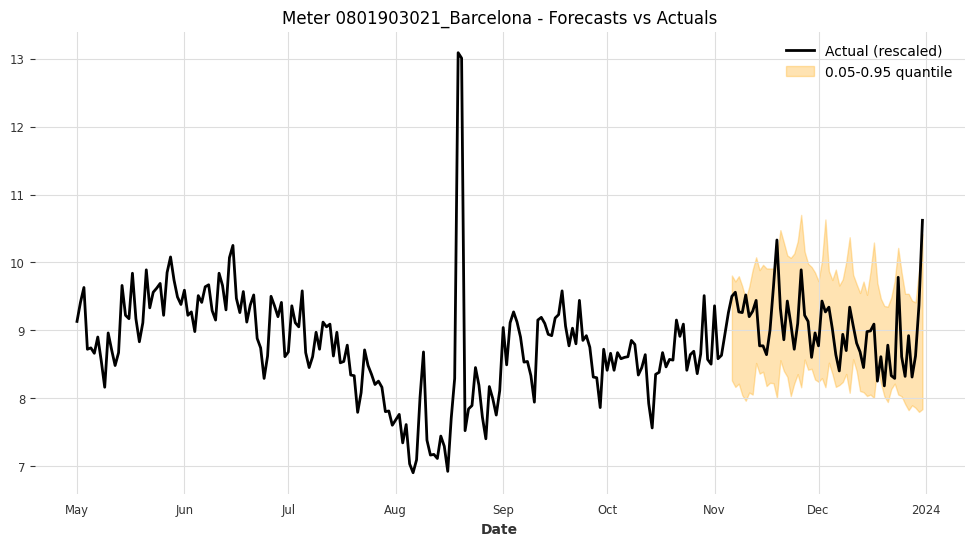

Meter 0801903021_Barcelona - Coverage: 0.9286, Width: 1.6909



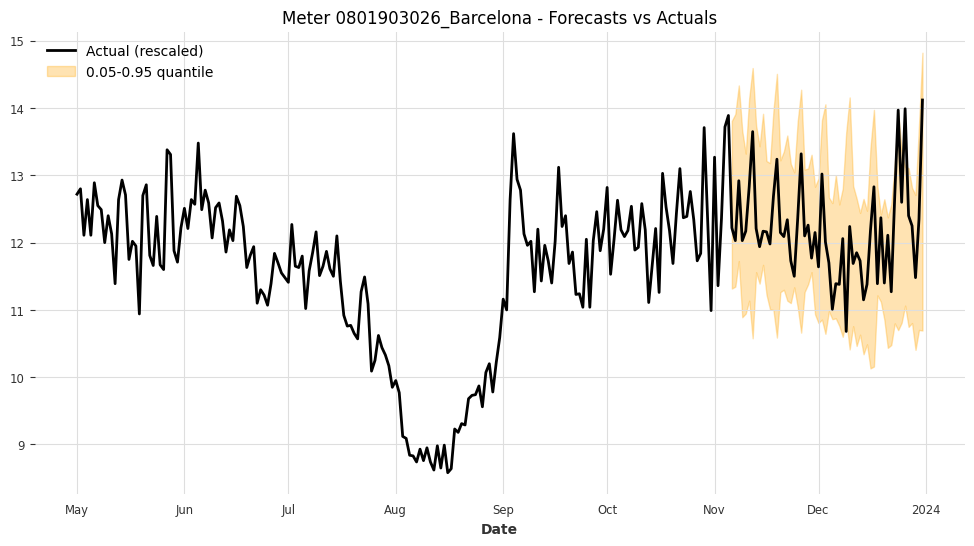

Meter 0801903026_Barcelona - Coverage: 0.9464, Width: 2.4293



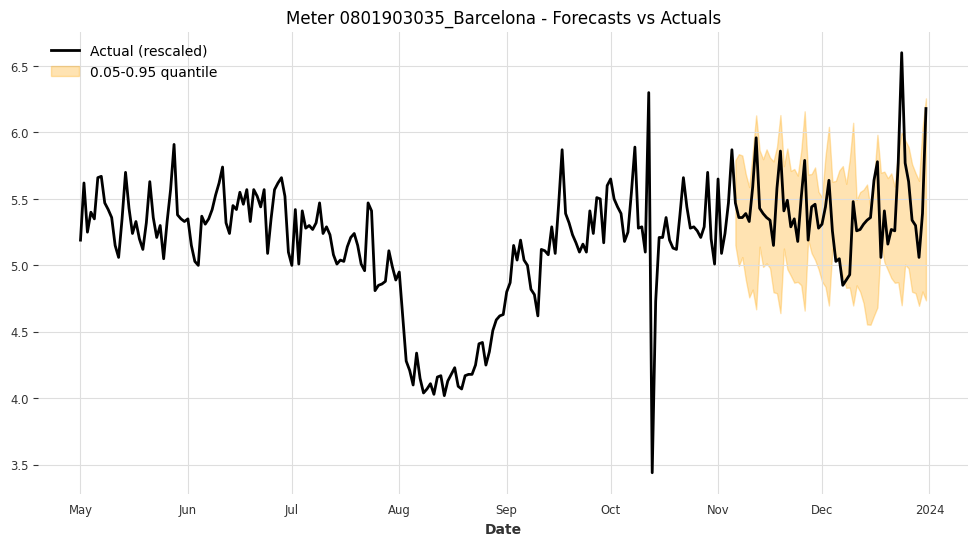

Meter 0801903035_Barcelona - Coverage: 0.8929, Width: 0.8974



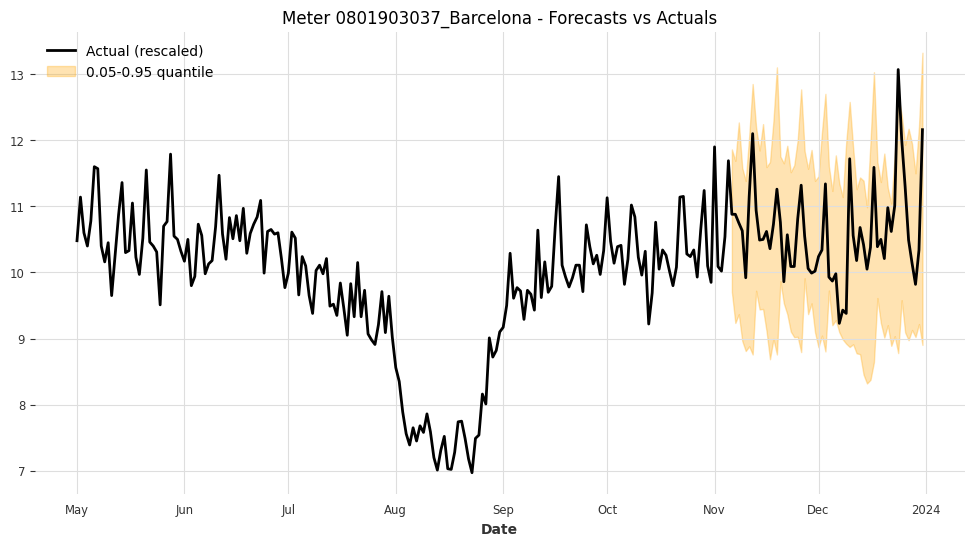

Meter 0801903037_Barcelona - Coverage: 0.9821, Width: 2.7895



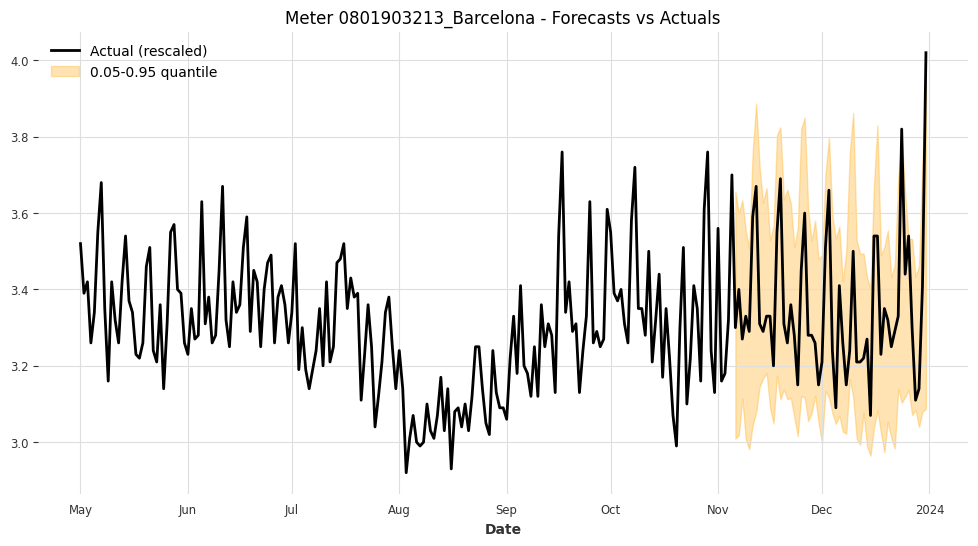

Meter 0801903213_Barcelona - Coverage: 0.9464, Width: 0.5446



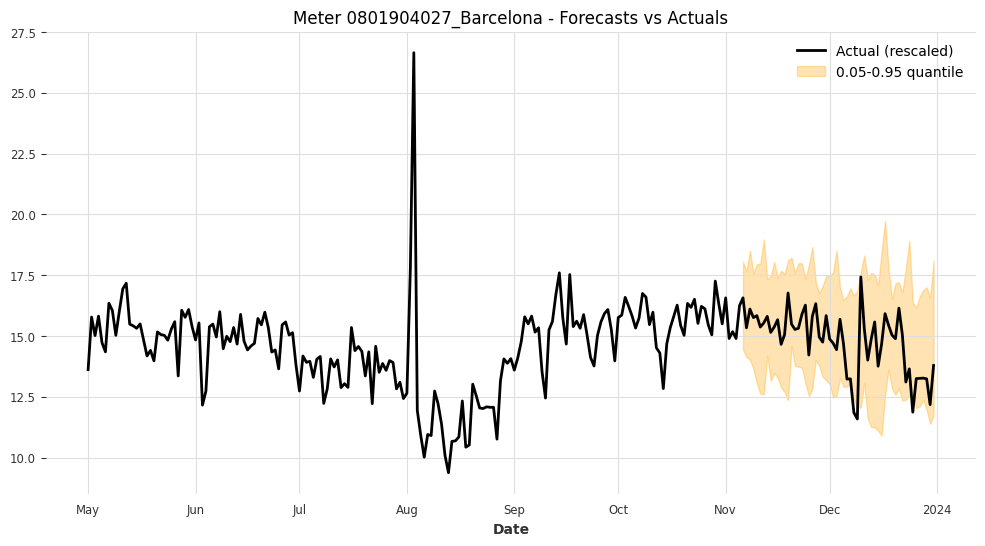

Meter 0801904027_Barcelona - Coverage: 0.9464, Width: 4.7387



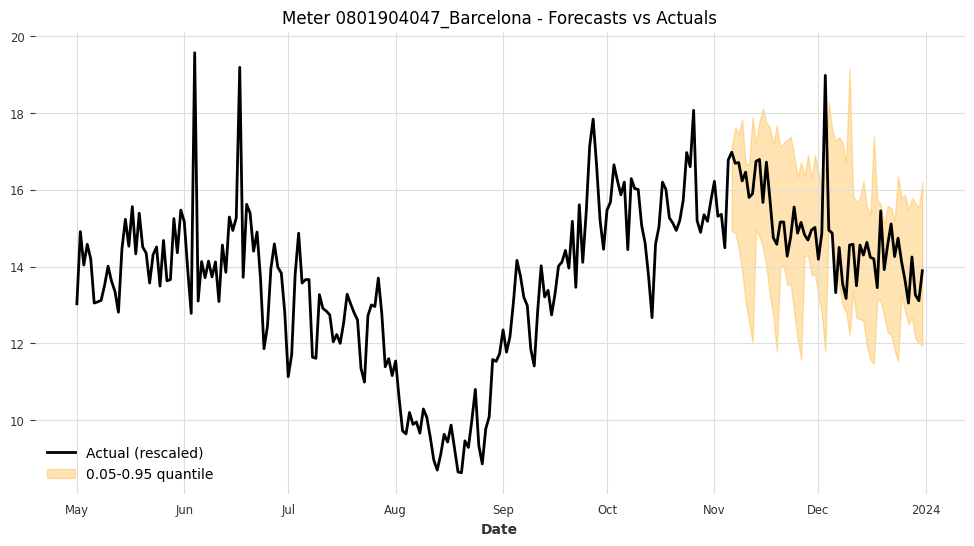

Meter 0801904047_Barcelona - Coverage: 0.9464, Width: 3.5869



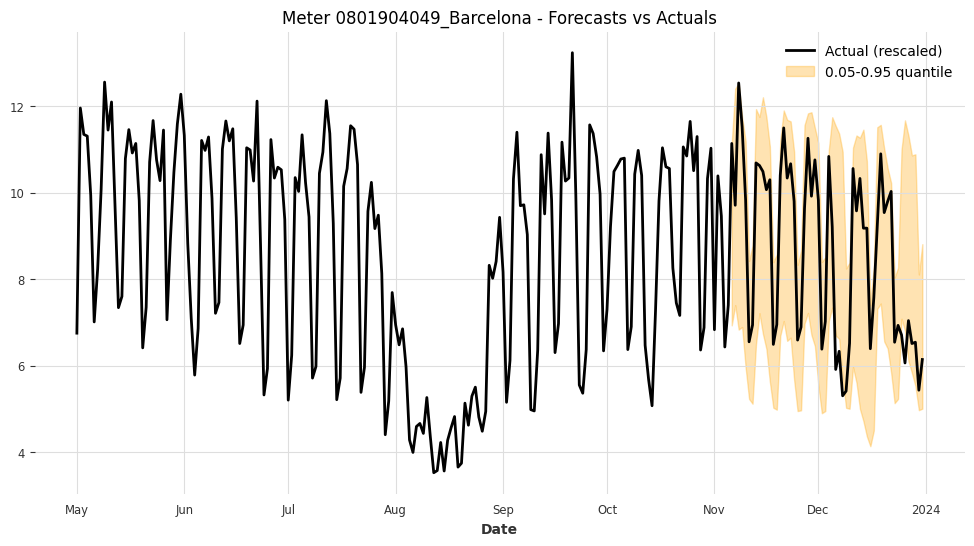

Meter 0801904049_Barcelona - Coverage: 0.9107, Width: 4.5491



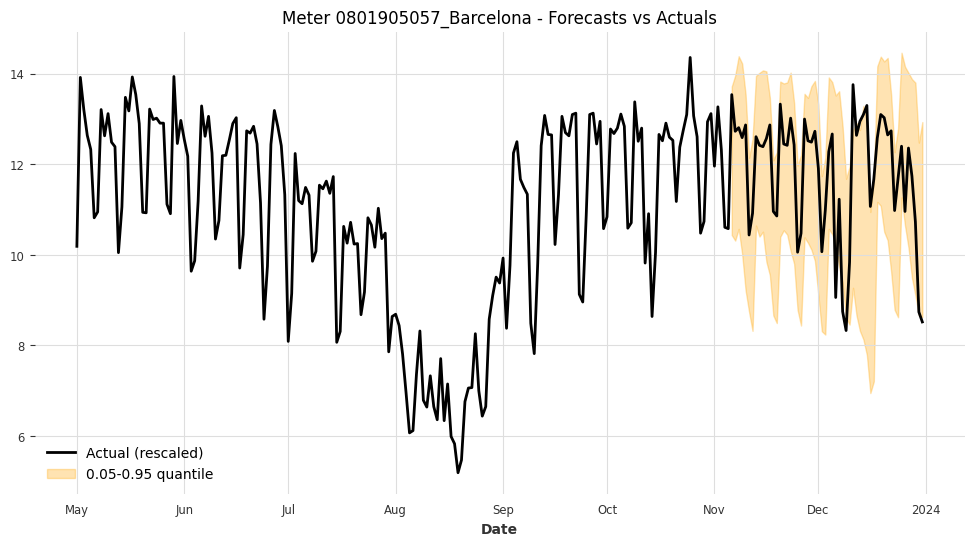

Meter 0801905057_Barcelona - Coverage: 0.8393, Width: 3.7656



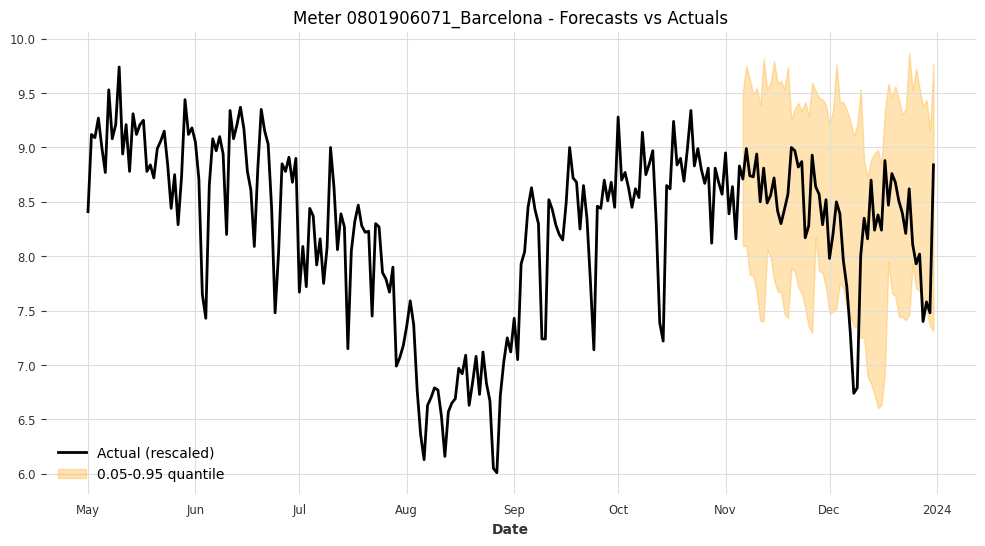

Meter 0801906071_Barcelona - Coverage: 0.9286, Width: 1.8797



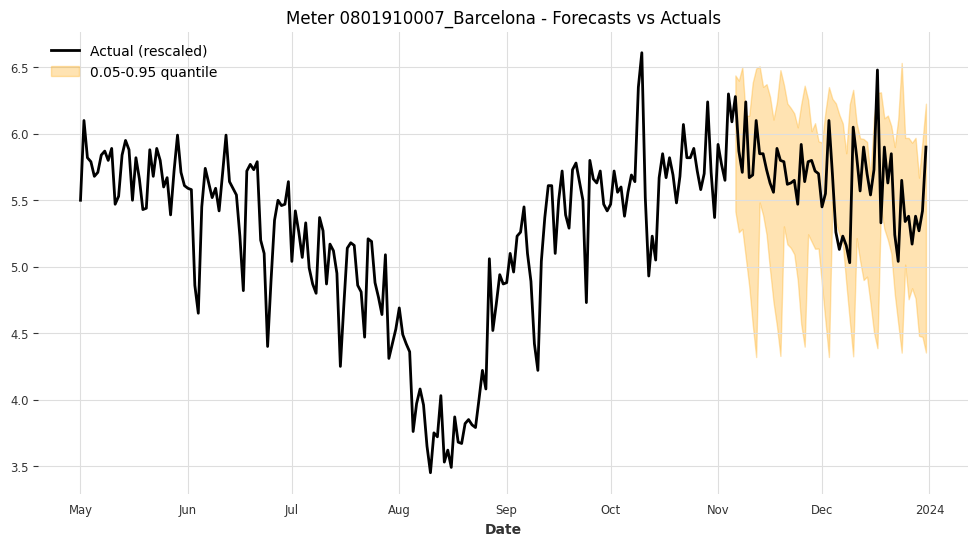

Meter 0801910007_Barcelona - Coverage: 0.9107, Width: 1.2590



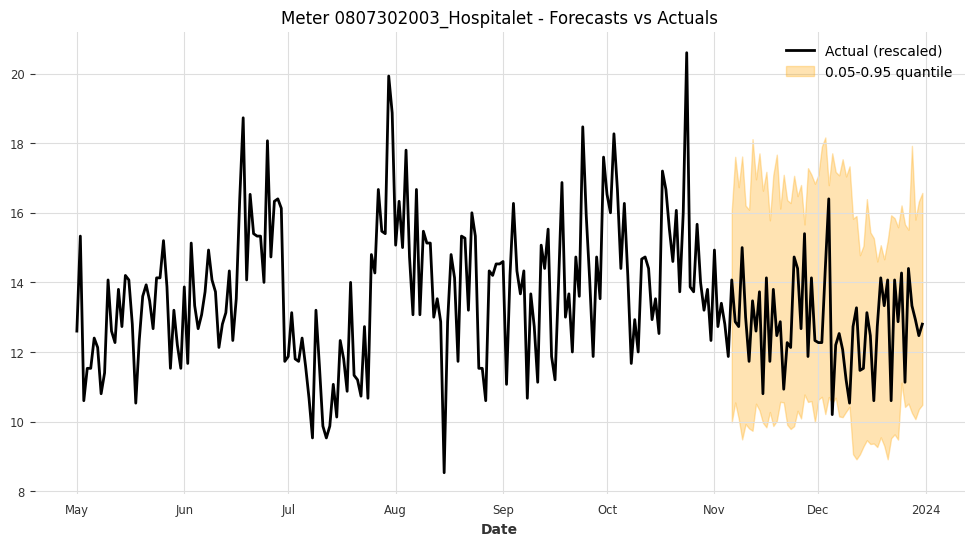

Meter 0807302003_Hospitalet - Coverage: 0.9821, Width: 6.4772



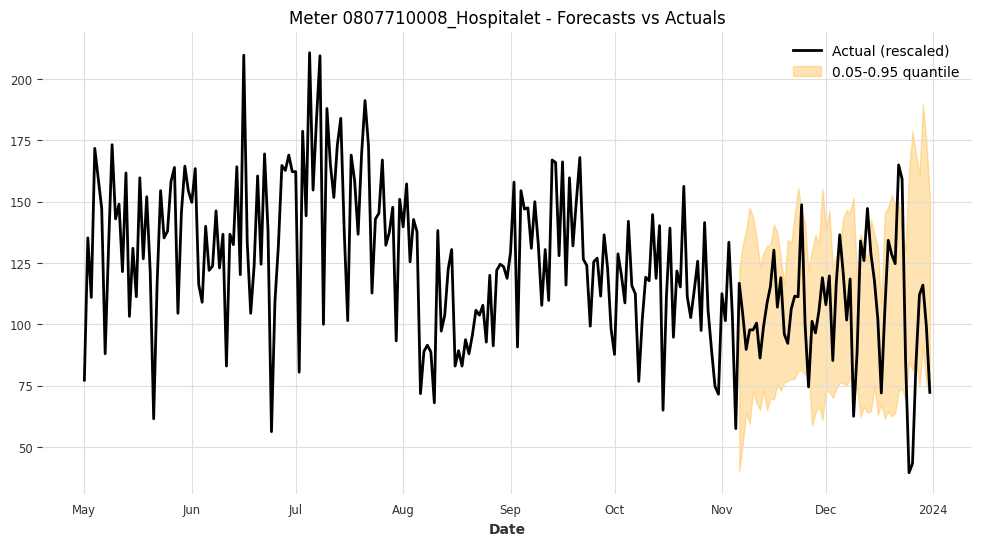

Meter 0807710008_Hospitalet - Coverage: 0.8214, Width: 69.8672



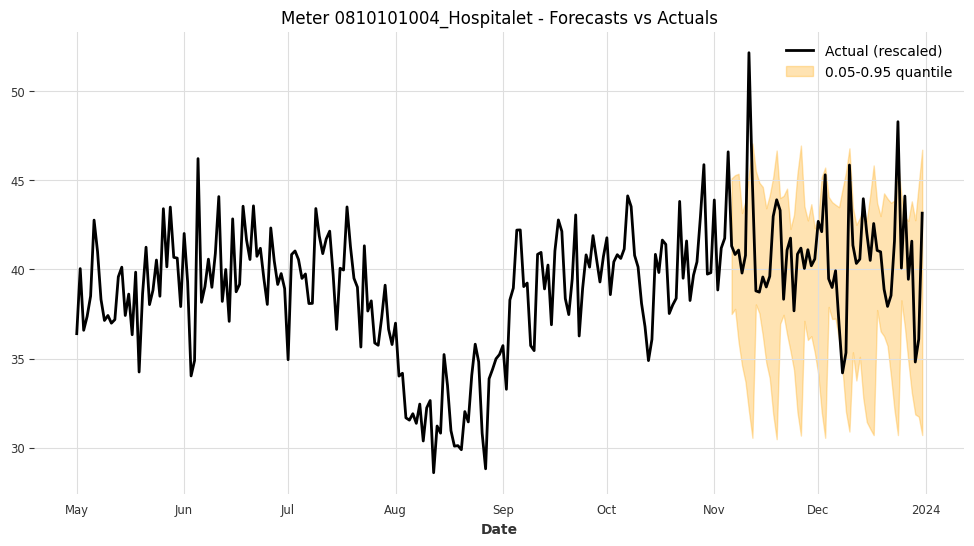

Meter 0810101004_Hospitalet - Coverage: 0.9107, Width: 9.8761



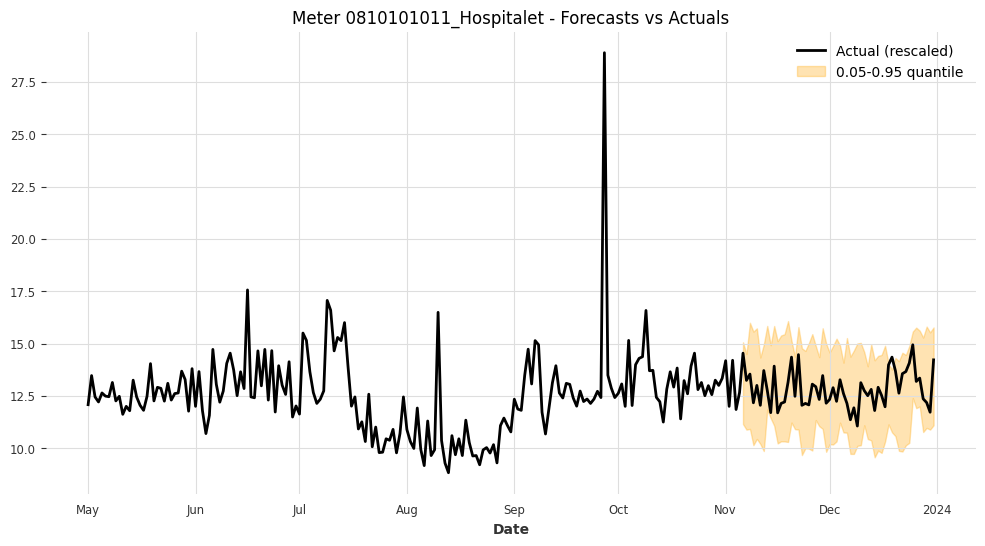

Meter 0810101011_Hospitalet - Coverage: 0.9821, Width: 4.4060



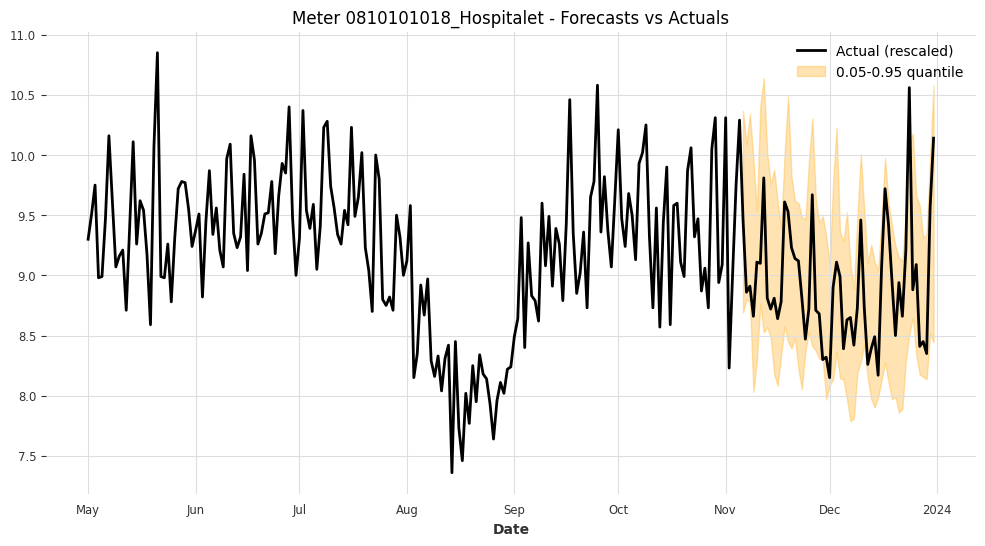

Meter 0810101018_Hospitalet - Coverage: 0.9643, Width: 1.4089



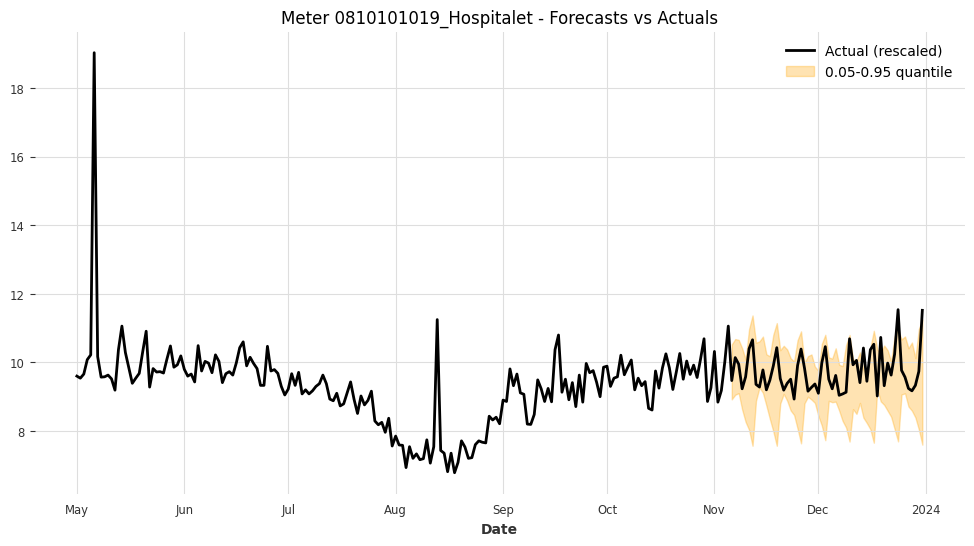

Meter 0810101019_Hospitalet - Coverage: 0.8929, Width: 1.9436



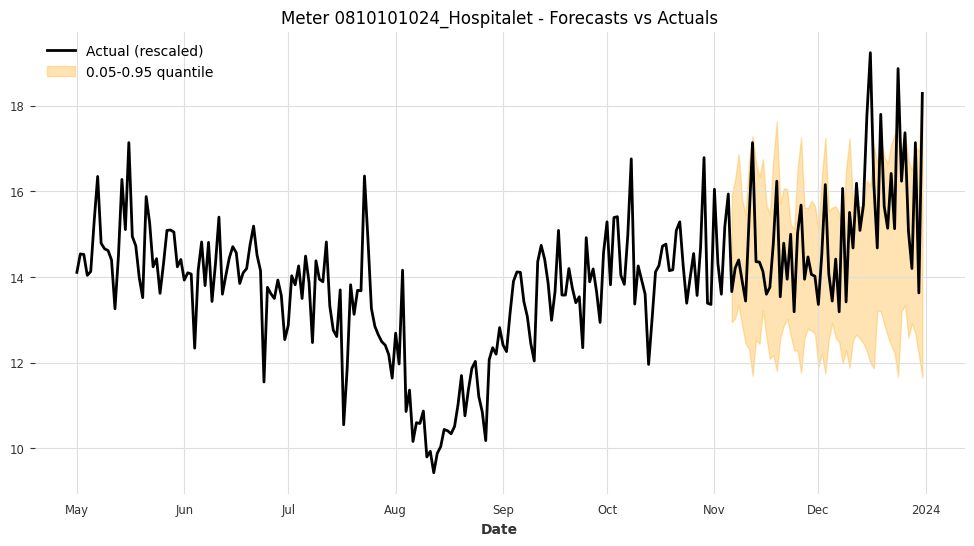

Meter 0810101024_Hospitalet - Coverage: 0.8393, Width: 3.8514



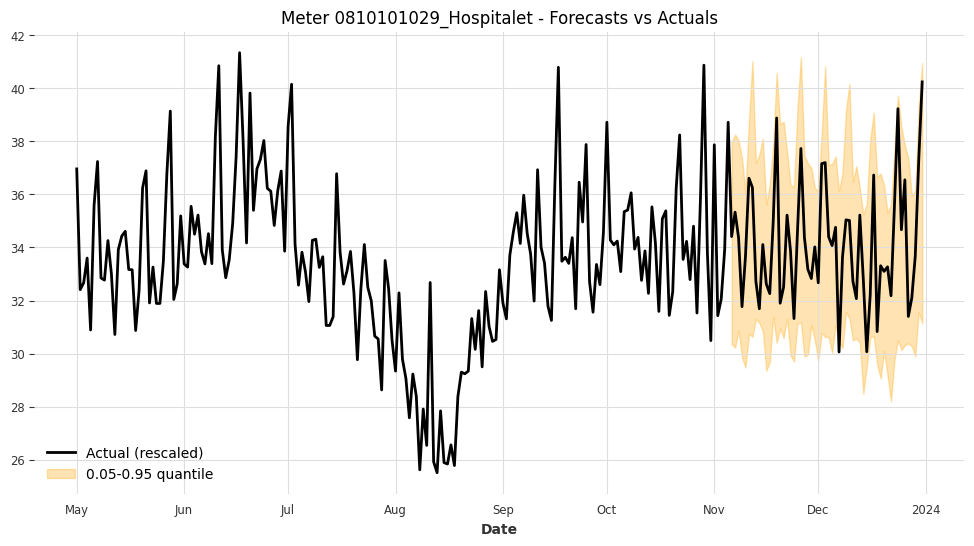

Meter 0810101029_Hospitalet - Coverage: 0.9821, Width: 7.2875



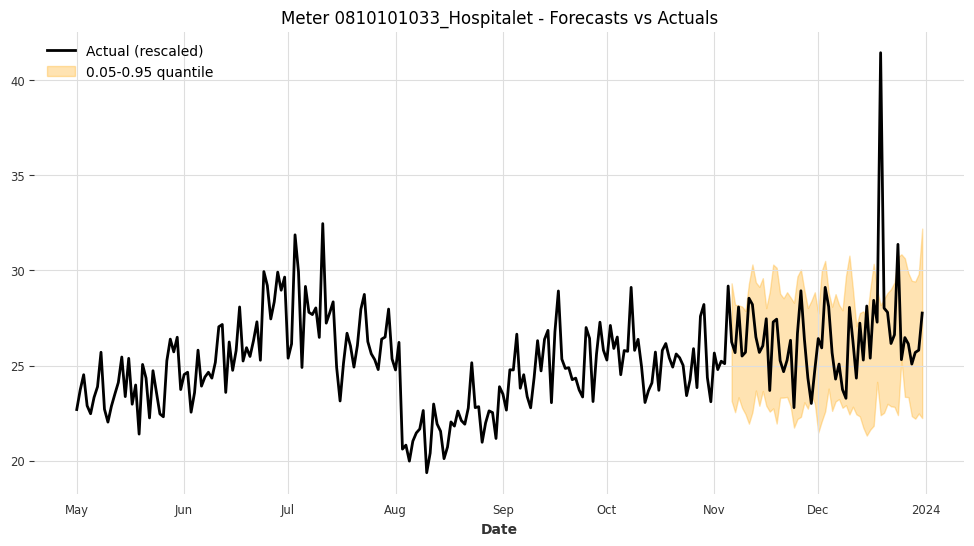

Meter 0810101033_Hospitalet - Coverage: 0.9107, Width: 6.3462



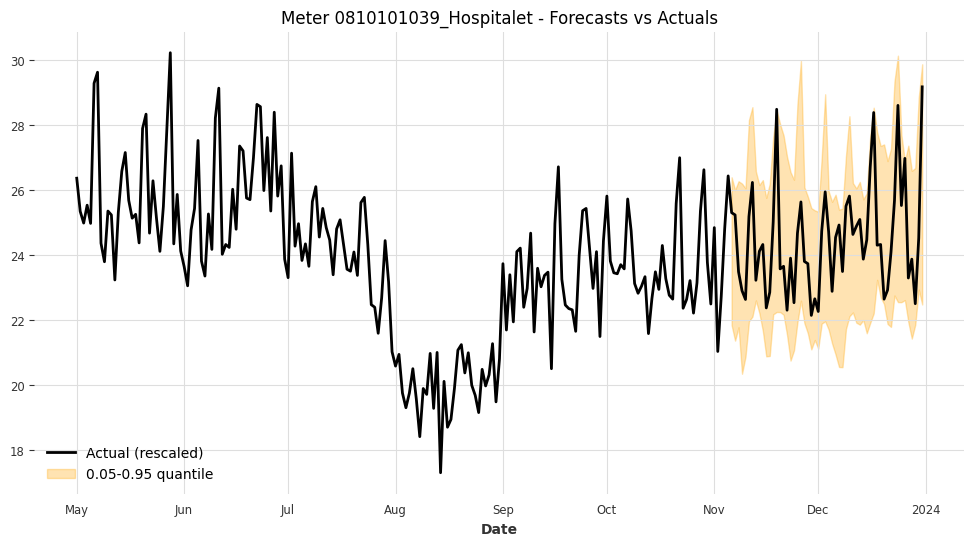

Meter 0810101039_Hospitalet - Coverage: 0.9643, Width: 5.1933



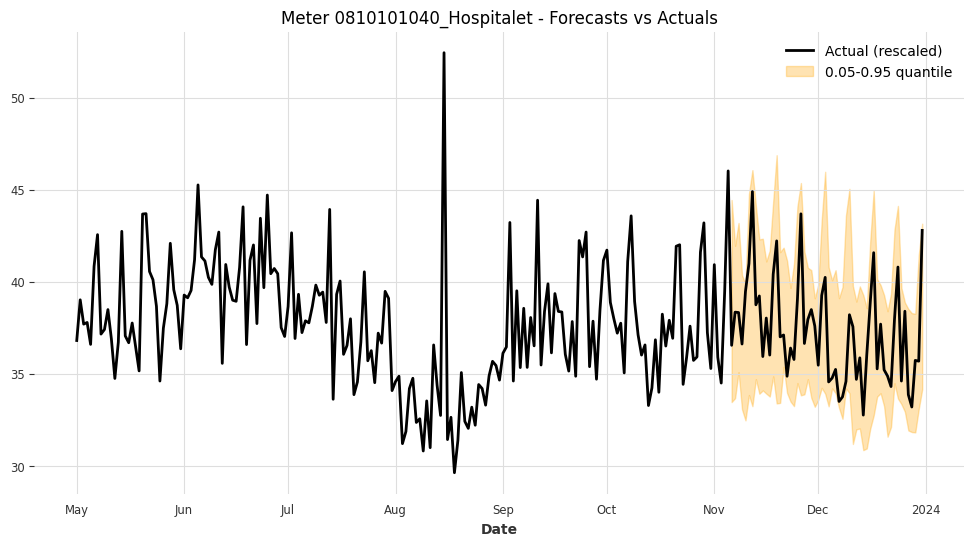

Meter 0810101040_Hospitalet - Coverage: 1.0000, Width: 8.1494



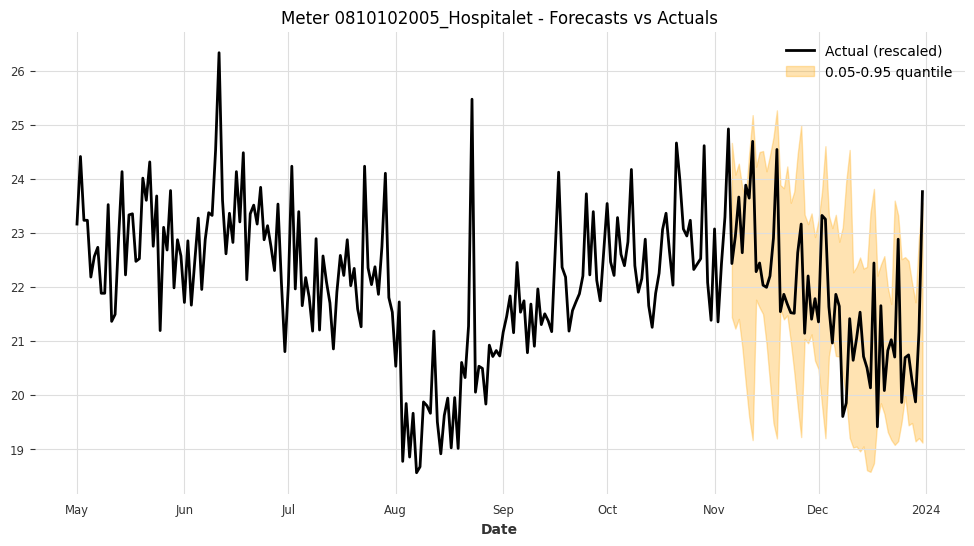

Meter 0810102005_Hospitalet - Coverage: 0.8750, Width: 3.4045



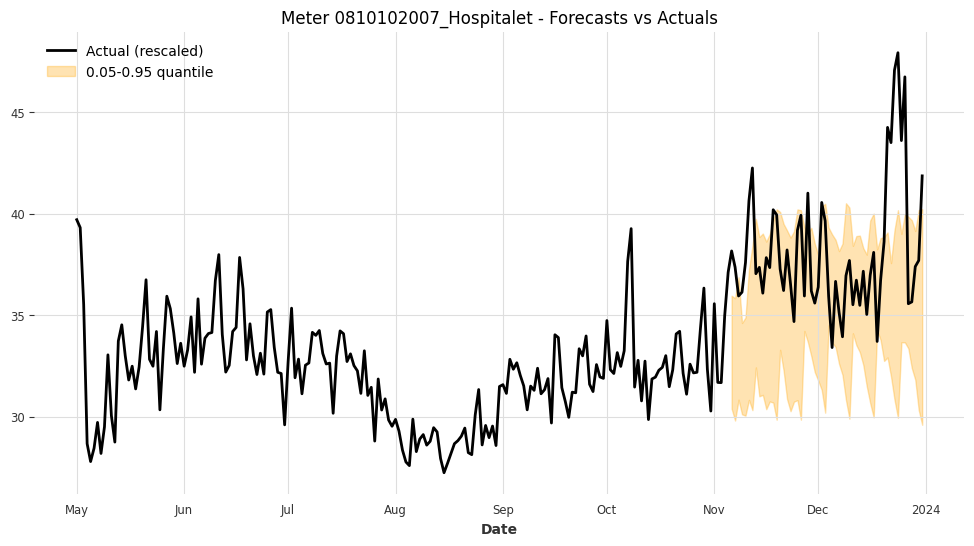

Meter 0810102007_Hospitalet - Coverage: 0.6786, Width: 7.1602



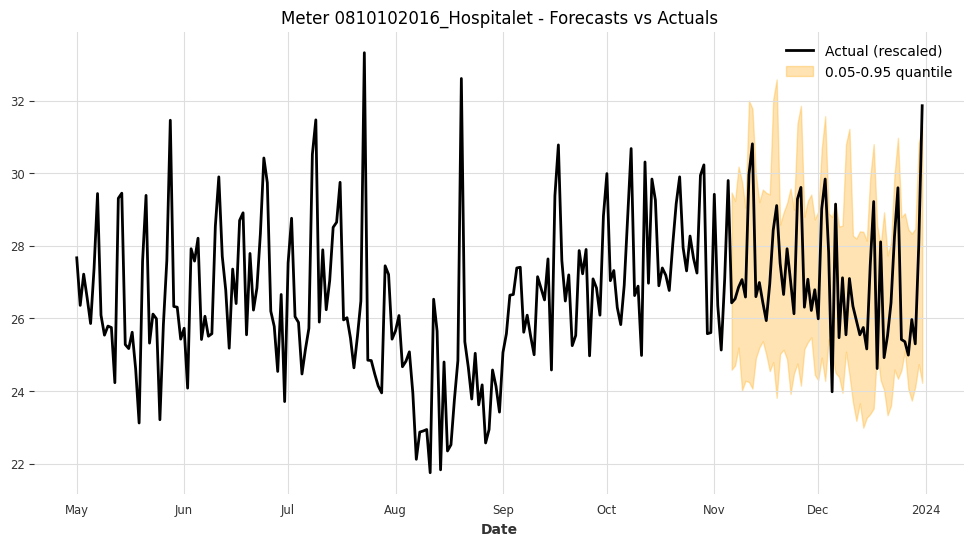

Meter 0810102016_Hospitalet - Coverage: 0.9286, Width: 5.1360



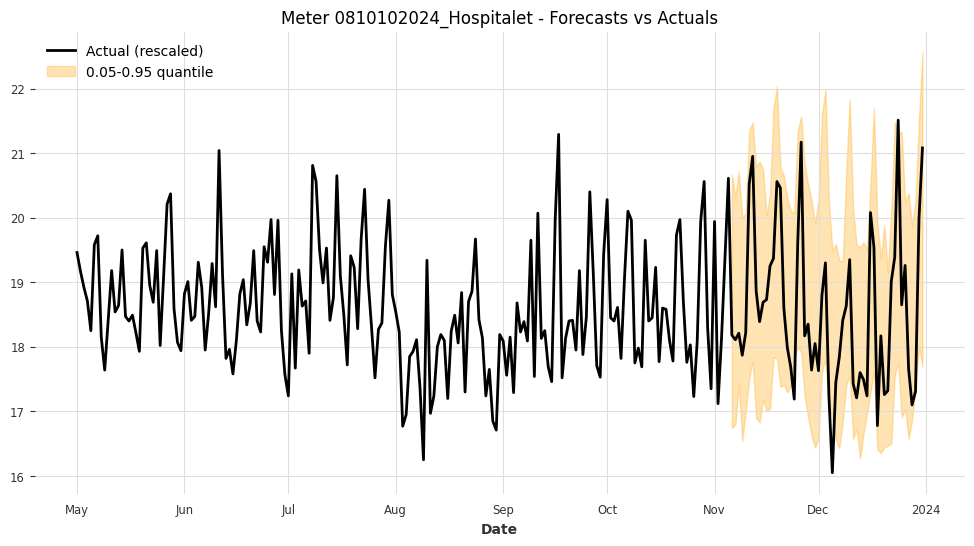

Meter 0810102024_Hospitalet - Coverage: 0.9286, Width: 3.4319



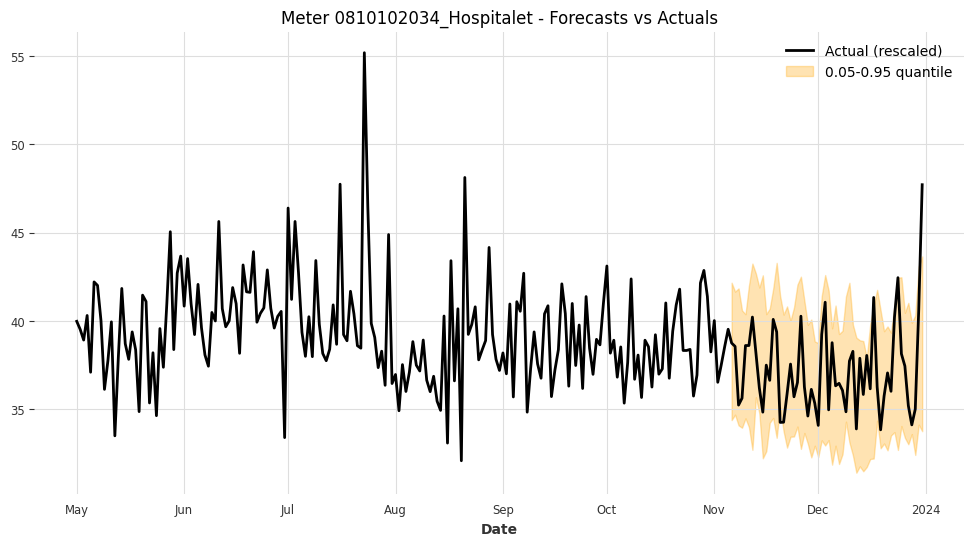

Meter 0810102034_Hospitalet - Coverage: 0.9107, Width: 7.6524



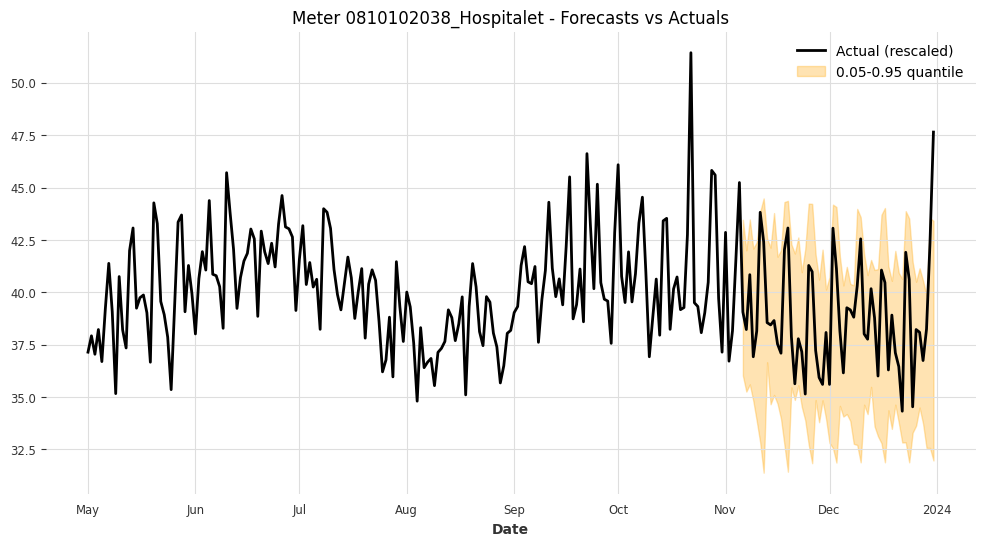

Meter 0810102038_Hospitalet - Coverage: 0.9821, Width: 8.4806



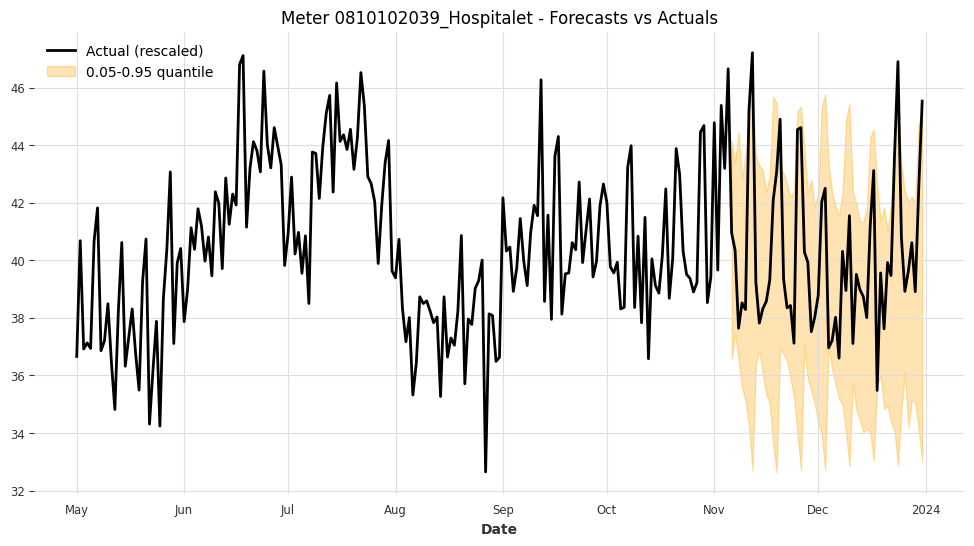

Meter 0810102039_Hospitalet - Coverage: 0.8929, Width: 8.3187



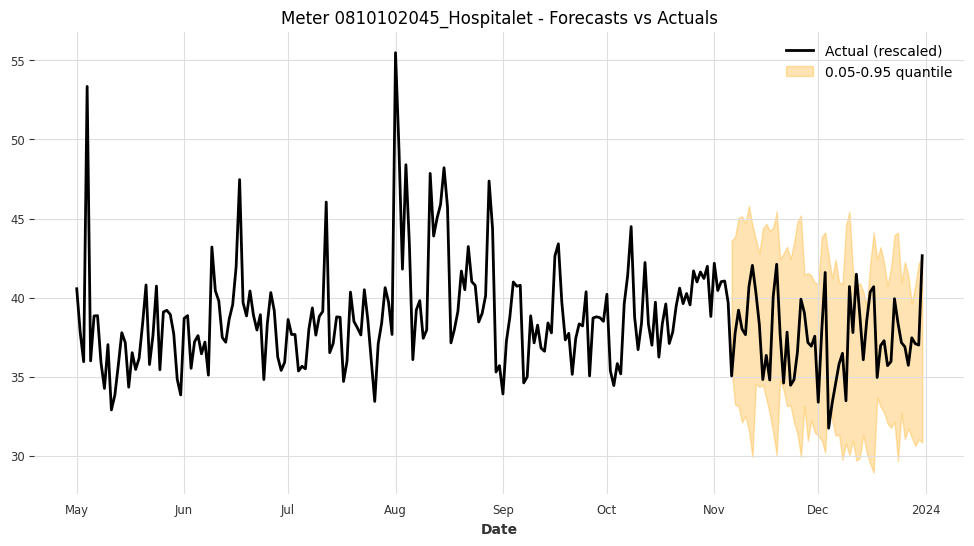

Meter 0810102045_Hospitalet - Coverage: 0.9286, Width: 10.9675



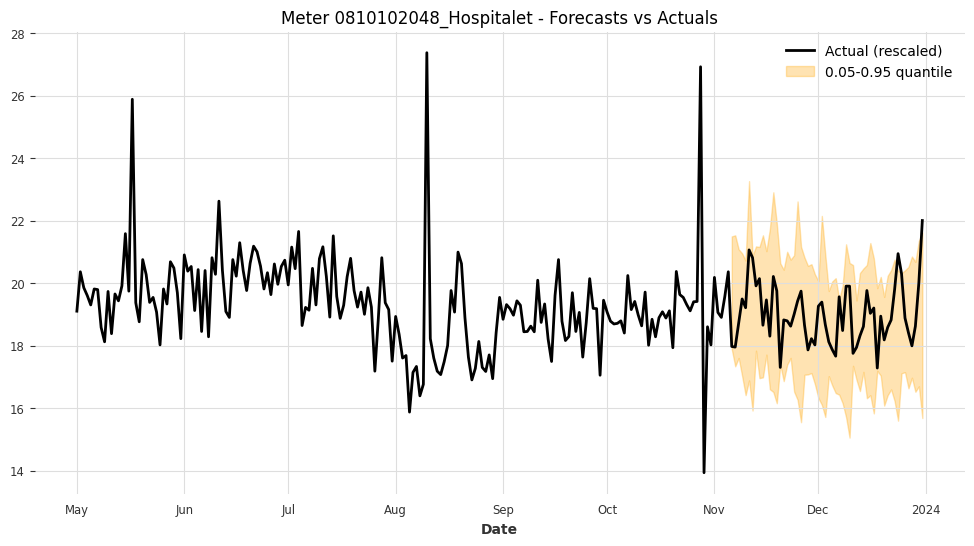

Meter 0810102048_Hospitalet - Coverage: 0.9286, Width: 4.1500



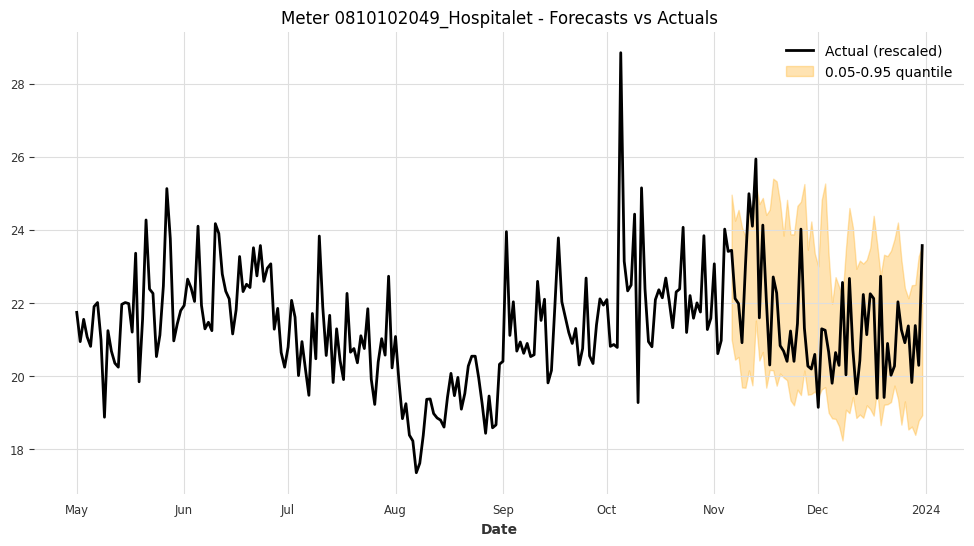

Meter 0810102049_Hospitalet - Coverage: 0.8929, Width: 4.3656



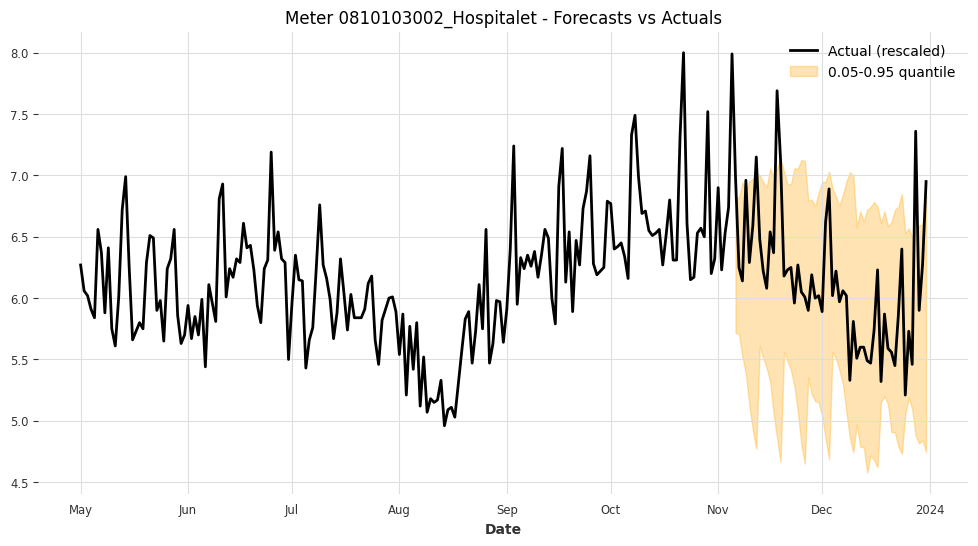

Meter 0810103002_Hospitalet - Coverage: 0.8929, Width: 1.7624



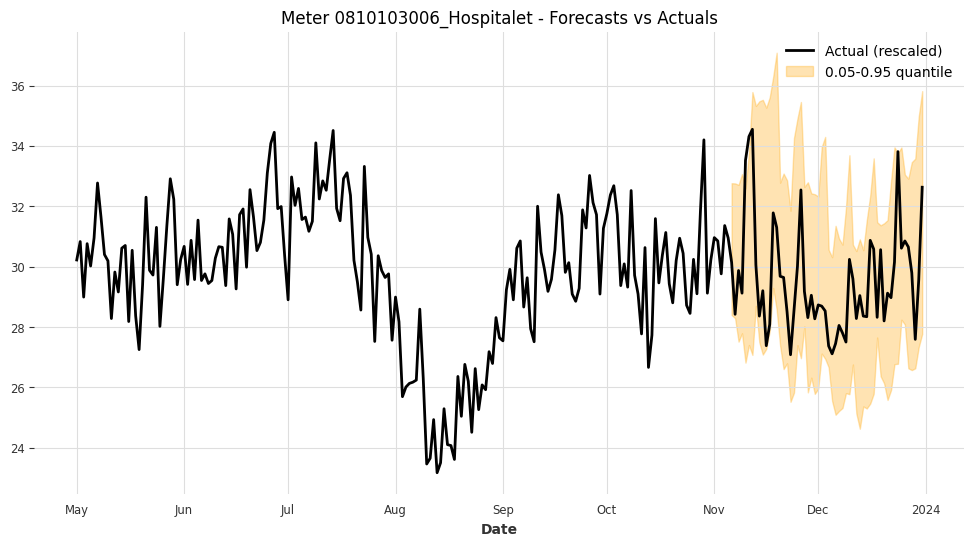

Meter 0810103006_Hospitalet - Coverage: 0.9464, Width: 6.3843



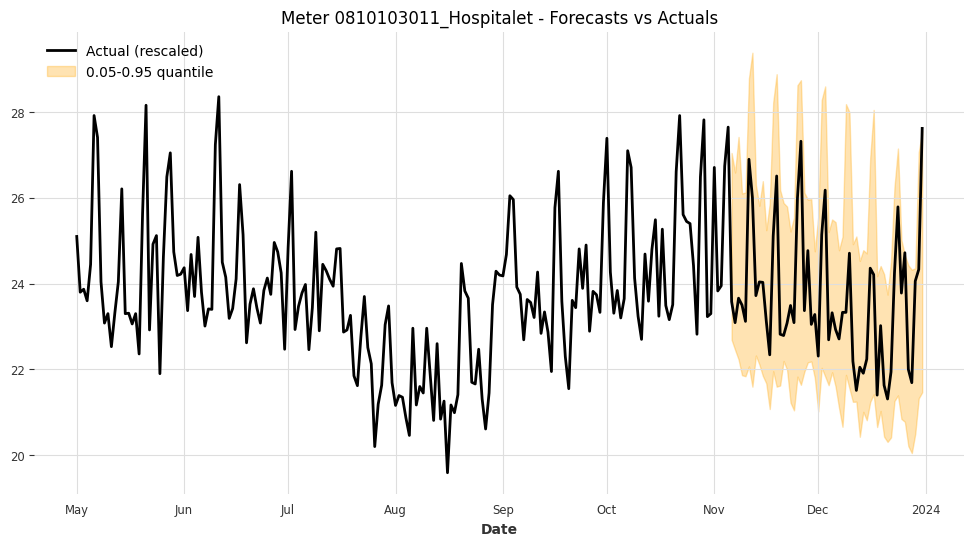

Meter 0810103011_Hospitalet - Coverage: 0.9643, Width: 4.6820



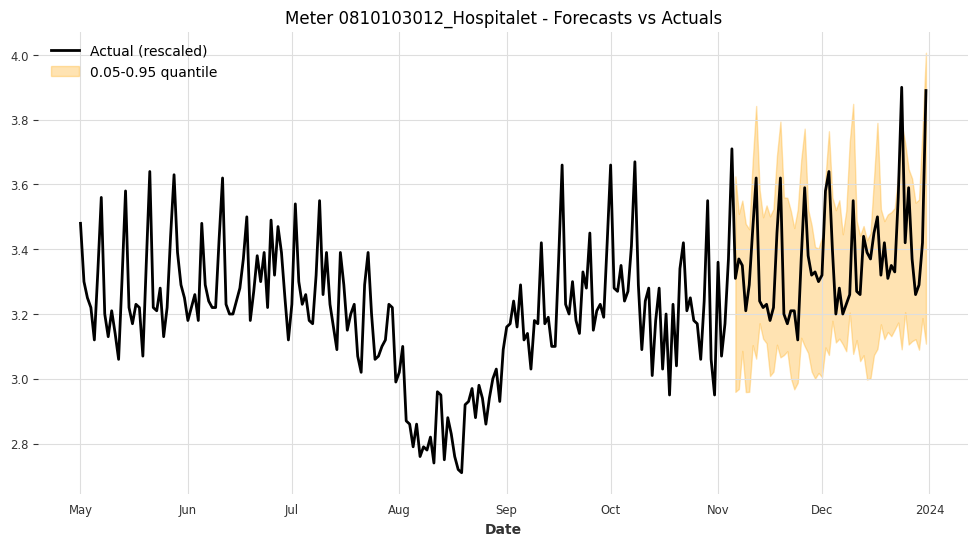

Meter 0810103012_Hospitalet - Coverage: 0.9821, Width: 0.5019



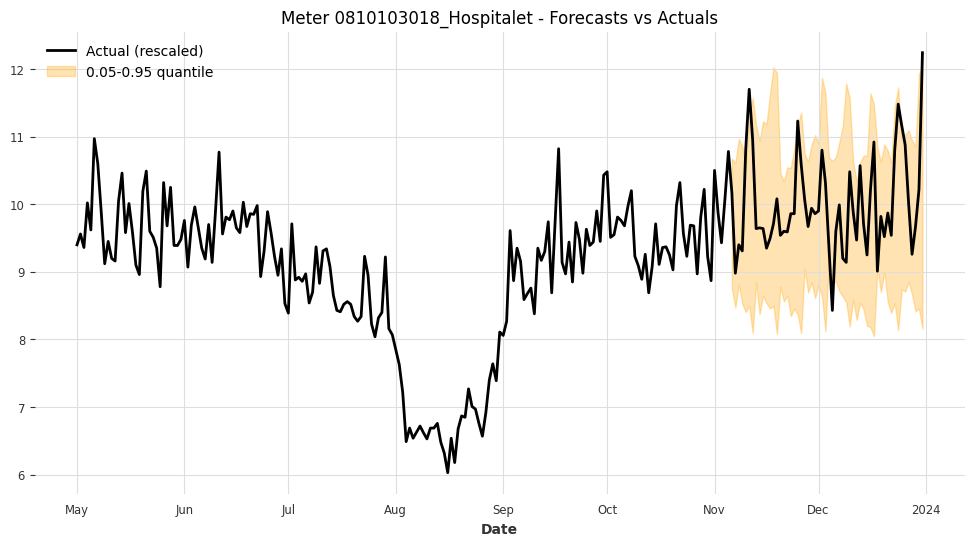

Meter 0810103018_Hospitalet - Coverage: 0.8750, Width: 2.5035



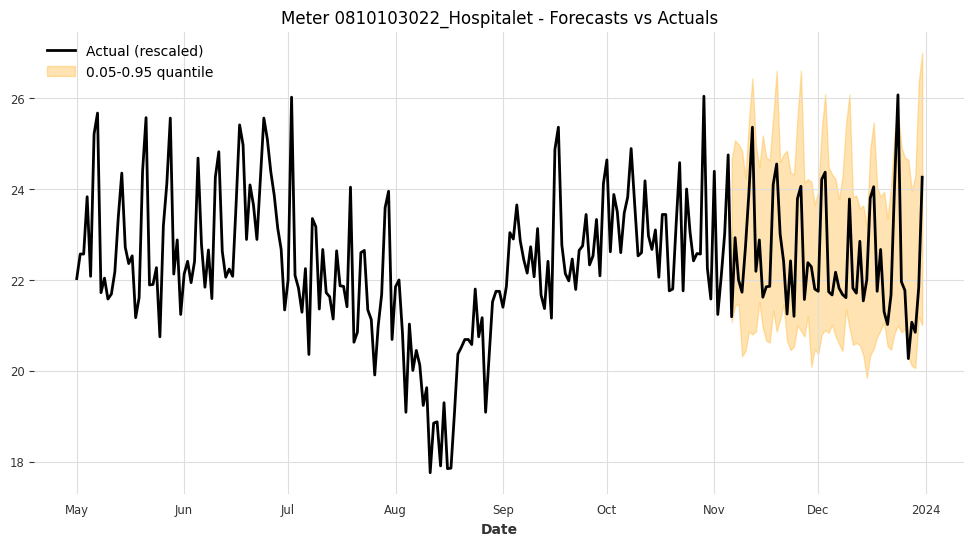

Meter 0810103022_Hospitalet - Coverage: 0.9643, Width: 3.9774



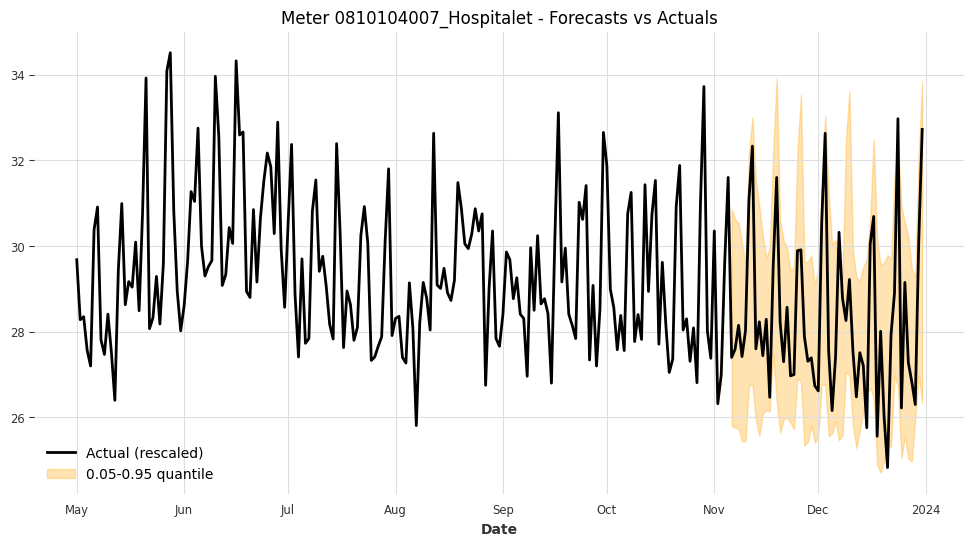

Meter 0810104007_Hospitalet - Coverage: 0.9286, Width: 4.7444



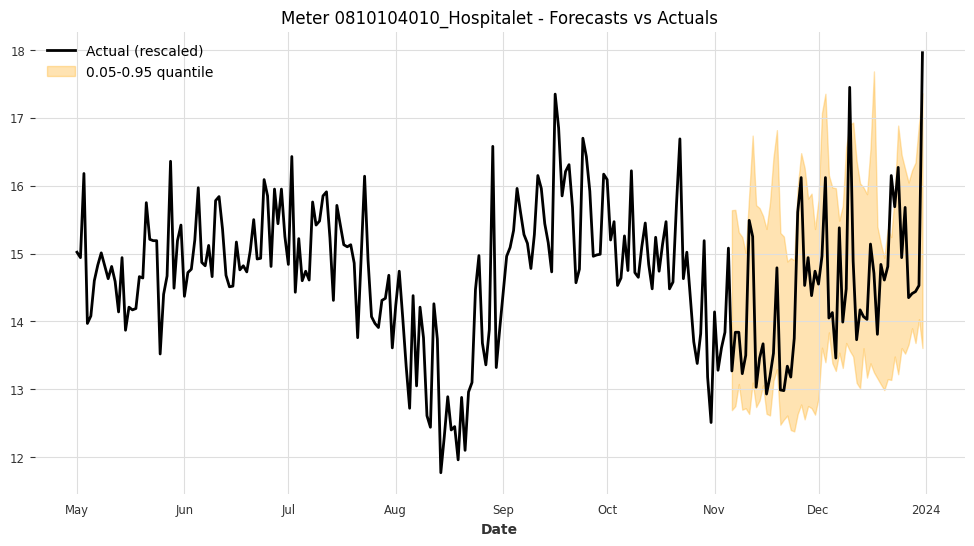

Meter 0810104010_Hospitalet - Coverage: 0.9464, Width: 2.8642



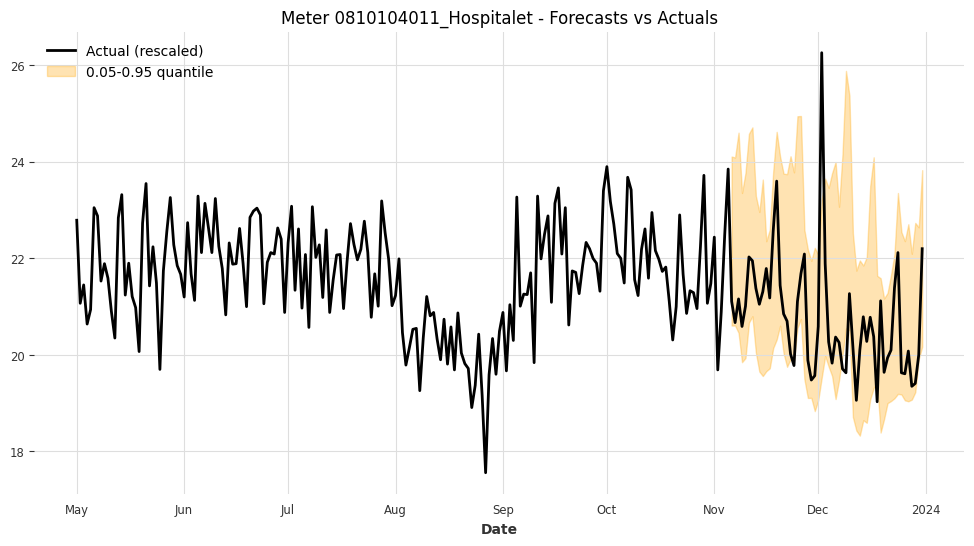

Meter 0810104011_Hospitalet - Coverage: 0.9107, Width: 3.6008



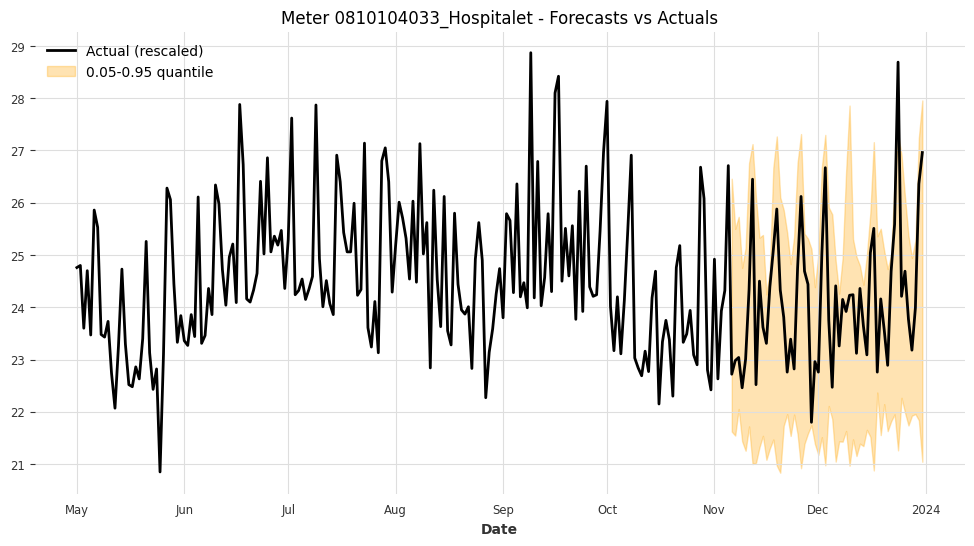

Meter 0810104033_Hospitalet - Coverage: 0.9821, Width: 4.2469



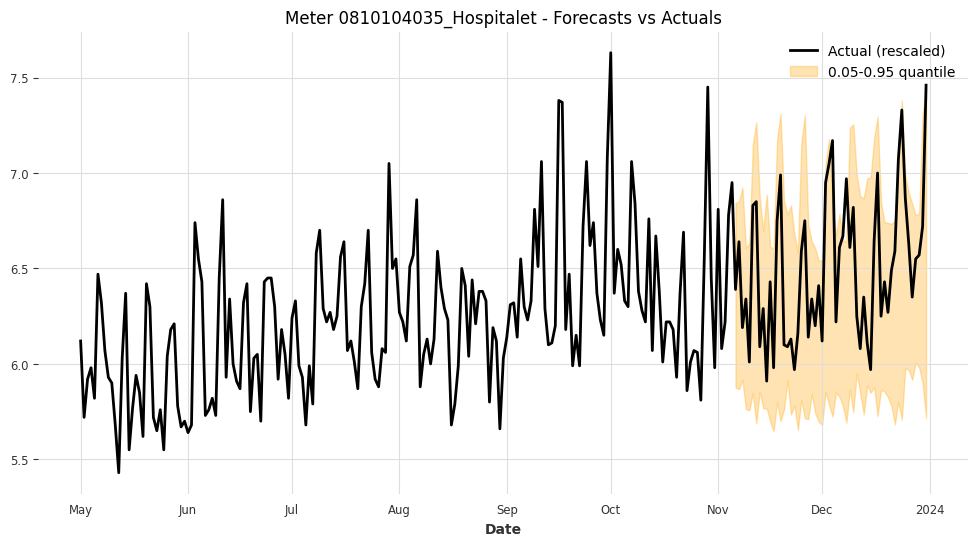

Meter 0810104035_Hospitalet - Coverage: 0.9286, Width: 1.0986



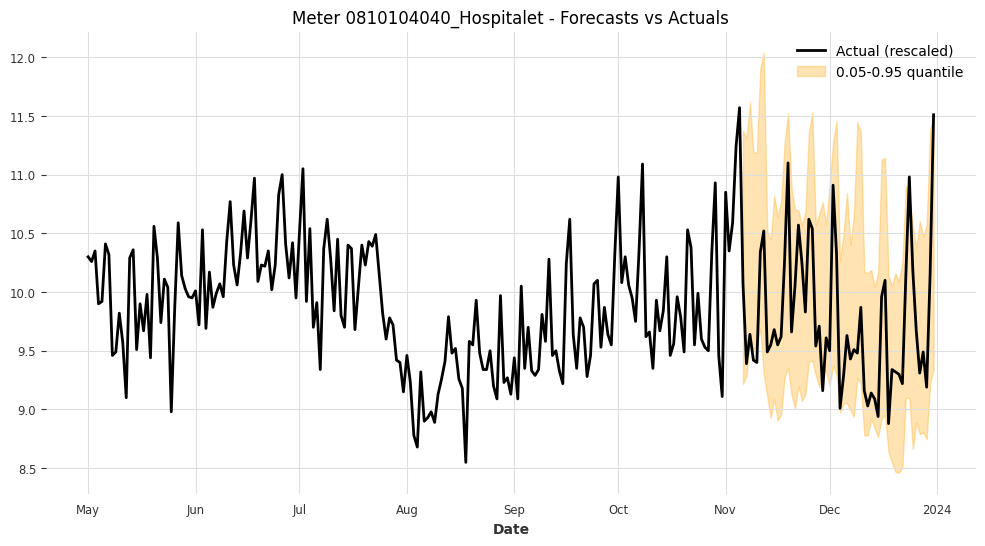

Meter 0810104040_Hospitalet - Coverage: 0.9107, Width: 1.7452



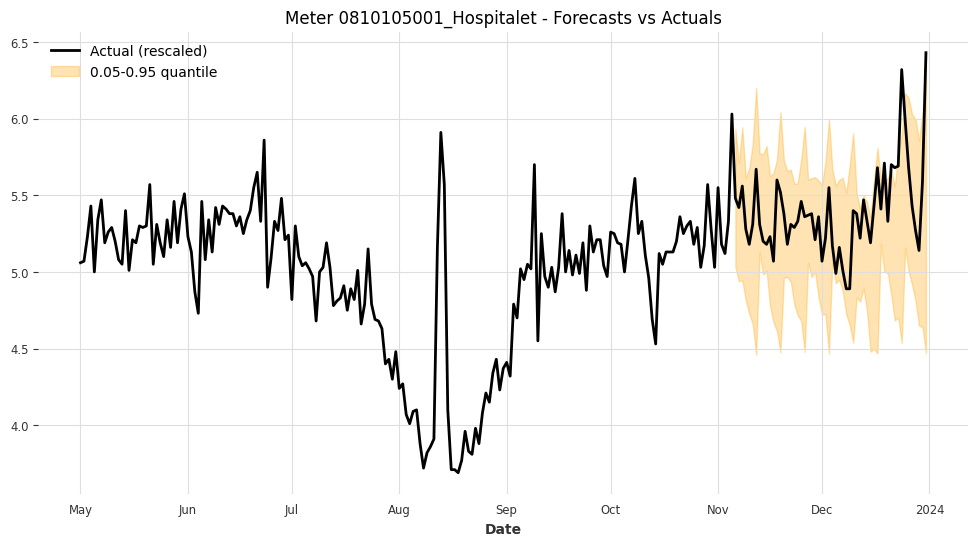

Meter 0810105001_Hospitalet - Coverage: 0.9107, Width: 0.9424



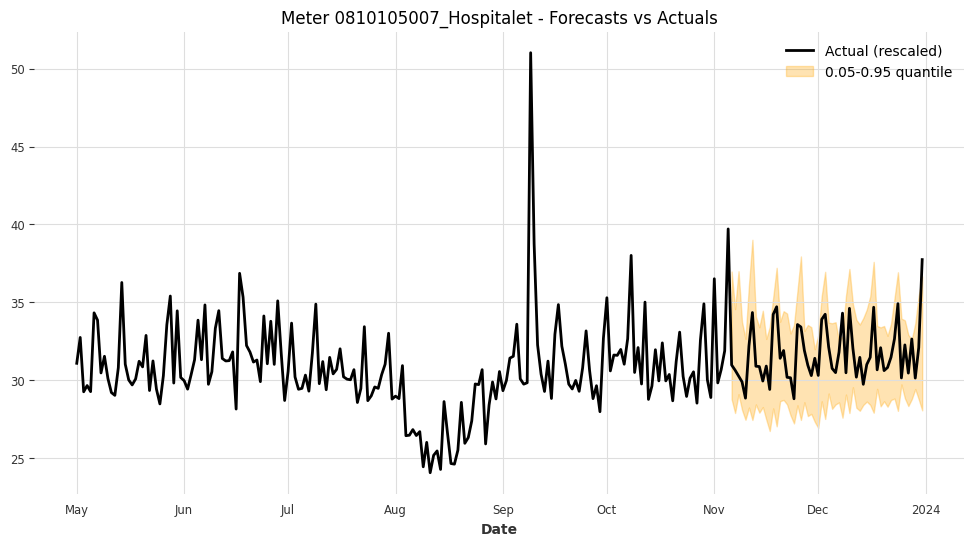

Meter 0810105007_Hospitalet - Coverage: 0.9464, Width: 6.2322



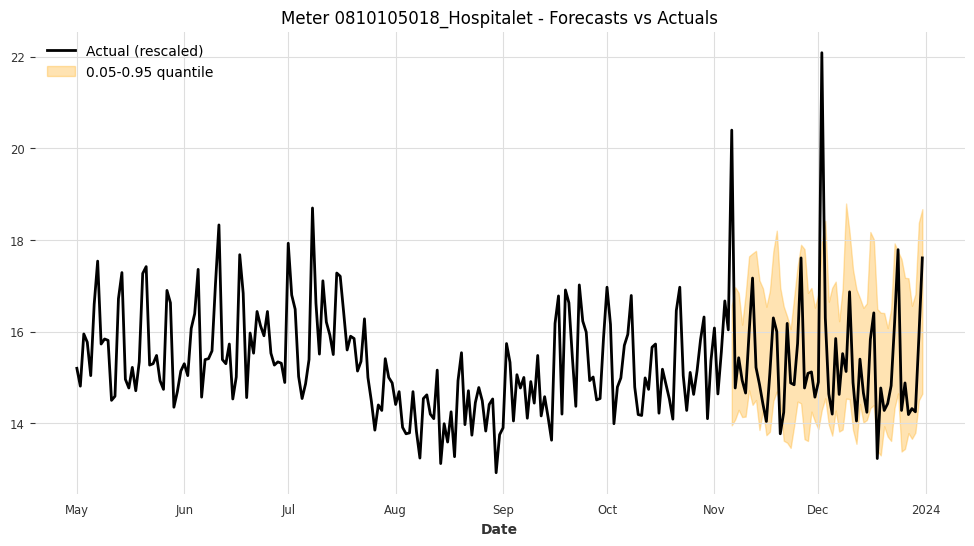

Meter 0810105018_Hospitalet - Coverage: 0.9107, Width: 3.0982



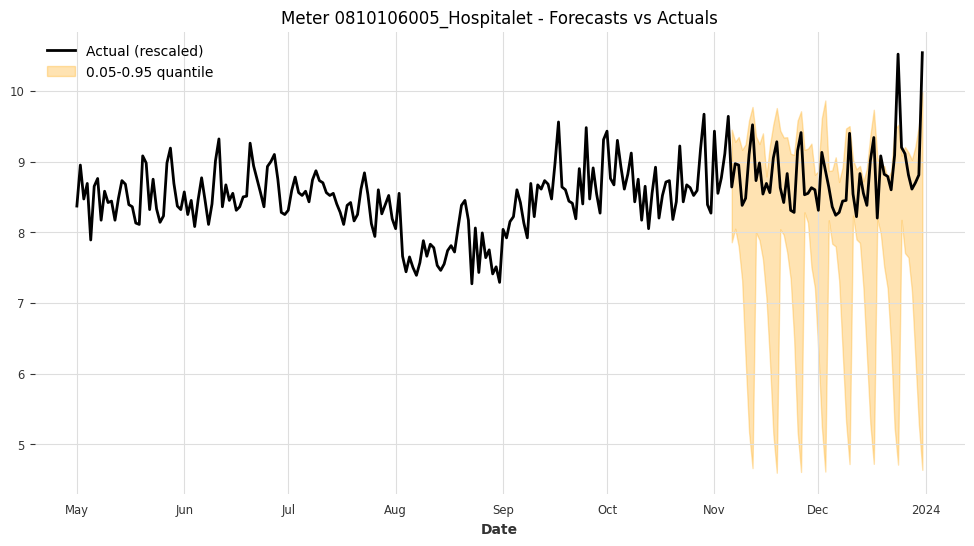

Meter 0810106005_Hospitalet - Coverage: 0.9107, Width: 2.4991



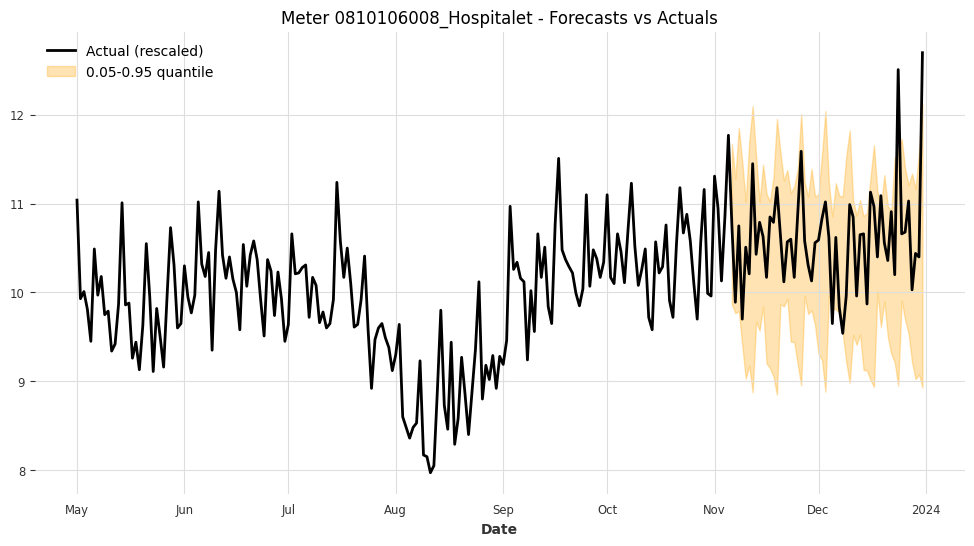

Meter 0810106008_Hospitalet - Coverage: 0.9107, Width: 1.9135



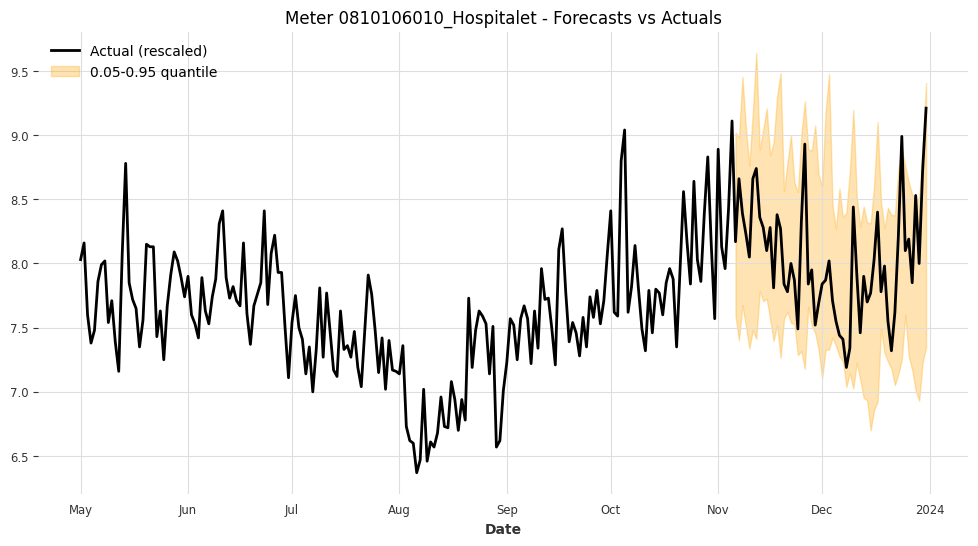

Meter 0810106010_Hospitalet - Coverage: 0.9643, Width: 1.4861



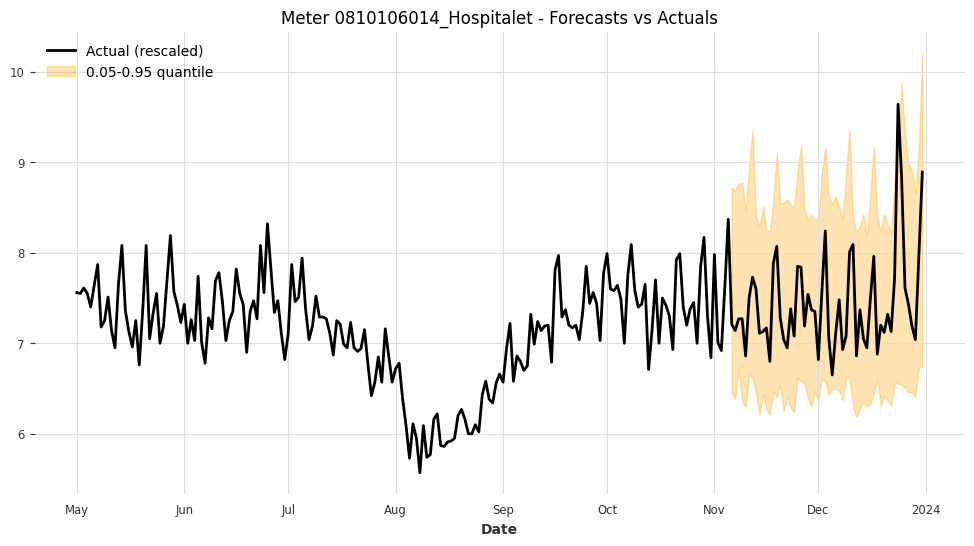

Meter 0810106014_Hospitalet - Coverage: 0.9821, Width: 2.2491



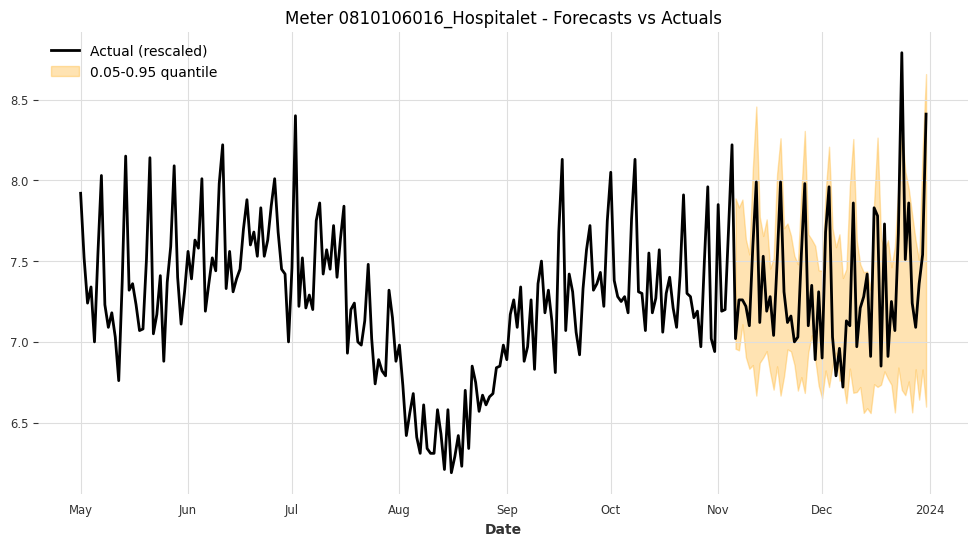

Meter 0810106016_Hospitalet - Coverage: 0.9107, Width: 0.9960



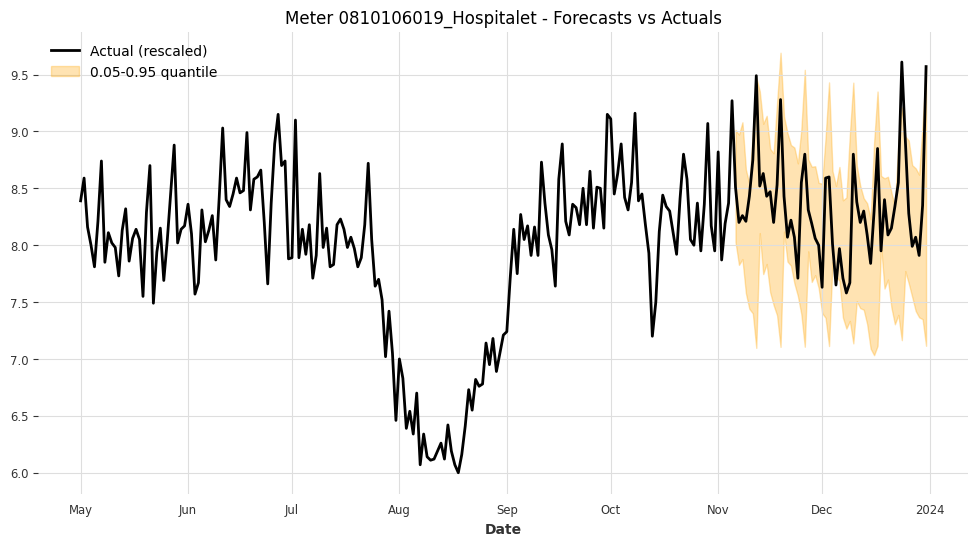

Meter 0810106019_Hospitalet - Coverage: 0.9107, Width: 1.3463



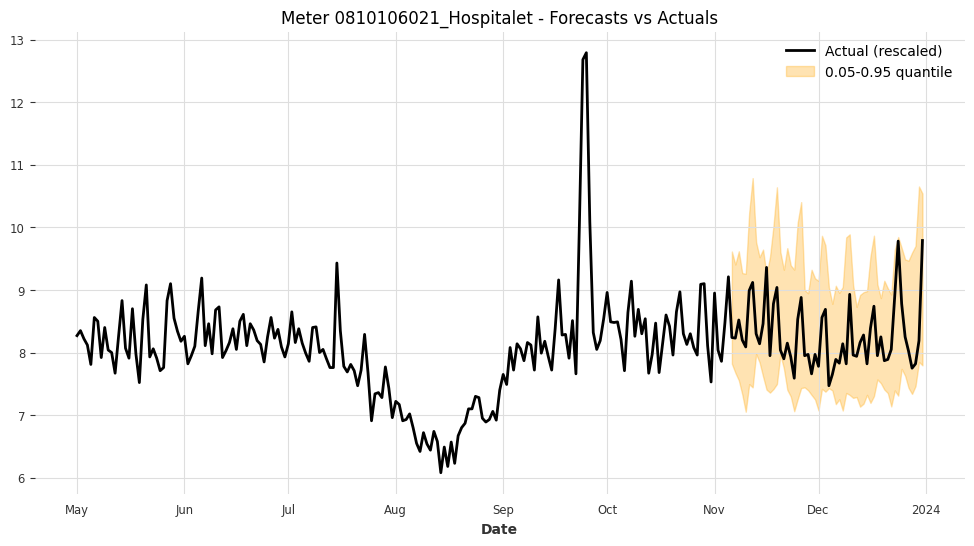

Meter 0810106021_Hospitalet - Coverage: 0.9821, Width: 2.0764



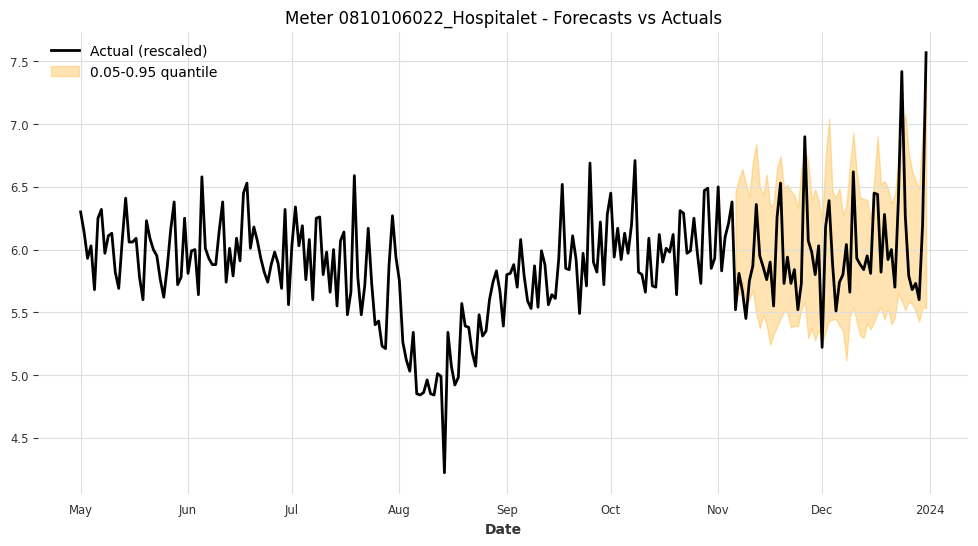

Meter 0810106022_Hospitalet - Coverage: 0.8750, Width: 1.1251



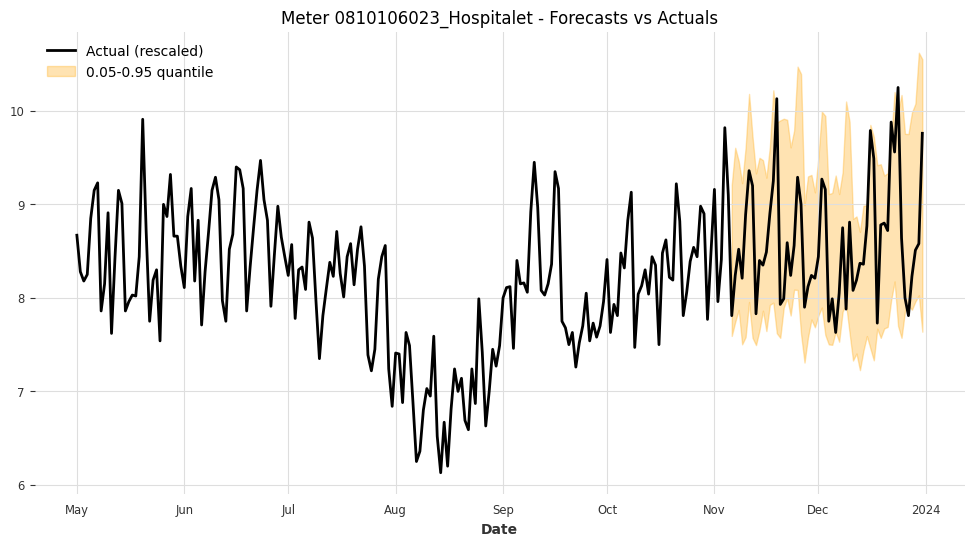

Meter 0810106023_Hospitalet - Coverage: 0.8929, Width: 1.9168



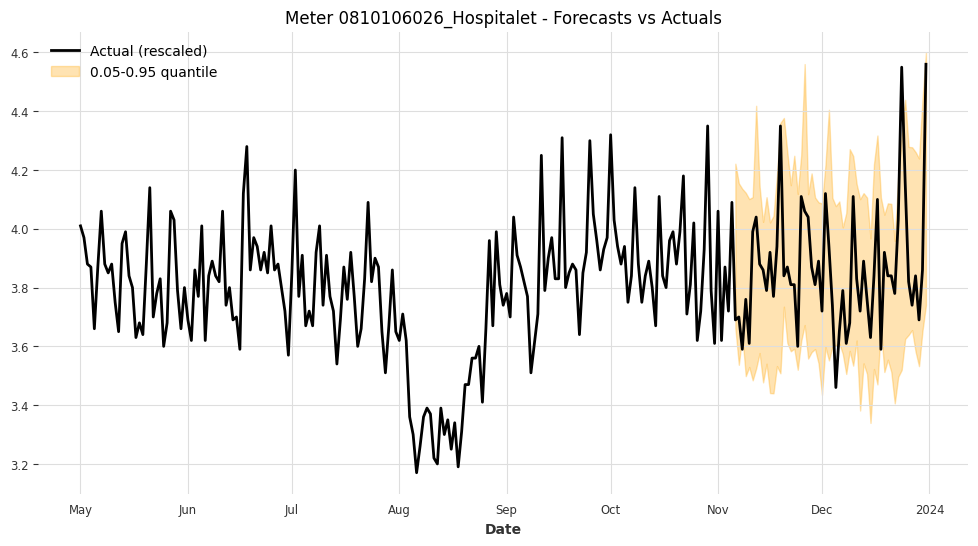

Meter 0810106026_Hospitalet - Coverage: 0.9286, Width: 0.6322



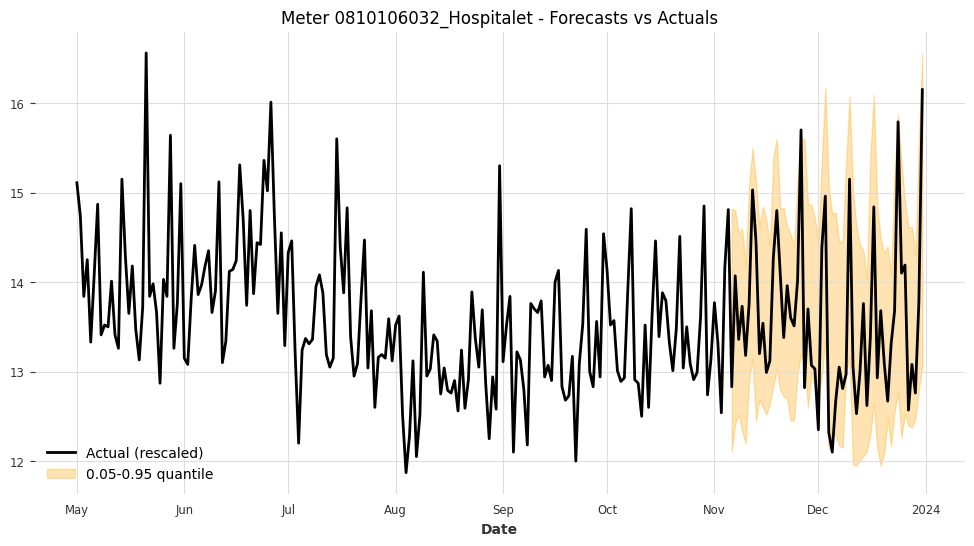

Meter 0810106032_Hospitalet - Coverage: 0.9107, Width: 2.3851



In [ ]:
import matplotlib.pyplot as plt
from darts import concatenate  # Darts utility to merge TimeSeries

for meter_id, hfcs in all_hfcs.items():
    # Get the actual time series
    ts = scaled_calib_test_series[meter_id]

    # Get scaler and results
    scaler = scalers_test[meter_id]
    df_result = all_bt_results[meter_id]
    coverage = df_result["Coverage"].iloc[0]
    width = df_result["Width rescaled"].iloc[0]

    # Start a new plot
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot actuals (rescaled)
    ts_orig = scaler.inverse_transform(ts)
    ts_orig.plot(ax=ax, label='Actual (rescaled)', lw=2)

    full_lower = []
    full_upper = []

    # Collect lower and upper quantiles from each forecast window
    for forecast in hfcs:
        if ('Consumption per meter_q0.05' in forecast.components
            and 'Consumption per meter_q0.95' in forecast.components):

            lower = forecast['Consumption per meter_q0.05']
            upper = forecast['Consumption per meter_q0.95']
            lower_orig = scaler.inverse_transform(lower)
            upper_orig = scaler.inverse_transform(upper)
            full_lower.append(lower_orig)
            full_upper.append(upper_orig)


    if full_lower and full_upper:
        # Concatenate all the TimeSeries pieces into full series
        combined_lower = concatenate(full_lower)
        combined_upper = concatenate(full_upper)

        # Plot the quantile area as a filled region
        ax.fill_between(
            combined_lower.time_index,
            combined_lower.values().flatten(),
            combined_upper.values().flatten(),
            color='orange',
            alpha=0.3,
            label='0.05-0.95 quantile'
        )

    ax.set_title(f"Meter {meter_id} - Forecasts vs Actuals")
    ax.legend()
    plt.show()

    # Print the metrics below each plot
    print(f"Meter {meter_id} - Coverage: {coverage:.4f}, Width: {width:.4f}\n")